In [1]:
# load packages and functions
suppressMessages(library(data.table))
suppressMessages(library(dplyr))
suppressMessages(library(ggplot2))
suppressMessages(library(ggpointdensity))
suppressMessages(library(ggrepel))
suppressMessages(library(ggsci))
suppressMessages(library(ggthemes))
suppressMessages(library(magrittr))
suppressMessages(library(patchwork))
suppressMessages(library(RColorBrewer))
suppressMessages(library(stringr))
suppressMessages(library(tidyverse))
suppressMessages(library(viridis))
suppressMessages(library(ComplexHeatmap))

selected_markers<- c("CD45",
                     "CD172ab",
                     "CD8a",
                     "CD20",
                     "CD4",
                     "CD3",
                     "CD56",
                     "CCR6",
                     "CD45RA",
                     "MX1",
                     "CCR4",
                     "PU.1",
                     "SH2D1A",
                     "CD45RO",
                     "CXCR3",
                     "GZMK",
                     "TACTILE",
                     "PD-1",
                     "CTLA-4",
                     "CD69",
                     "CXCR5",
                     "CD15s",
                     "CD8b",
                     "CD25",
                     "CD39",
                     "TCF1",
                     "ICOS",
                     "AHR",
                     "Nur77",
                     "CCR2",
                     "CD161",
                     "FoxP3",
                     "CD40L",
                     "GZMB",
                     "Helios",
                     "CX3CR1",
                     "RORgt",
                     "CD127",
                     "GATA3",
                     "TIGIT",
                     "Ki67",
                     "T-bet",
                     "CCR7",
                     "CD57",
                     "HLA-DR",
                     "CD103",
                     "CD38",
                     "CD11b")

# set parameters
prop = 0.1
n_min = 10000
frac = 0.90
n_neighbors=30
min_dist=0.01
resolution_list=0.7

# cluster annotation
cluster_df = read.table("/projects/jinamo@xsede.org/cytof/data/cluster_annotation.txt",sep="\t",header=TRUE) %>%
    dplyr::filter(cell=="T") %>%
    dplyr::select(-cell) %>%
    dplyr::mutate(cluster = as.character(cluster))


In [2]:
exp_ds <- readRDS(file = "/projects/jinamo@xsede.org/cytof/data/T_cells/T_downsampled_Cells.rds")

`summarise()` has grouped output by 'subject_id__time'. You can override using
the `.groups` argument.


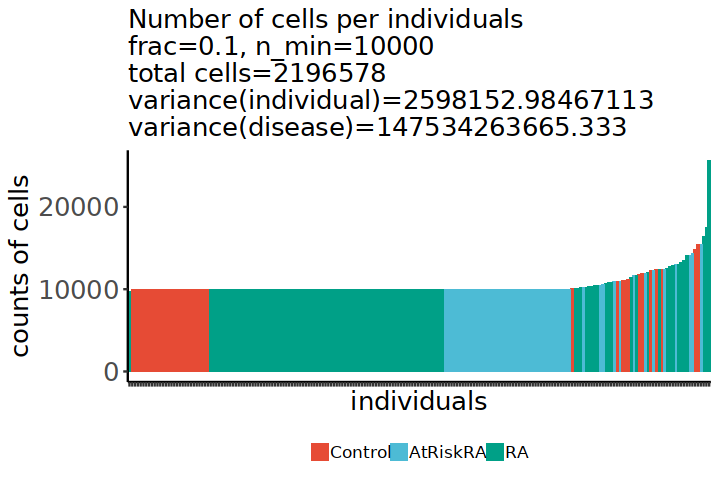

In [3]:
tmp = cbind(
  exp_ds %>%
    dplyr::group_by(subject_id__time) %>%
    dplyr::summarise(cell_counts = n()) %>%
    dplyr::summarise(Total_cell_count=sum(cell_counts), ind_variance=var(cell_counts)),
  exp_ds %>%
    dplyr::group_by(disease) %>%
    dplyr::summarise(cell_counts = n()) %>%
    dplyr::summarise(disease_variance=var(cell_counts))
)
options(repr.plot.height = 4, repr.plot.width = 6)
exp_ds %>%
       dplyr::group_by(subject_id__time, disease) %>%
       dplyr::summarise(cell_counts = n()) %>%
       dplyr::ungroup() %>%
       dplyr::arrange(desc(cell_counts)) %>%
       ggplot() + 
       geom_bar(aes(reorder(subject_id__time,cell_counts),cell_counts, fill = disease), stat = 'identity') + 
       theme_classic() +
       scale_fill_npg() +
       # facet_grid( ~ disease) + 
       theme(strip.text.x=element_text(size=15, color="black", face="bold"),
             strip.text.y=element_text(size=15, color="black", face="bold"),
             legend.position = "bottom",
             plot.title = element_text(size=15),
             axis.title.x = element_text(size=15),
             axis.title.y = element_text(size =15),
             axis.text.y = element_text(size = 15),
             axis.text.x = element_blank(),
             legend.text =  element_text(size = 10), 
             legend.key.size = grid::unit(0.8, "lines"),
             legend.title = element_text(size = 0, hjust = 0)) +
       labs(title = paste0("Number of cells per individuals\nfrac=", prop, ", n_min=",n_min, "\ntotal cells=", tmp$Total_cell_count, "\nvariance(individual)=",tmp$ind_variance,"\nvariance(disease)=",tmp$disease_variance),
            x = 'individuals',
            y = "counts of cells") 

In [4]:
exp_ds %>%
       dplyr::group_by(disease,time_point) %>%
       dplyr::summarise(cell_counts = n())

`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.


disease,time_point,cell_counts
<fct>,<chr>,<int>
Control,V0,425288
AtRiskRA,V0,608352
RA,V0,657908
RA,V1,265080
RA,V2,239950


In [5]:
pca_res <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/PCA_embeddings_Prop",prop,"_Nmin",n_min,"_topVar",frac,".rds"))
batch_fl = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/meta_Prop",prop,"_Nmin",n_min,".rds"))

# check the data
print(dim(pca_res$x))
print(head(pca_res$x))
print(dim(batch_fl))
print(head(batch_fl))

[1] 2196578      20
             PC1         PC2         PC3        PC4        PC5        PC6
[1,]  1.51408375  2.45986974  0.81503947  0.8999610  0.1233207 -1.5001340
[2,]  0.05807572  0.30252470  2.38240770 -1.0714849 -2.7157063 -4.1492536
[3,] -2.26823650 -0.51223370  0.07957479 -0.1761838  0.7690129 -0.0494538
[4,] -1.98477894 -0.78563204  0.40252880 -0.7200324 -0.5942267  1.0118984
[5,] -1.60617841 -0.62236210  0.70820107 -0.7455103 -0.2514995 -0.3273823
[6,] -1.73734813  0.07595996 -1.21290491 -0.7878943  1.4812260 -0.7841178
            PC7         PC8         PC9        PC10       PC11        PC12
[1,] -0.1514673  1.63367120 -1.55012337 -0.05002431  0.2732293 -0.85250189
[2,] -0.6491986  0.22115487  0.78608902 -0.20749193  0.1864619  0.29108184
[3,]  0.8158111  0.57585809 -0.53492656  0.80961786  1.1946823  0.78817810
[4,] -0.2475332 -0.85336227 -0.07618628 -0.57008958 -0.9576320  0.07145347
[5,]  0.1367871  0.58681707 -0.08202859  0.66164458 -0.5674256 -0.83906155
[6,]  0.1011

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation ideoms with `aes()`”


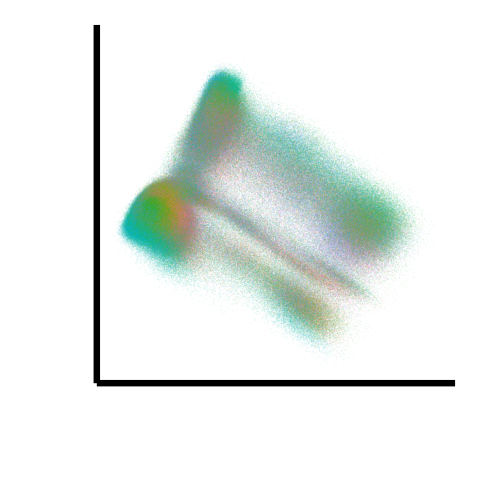

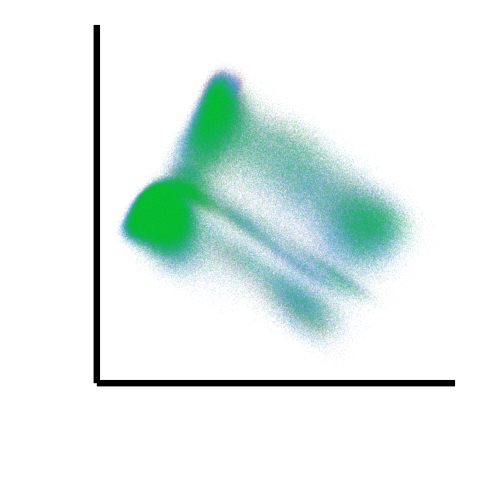

In [6]:
options(repr.plot.height = 4, repr.plot.width = 4)
ggplot() +
    geom_point(
        data = data.frame(pca_res$x[,c("PC1","PC2")],batch_fl),
        mapping = aes_string(x = "PC1", y = "PC2", color = "batch"),
        size = 0.001, stroke = 0, shape = 16, alpha = 0.1
    ) +
    #scale_fill_manual(values = meta_colors$batch, name = "") +
   # facet_wrap( ~ batch, scales = "free") +
    labs(
        x = "",
        y = ""
    ) +
    theme_classic(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face = "italic")
    )

ggplot() +
    geom_point(
        data = data.frame(pca_res$x[,c("PC1","PC2")],batch_fl),
        mapping = aes_string(x = "PC1", y = "PC2", color = "condition"),
        size = 0.001, stroke = 0, shape = 16, alpha = 0.1
    ) +
    #scale_fill_manual(values = meta_colors$batch, name = "") +
   # facet_wrap( ~ batch, scales = "free") +
    labs(
        x = "",
        y = ""
    ) +
    theme_classic(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face = "italic")
    )

In [7]:
harmony_embeddings_all <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/harmony_embeddings_Prop",prop,"_Nmin",n_min,"_topVar",frac,".rds"))
batch_fl = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/meta_Prop",prop,"_Nmin",n_min,".rds"))

In [8]:
print(head(harmony_embeddings_all))
print(dim(harmony_embeddings_all))

             PC1         PC2        PC3          PC4        PC5         PC6
[1,]  1.99860266  2.30688085  1.4292079  0.950931758  0.2167589 -1.24418177
[2,] -0.03390258  0.24085536  2.4242632 -1.089907647 -2.3870460 -3.54459032
[3,] -2.15002389 -0.70642941  0.5569366 -0.001987076  0.7541414  0.19482760
[4,] -1.76200641 -0.82334876  0.6691382 -0.518159226 -0.5605855  1.34728312
[5,] -1.43563479 -0.71063739  1.2461366 -0.694409657 -0.2739783 -0.05901363
[6,] -1.56857991 -0.05206011 -1.0984572 -0.639709833  1.4455237 -0.57006287
            PC7        PC8          PC9       PC10         PC11       PC12
[1,]  0.2489401  0.8579321 -1.592722271 -0.1588523  0.002364261 -0.5980873
[2,] -0.3348443 -0.2960081  0.803713363 -0.3818554 -0.024890286  0.3154941
[3,]  0.7711156  0.1024833 -0.481610233  0.5489358  0.821775842  1.2230060
[4,]  0.3800929 -1.6927061  0.038944875 -1.1250716 -1.067391597  0.5128490
[5,]  0.6168624 -0.3048199  0.059377962  0.2061057 -0.708734635 -0.4203412
[6,] -0.1170739 -0

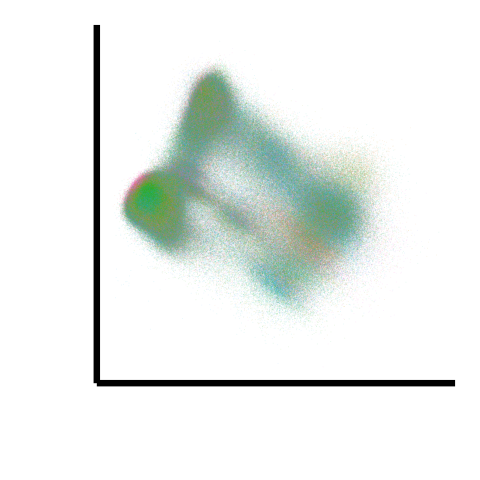

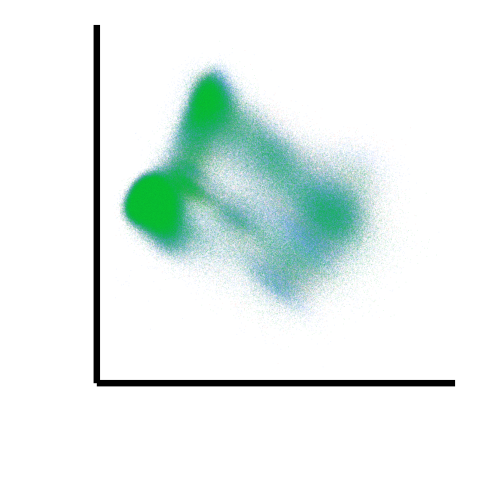

In [9]:

options(repr.plot.height = 4, repr.plot.width = 4)
ggplot() +
    geom_point(
        data = data.frame(harmony_embeddings_all,batch_fl),
        mapping = aes_string(x = "PC1", y = "PC2", color = "batch"),
        size = 0.001, stroke = 0, shape = 16, alpha = 0.1
    ) +
    #scale_fill_manual(values = meta_colors$batch, name = "") +
   # facet_wrap( ~ batch, scales = "free") +
    labs(
        x = "",
        y = ""
    ) +
    theme_classic(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face = "italic")
    )

ggplot() +
    geom_point(
        data = data.frame(harmony_embeddings_all,batch_fl),
        mapping = aes_string(x = "PC1", y = "PC2", color = "condition"),
        size = 0.001, stroke = 0, shape = 16, alpha = 0.1
    ) +
    #scale_fill_manual(values = meta_colors$batch, name = "") +
   # facet_wrap( ~ batch, scales = "free") +
    labs(
        x = "",
        y = ""
    ) +
    theme_classic(base_size = 30) +
    theme(
        legend.position = "none",
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face = "italic")
    )

`summarise()` has grouped output by 'key'. You can override using the `.groups`
argument.


key,group,median
<chr>,<chr>,<dbl>
Race,after,2.878582
Race,before,2.647553
Site,after,4.345290
Site,before,3.718097
batch,after,6.507698
batch,before,4.247662
condition,after,2.208206
condition,before,2.106708
individual,after,10.568528


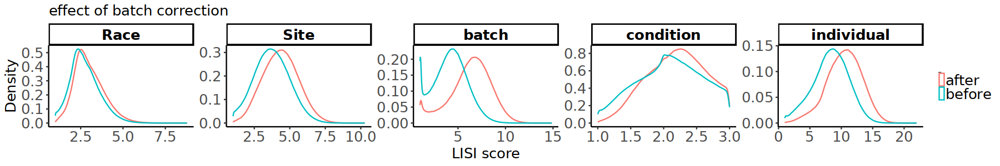

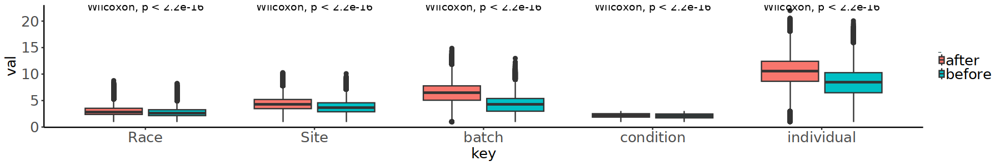

In [10]:
# using PC1-20
LISI_df = rbind(
    readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/LISI_harmony.rds")) %>%
        dplyr::mutate(group = "after"),
    readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/LISI_PCA.rds")) %>%
        dplyr::mutate(group = "before")
    ) %>%
    dplyr::mutate(key = ifelse(key=="OmiqFileIndex", "individual", key))

LISI_df %>%
    dplyr::group_by(key,group) %>%
    dplyr::summarize(median = median(val))

options(repr.plot.height = 2.5, repr.plot.width = 15)
ggplot(LISI_df) +
      geom_density(
        aes(x  = val, color = group) 
      ) +
      #   scale_x_continuous(limits = c(1, 15))+
      labs(
        title = "effect of batch correction",
        x = "LISI score",
        y = "Density"
      ) +
      facet_wrap( ~ key, scales = "free", ncol = 5) +
      theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "right",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) 

LISI_df %>% 
  ggplot(aes(x=key, y=val, fill=group)) +
  geom_boxplot() +
  ggpubr::stat_compare_means(method= "wilcox.test") +
  theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "right",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) 

`summarise()` has grouped output by 'key'. You can override using the `.groups`
argument.


key,group,median
<chr>,<chr>,<dbl>
Race,after,3.224988
Race,before,3.184426
Site,after,5.144789
Site,before,5.028388
batch,after,9.540014
batch,before,8.577668
condition,after,2.392334
condition,before,2.384227
individual,after,16.104424


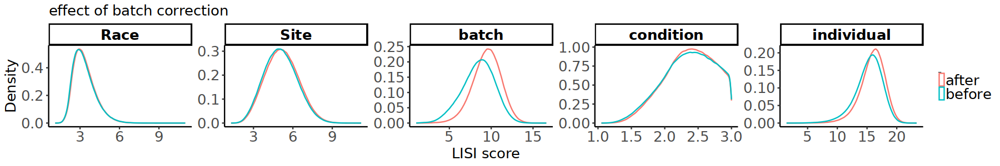

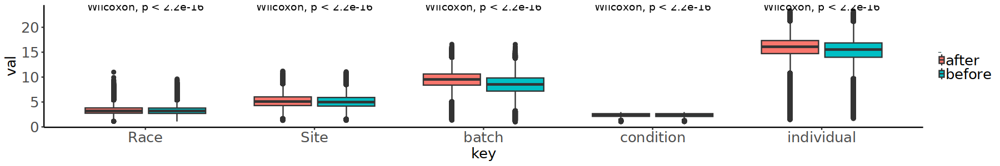

In [11]:
# using PC1-2
LISI_df = rbind(
    readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/LISI_harmony_PC12.rds")) %>%
        dplyr::mutate(group = "after"),
    readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/LISI_PCA_PC12.rds")) %>%
        dplyr::mutate(group = "before")
    ) %>%
    dplyr::mutate(key = ifelse(key=="OmiqFileIndex", "individual", key))

LISI_df %>%
    dplyr::group_by(key,group) %>%
    dplyr::summarize(median = median(val))

options(repr.plot.height = 2.5, repr.plot.width = 15)
ggplot(LISI_df) +
      geom_density(
        aes(x  = val, color = group) 
      ) +
      #   scale_x_continuous(limits = c(1, 15))+
      labs(
        title = "effect of batch correction",
        x = "LISI score",
        y = "Density"
      ) +
      facet_wrap( ~ key, scales = "free", ncol = 5) +
      theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "right",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) 

LISI_df %>% 
  ggplot(aes(x=key, y=val, fill=group)) +
  geom_boxplot() +
  ggpubr::stat_compare_means(method= "wilcox.test") +
  theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "right",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) 

In [12]:
# UMAP visualization
umap_res <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/umap_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
print(dim(umap_res))
print(head(umap_res))
print(table(umap_res$res_cell))
umap_res$res_cell = factor(umap_res$res_cell, levels=sort(as.integer(unique(umap_res$res_cell))))
umap_res$res_cell

[1] 2196578       5
      UMAP1     UMAP2 disease batch res_cell
1 -9.449675 -2.127851 Control    15        8
2 -5.845147  1.816677 Control    15       12
3  6.496284  2.399950 Control    15        7
4  3.813404  3.555250 Control    15        5
5  2.793026  4.641660 Control    15        1
6  7.370950 -4.017954 Control    15        0

     0      1     10    100    101    102    103    104    105    106    107 
285601 216101  96470      1      1      1      1      1      1      1      1 
   108    109     11    110    111    112    113    114    115    116    117 
     1      1  82282      1      1      1      1      1      1      1      1 
   118    119     12    120    121    122    123    124    125    126    127 
     1      1  69608      1      1      1      1      1      1      1      1 
   128    129     13    130    131    132    133    134    135    136    137 
     1      1  63677      1      1      1      1      1      1      1      1 
   138    139     14    140    141    14

[1] 8  12 7  5  1  0  3  1  14 3  4  0  0  4  2  1  2  5  3  6  1  2  7  0 
   [25] 12 3  14 4  3  6  3  3  4  0  9  0  8  2  0  7  2  9  17 16 0  3  8  12
   [49] 1  0  2  2  6  2  3  0  2  3  10 4  3  12 12 4  5  12 2  3  4  8  0  4 
   [73] 9  3  6  0  4  14 9  12 12 4  0  3  8  5  2  7  3  2  3  0  6  8  6  9 
   [97] 0  3  2  0  7  1  7  12 7  9  4  2  6  4  2  12 10 12 0  14 0  12 4  3 
  [121] 3  7  2  2  1  1  3  12 1  16 1  7  7  9  17 4  4  3  2  12 12 6  0  2 
  [145] 0  4  12 2  7  3  3  10 12 0  9  10 7  0  12 4  1  2  10 5  5  0  1  3 
  [169] 1  0  9  3  12 12 3  5  0  0  0  17 0  4  3  7  12 9  1  1  0  2  3  2 
  [193] 3  14 0  2  7  4  9  2  15 14 4  6  6  12 8  4  10 3  4  1  2  4  4  4 
  [217] 2  12 6  12 9  8  14 2  0  2  5  1  2  3  8  6  1  10 2  14 4  6  9  7 
  [241] 3  4  14 8  4  0  1  4  12 1  4  2  2  0  0  4  9  10 9  9  8  9  4  15
  [265] 12 6  12 17 4  1  0  3  1  1  17 11 4  12 2  12 4  5  2  5  0  6  4  3 
  [289] 3  11 14 2  12 12 7  3  7  0  0  12 5  10 0  0  12 4  2  10 0  9  6  0 
  [313] 12 4  0  16 3  0  6  5  1  0  0  2  12 12 8  5  7  3  14 11 2  7  12 1 
  [337] 1  4  8  2  12 2  4  8  0  12 2  4  8  0  4  12 8  10 2  2  12 0  0  7 
  [361] 3  10 1  12 3  0  5  0  2  12 14 2  4  5  4  3  3  4  7  4  17 3  12 0 
  [385] 2  12 2  14 5  2  6  20 4  3  3  12 1  3  12 12 7  10 9  2  12 0  1  3 
  [409] 3  12 8  3  17 2  12 1  3  6  0  12 3  0  9  0  4  3  9  2  4  7  2  4 
  [433] 4  6  0  1  3  4  4  0  12 12 1  4  8  3  12 0  3  1  5  12 0  3  2  19
  [457] 10 0  3  8  8  7  4  7  0  7  1  0  3  8  7  0  4  12 6  4  5  0  17 3 
  [481] 0  12 1  0  3  0  12 4  12 12 11 2  0  0  3  12 3  10 8  0  7  4  6  0 
  [505] 7  11 3  10 20 14 4  0  4  6  10 4  1  12 0  17 2  7  12 4  4  3  3  0 
  [529] 2  1  2  3  1  9  6  2  0  4  7  12 6  12 17 6  12 17 2  12 8  2  12 4 
  [553] 20 17 4  4  7  3  0  9  2  4  4  2  0  2  4  3  0  11 0  12 14 4  0  12
  [577] 0  7  7  9  17 6  6  1  2  2  11 9  3  16 3  9  0  12 12 0  18 3  15 12
  [601] 0  0  2  0  0  16 12 3  1  2  7  16 7  0  0  6  0  4  6  6  12 0  2  2 
  [625] 4  7  15 2  2  1  1  2  12 0  12 7  4  2  0  6  15 7  3  17 7  0  2  12
  [649] 10 7  4  1  0  0  10 6  4  0  4  9  3  19 3  9  3  8  1  4  0  5  2  0 
  [673] 2  0  2  10 3  2  3  4  7  2  3  1  3  4  0  0  1  4  2  4  4  6  17 1 
  [697] 12 4  8  0  14 12 0  3  2  9  17 4  3  4  3  16 0  3  2  0  6  0  7  12
  [721] 4  7  4  12 1  4  7  12 12 2  0  12 14 9  3  7  2  0  1  12 14 2  3  0 
  [745] 0  0  1  12 0  4  6  0  0  4  9  9  7  2  12 1  6  3  6  0  0  3  8  8 
  [769] 0  2  0  5  15 4  0  6  19 5  4  6  15 14 8  1  3  9  4  1  0  9  3  0 
  [793] 6  1  4  1  0  5  12 0  0  1  4  0  4  0  3  9  3  4  4  14 17 1  0  1 
  [817] 0  4  0  8  4  3  10 5  8  5  5  9  1  6  3  19 12 12 12 6  6  9  3  4 
  [841] 1  0  1  8  2  11 7  0  1  3  2  1  1  12 0  0  0  0  6  1  0  5  3  4 
  [865] 10 7  7  0  3  0  2  4  0  5  12 12 8  0  4  12 9  4  12 5  2  0  4  1 
  [889] 3  9  8  4  19 0  4  12 4  17 1  3  1  12 2  0  8  6  12 4  3  17 3  12
  [913] 0  2  3  1  3  5  1  9  7  0  3  0  17 1  6  1  4  4  8  17 12 15 1  12
  [937] 8  4  0  6  12 1  2  9  0  3  6  0  2  3  11 6  3  2  1  1  12 12 4  2 
  [961] 10 1  8  0  3  12 3  10 2  12 4  0  17 14 0  4  7  0  4  2  2  0  9  15
  [985] 3  3  8  3  5  14 6  12 3  2  1  10 12 3  0  12 12 4  6  2  0  1  0  15
 [1009] 18 4  3  9  6  12 7  12 0  15 9  12 2  6  3  4  1  4  10 1  12 19 3  3 
 [1033] 1  3  12 2  12 1  12 3  4  6  3  7  4  11 2  17 2  9  4  12 9  12 0  4 
 [1057] 0  6  12 1  12 7  9  2  4  7  12 12 4  12 0  2  4  8  7  6  0  1  17 14
 [1081] 5  4  9  0  4  4  3  6  1  12 1  4  11 3  0  0  2  4  8  7  0  12 4  0 
 [1105] 12 1  6  12 1  2  5  4  4  0  2  0  8  17 4  1  11 4  2  7  1  1  12 1 
 [1129] 1  1  4  0  2  3  6  1  6  3  7  1  2  1  12 17 4  2  12 10 12 4  14 4 
 [1153] 3  0  12 2  4  4  7  12 2  14 2  0  3  14 7  1  0  0  3  2  6  17 8  0 
 [1177] 6  3  3  0  1  12 12 17 0  4  11 3  12 3  0  4  0  12 0  4  0  2  6  4 
 [12

In [13]:
# remove clusters less than cut off
min_cell_cluster = 30
clu = umap_res %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(count = dplyr::n()) %>%
    dplyr::arrange(count) %>%
    dplyr::filter(count > min_cell_cluster) %>%
    .$res_cell %>%
    unique()
clu_logi = umap_res$res_cell %in% clu
print(dim(umap_res[clu_logi,]))
print(table(umap_res[clu_logi,]$res_cell))
print(length(unique(umap_res[clu_logi,]$res_cell)))
umap_res = umap_res[clu_logi,]

[1] 2196401       5

     0      1      2      3      4      5      6      7      8      9     10 
285601 216101 196954 169690 166347 154153 137181 135980 106212 106031  96470 
    11     12     13     14     15     16     17     18     19     20     21 
 82282  69608  63677  53576  45563  37059  22964  20547  17655   7569   3912 
    22     23     24     25     26     27     28     29     30     31     32 
   774    390     74     31      0      0      0      0      0      0      0 
    33     34     35     36     37     38     39     40     41     42     43 
     0      0      0      0      0      0      0      0      0      0      0 
    44     45     46     47     48     49     50     51     52     53     54 
     0      0      0      0      0      0      0      0      0      0      0 
    55     56     57     58     59     60     61     62     63     64     65 
     0      0      0      0      0      0      0      0      0      0      0 
    66     67     68     69     70     71  

In [14]:
# Find cluster center
cluster_center <- umap_res %>%
  dplyr::group_by(res_cell) %>%
  dplyr::summarise_at(vars(UMAP1, UMAP2), dplyr::funs(median(., na.rm=TRUE)))
cluster_center <- as.data.frame(cluster_center)
cluster_center$res_cell <- as.character(cluster_center$res_cell)

Warning message:
“`funs()` was deprecated in dplyr 0.8.0.
ℹ Please use a list of either functions or lambdas:

# Simple named list: list(mean = mean, median = median)

# Auto named with `tibble::lst()`: tibble::lst(mean, median)

# Using lambdas list(~ mean(., trim = .2), ~ median(., na.rm = TRUE))”


In [15]:
# meta data

batch_fl = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/meta_Prop",prop,"_Nmin",n_min,".rds"))
batch_fl$subject_id <- stringr::str_split(batch_fl$OmiqFileIndex, pattern="_", simplify=TRUE)[,3] %>% 
  stringr::str_split(., pattern="\\-V", simplify=TRUE) %>%
  as.data.frame() %>%
  .[,1] %>%
  gsub("-","_",.)
batch_fl = batch_fl[clu_logi,]
umap_res$subject_id = batch_fl$subject_id
umap_res$time_point = batch_fl$time_point

meta<- read.table("/projects/jinamo@xsede.org/cytof/data/RA_AtRiskRA_Control_meta.txt",sep="\t",header=TRUE, na.strings=c("","NA")) %>%
    dplyr::mutate(age_at_biopsy = as.integer(age_at_biopsy),
                  diagnosis = factor(diagnosis, levels=c("Control","AtRiskRA","RA")))
meta = merge(umap_res,meta,by="subject_id")
meta = meta[order(match(meta$subject_id, umap_res$subject_id)),]
all(meta$subject_id == umap_res$subject_id)

meta_add = read.table("/projects/jinamo@xsede.org/cytof/data/meta_clinical_RA.txt", header = TRUE, sep = "\t") %>%
  dplyr::mutate(CDAI = as.numeric(CDAI),
                subject_id = gsub("-","_",subject_id),
                treatment = dplyr::case_when(
                  treatment == "1" ~ "naive",
                  treatment == "2" ~ "MTX failure",
                  treatment == "3" ~ "TNF failure",
                  treatment == "4" ~ "OA"
                )) %>%
  dplyr::select(-c(sex))
meta_add = dplyr::left_join(umap_res,meta_add,by="subject_id")

meta_total = read.csv("/projects/jinamo@xsede.org/cytof/data/Total_Metadata.csv") %>%
    dplyr::mutate(subject_id = gsub("-","_",Patient)) %>%
    dplyr::distinct(subject_id,Site,Race)
meta_total = meta_total[!(is.na(meta_total$Race) | meta_total$Race==""), ]
meta_total = merge(umap_res,meta_total,by="subject_id")
meta_total = meta_total[order(match(meta_total$subject_id, umap_res$subject_id)),]
all(meta_total$subject_id == umap_res$subject_id)

umap_res$AtRisk = dplyr::case_when(
  meta$AMP_Group == "FDR" & meta$CCP == "Positive" ~ "FDR(+)/ACPA(+)",
  meta$AMP_Group == "GP" & meta$CCP == "Positive" ~ "FDR(-)/ACPA(+)",
  meta$AMP_Group == "FDR" & meta$CCP == "Negative" ~ "FDR(+)/ACPA(-)",
  meta$AMP_Group == "GP" & meta$CCP == "Negative" ~ "FDR(-)/ACPA(-)",
  umap_res$disease == "Control" ~ "Control",
  umap_res$disease == "RA" ~ "RA")
umap_res$AtRisk = factor(umap_res$AtRisk,levels=c("Control","FDR(-)/ACPA(-)","FDR(+)/ACPA(-)","FDR(-)/ACPA(+)","FDR(+)/ACPA(+)","RA"))
umap_res$disease = dplyr::case_when(
  umap_res$AtRisk == "FDR(+)/ACPA(+)" | umap_res$AtRisk == "FDR(-)/ACPA(+)" | umap_res$AtRisk == "FDR(+)/ACPA(-)" ~ "AtRiskRA",
  umap_res$AtRisk == "Control" | umap_res$AtRisk == "FDR(-)/ACPA(-)" ~ "Control",
  umap_res$AtRisk == "RA" ~ "RA")
umap_res$disease = factor(umap_res$disease,levels=c("Control","AtRiskRA","RA"))
umap_res$age_at_biopsy <- as.numeric(meta$age_at_biopsy)
umap_res$sex <- as.numeric(factor(meta$sex, c('female', 'male')))
umap_res$ethnicity <- as.numeric(factor(meta$ethnicity, c('not_hispanic', 'hispanic_latino')))
umap_res$AMP_Group <- as.numeric(factor(meta$AMP_Group, c('GP', 'FDR')))
umap_res$CCP <- dplyr::case_when(
    meta$CCP == 'Negative' ~ "at-risk CCP(-)", 
    meta$CCP == 'Positive' ~ "at-risk CCP(+)",
    umap_res$AtRisk == "Control" ~ "Control")
umap_res$CCP <- factor(umap_res$CCP,levels=c("Control","at-risk CCP(-)","at-risk CCP(+)"))
umap_res$CCP30_titer <- as.numeric(meta$CCP30_titer)
umap_res$CCP31_titer <- as.numeric(meta$CCP31_titer)
umap_res$RF <- as.numeric(factor(meta$RF, c('Negative', 'Positive')))
umap_res$RF_IgM_titer <- as.numeric(meta$RF_IgM_titer)
umap_res$RF_IgG_titer <- as.numeric(meta$RF_IgG_titer)
umap_res$RF_IgA_titer <- as.numeric(meta$RF_IgA_titer)
umap_res$Site = meta_total$Site
umap_res$Race = meta_total$Race

head(umap_res)
table(umap_res$time_point)
table(umap_res$AtRisk)
table(umap_res$disease)

Warning message in mask$eval_all_mutate(quo):
“NAs introduced by coercion”


[1] TRUE

[1] TRUE

,UMAP1,UMAP2,disease,batch,res_cell,subject_id,time_point,AtRisk,age_at_biopsy,sex,...,AMP_Group,CCP,CCP30_titer,CCP31_titer,RF,RF_IgM_titer,RF_IgG_titer,RF_IgA_titer,Site,Race
,<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>,<chr>,<fct>,<dbl>,<dbl>,...,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,-9.449675,-2.127851,Control,15,8,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
2,-5.845147,1.816677,Control,15,12,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
3,6.496284,2.399950,Control,15,7,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
4,3.813404,3.555250,Control,15,5,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
5,2.793026,4.641660,Control,15,1,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]
6,7.370950,-4.017954,Control,15,0,200_0272,V0,Control,28,1,...,NA,Control,NA,NA,NA,NA,NA,NA,OMRF,[American Indian_Alaska tive]



     V0      V1      V2 
1691413  265060  239928 


       Control FDR(-)/ACPA(-) FDR(+)/ACPA(-) FDR(-)/ACPA(+) FDR(+)/ACPA(+) 
        425265          74068         246005          85036         203189 
            RA 
       1162838 


 Control AtRiskRA       RA 
  499333   534230  1162838 

In [16]:
get_density <- function(x, y, ...) {
  dens <- MASS::kde2d(x, y, ...)
  ix <- findInterval(x, dens$x)
  iy <- findInterval(y, dens$y)
  ii <- cbind(ix, iy)
  return(dens$z[ii])
}

umap_res = umap_res %>%
    dplyr::group_by(disease) %>%
    dplyr::mutate(density_disease = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(batch) %>%
    dplyr::mutate(density_batch = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(res_cell) %>%
    dplyr::mutate(density_cluster = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(AtRisk) %>%
    dplyr::mutate(density_AtRisk = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(time_point,AtRisk) %>%
    dplyr::mutate(density_time_AtRisk = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(CCP) %>%
    dplyr::mutate(density_AtRiskCCP = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(Site,AtRisk) %>%
    dplyr::mutate(density_site_AtRisk = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(Site,disease) %>%
    dplyr::mutate(density_site_condition = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(Race,AtRisk) %>%
    dplyr::mutate(density_race_AtRisk = get_density(UMAP1, UMAP2, n = 100)) %>%
    dplyr::ungroup()

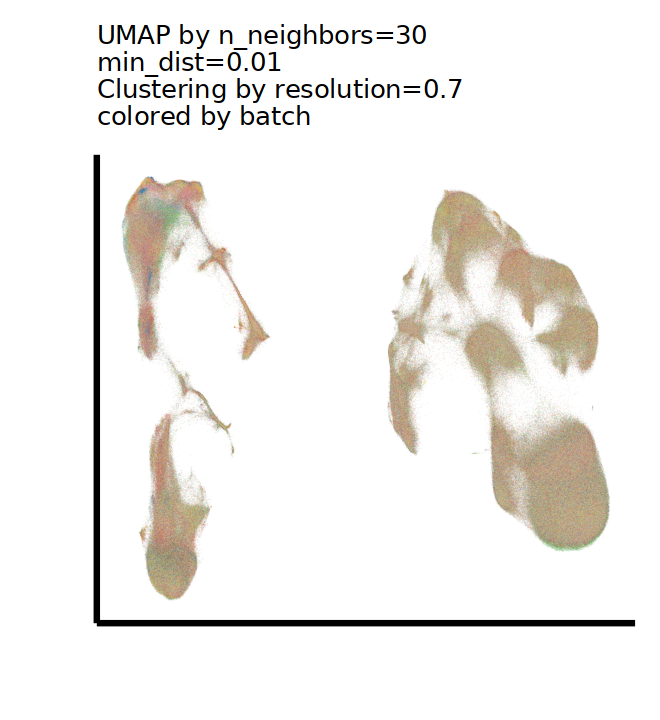

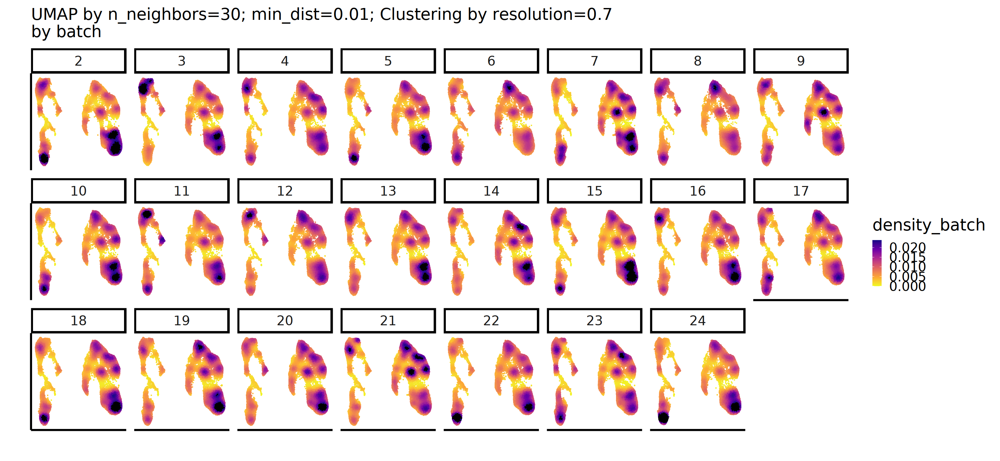

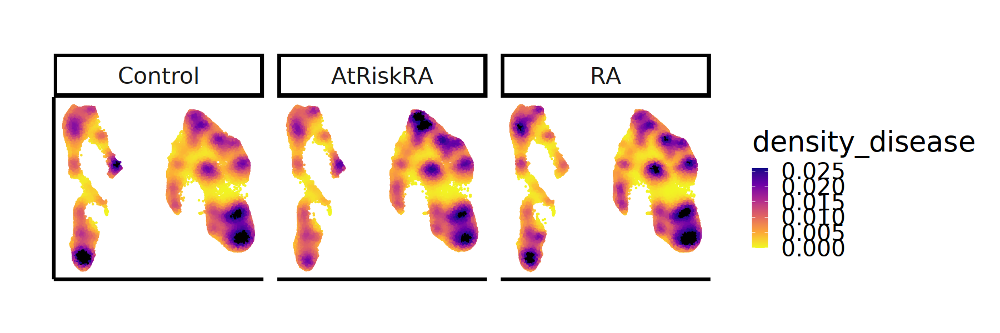

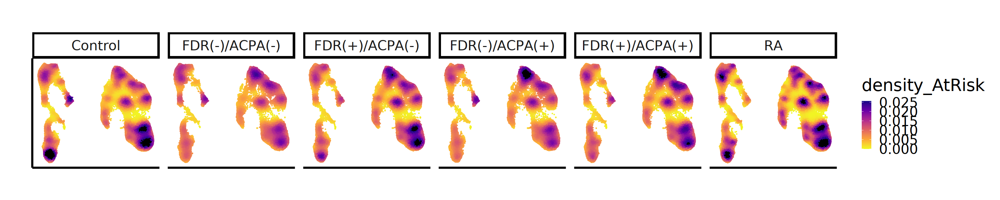

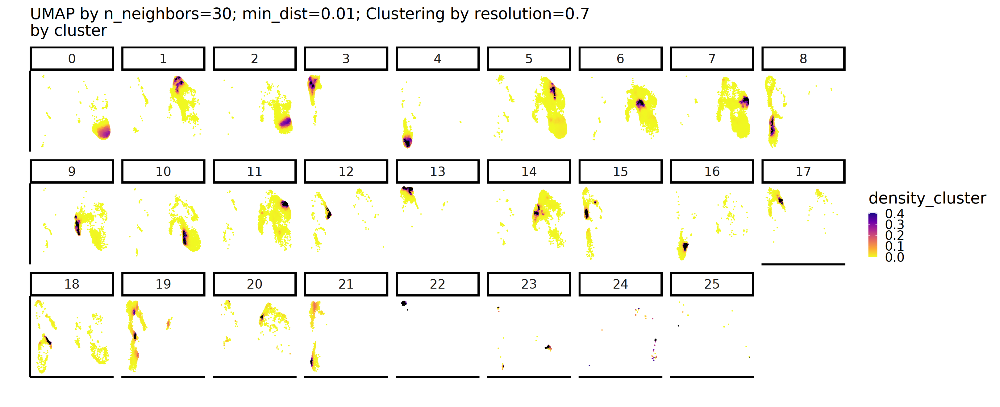

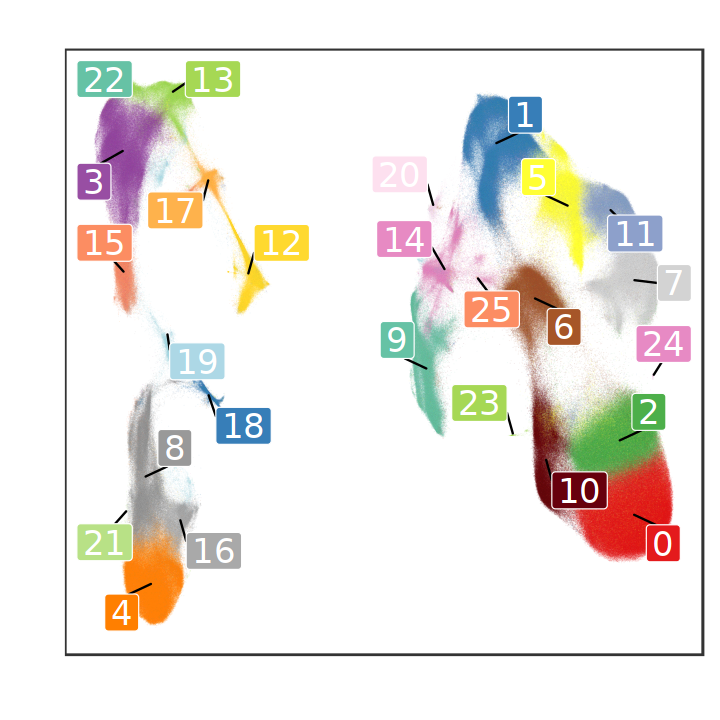

In [17]:


options(repr.plot.height = 6, repr.plot.width = 5.5)
plot(ggplot() +
       geom_point(
         data = umap_res,
         mapping = aes_string(x = "UMAP1", y = "UMAP2", color = "batch"),
         size = 0.01, stroke = 0, shape = 16, alpha = 0.1
       ) +
       scale_color_manual(values = c(
         "2" = "#4DAF4A",
         "3" = "#984EA3",
         "4" = "#FF7F00",
         "5" = "#FFFF33",
         "6" = "#A65628",
         "7" = "lightgrey",
         "8" = "#999999",
         "9" = "#66C2A5",
         "10" = "#67000D",
         "11" = "#8DA0CB",
         "12" = "#FFD92F",
         "13" = "#A6D854",
         "14" = "#E78AC3",
         "15" = "#FC8D62",
         "16" = "darkgrey",
         "17" = "#FEB24C",
         "18" = "#377EB8",
         "19" = "lightblue",
         "20" = "#FDE0EF",
         "21" = "#B8E186",
         "22" = "#66C2A5",
         "23" = "#E41A1C",
         "24" = "#377EB8")) +
       labs(
         title = paste0("UMAP by n_neighbors=",n_neighbors,"\nmin_dist=",min_dist,"\nClustering by resolution=",resolution_list,"\ncolored by batch"),
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "none",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=15, face = "italic")
       )
)

options(repr.plot.height = 12, repr.plot.width = 26)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_batch.png"), width = 5000, height = 3000,res=360)
plot(ggplot(umap_res) +
       geom_point(aes(UMAP1, UMAP2, color = density_batch),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma", direction = -1, na.value = "black",limits = c(0, quantile(umap_res$density_batch, probs = seq(0, 1, 0.1))["90%"])) +
       facet_wrap( ~ batch, ncol = 8) +
       labs(
         title = paste0("UMAP by n_neighbors=",n_neighbors,"; min_dist=",min_dist,"; Clustering by resolution=",resolution_list,"\nby batch"),
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)
# dev.off()

options(repr.plot.height = 5, repr.plot.width = 15)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_batch.png"), width = 5000, height = 3000,res=360)
plot(ggplot(umap_res) +
       geom_point(aes(UMAP1, UMAP2, color = density_disease),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma", direction = -1, na.value = "black",limits = c(0, quantile(umap_res$density_disease, probs = seq(0, 1, 0.1))["90%"])) +
       facet_wrap( ~ disease, ncol = 3) +
       labs(
         title = "",
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)


options(repr.plot.height = 5, repr.plot.width = 25)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_batch.png"), width = 5000, height = 3000,res=360)
plot(ggplot(umap_res) +
       geom_point(aes(UMAP1, UMAP2, color = density_AtRisk),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma", direction = -1, na.value = "black",limits = c(0, quantile(umap_res$density_AtRisk, probs = seq(0, 1, 0.1))["90%"])) +
       facet_wrap( ~ AtRisk, ncol = 6) +
       labs(
         title = "",
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)

options(repr.plot.height = 11, repr.plot.width = 27)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_batch.png"), width = 5000, height = 3000,res=360)
plot(ggplot(umap_res) +
       geom_point(aes(UMAP1, UMAP2, color = density_cluster),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma", direction = -1, na.value = "black",limits = c(0, quantile(umap_res$density_cluster, probs = seq(0, 1, 0.1))["70%"])) +
       facet_wrap( ~ res_cell, nrow = 3) +
       labs(
         title = paste0("UMAP by n_neighbors=",n_neighbors,"; min_dist=",min_dist,"; Clustering by resolution=",resolution_list,"\nby cluster"),
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)

options(repr.plot.height = 6, repr.plot.width = 6)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_cluster.png"), width = 1400, height = 1400,res=360)
plot(ggplot() +
       geom_point(
         data = umap_res %>% dplyr::mutate(res_cell = factor(res_cell,levels=cluster_df$cluster)),
         mapping = aes_string(x = "UMAP1", y = "UMAP2", color = "res_cell"),
         size = 0.01, stroke = 0, shape = 16, alpha = 0.1
       ) +
       geom_label_repel(
         data = cluster_center,
         aes(x = UMAP1, y = UMAP2, label = res_cell, fill = res_cell),
         color = "white",segment.color = "black",
           size = 7,
         min.segment.length = 0, seed = 42, box.padding = 0.5
       ) +
       scale_color_manual(values = c(
         "0" = "#E41A1C",
         "1" = "#377EB8",
         "2" = "#4DAF4A",
         "3" = "#984EA3",
         "4" = "#FF7F00",
         "5" = "#FFFF33",
         "6" = "#A65628",
         "7" = "lightgrey",
         "8" = "#999999",
         "9" = "#66C2A5",
         "10" = "#67000D",
         "11" = "#8DA0CB",
         "12" = "#FFD92F",
         "13" = "#A6D854",
         "14" = "#E78AC3",
         "15" = "#FC8D62",
         "16" = "darkgrey",
         "17" = "#FEB24C",
         "18" = "#377EB8",
         "19" = "lightblue",
         "20" = "#FDE0EF",
         "21" = "#B8E186",
         "22" = "#66C2A5",
         "23" = "#A6D855",
         "24" = "#E78AC4",
         "25" = "#FC8D63",
         "26" = "brown",
         "27" = "#FEB25C",
         "28" = "#377EB9",
         "29" = "lightgreen",
         "30" = "#FDE1EF"
       )) +
       scale_fill_manual(values = c(
         "0" = "#E41A1C",
         "1" = "#377EB8",
         "2" = "#4DAF4A",
         "3" = "#984EA3",
         "4" = "#FF7F00",
         "5" = "#FFFF33",
         "6" = "#A65628",
         "7" = "lightgrey",
         "8" = "#999999",
         "9" = "#66C2A5",
         "10" = "#67000D",
         "11" = "#8DA0CB",
         "12" = "#FFD92F",
         "13" = "#A6D854",
         "14" = "#E78AC3",
         "15" = "#FC8D62",
         "16" = "darkgrey",
         "17" = "#FEB24C",
         "18" = "#377EB8",
         "19" = "lightblue",
         "20" = "#FDE0EF",
         "21" = "#B8E186",
         "22" = "#66C2A5",
         "23" = "#A6D855",
         "24" = "#E78AC4",
         "25" = "#FC8D63",
         "26" = "brown",
         "27" = "#FEB25C",
         "28" = "#377EB9",
         "29" = "lightgreen",
         "30" = "#FDE1EF"
       )) +
       labs(
         x = "",
         y = "",
         title = ""
       ) +
       theme_bw(base_size = 20) +
       theme(
         legend.position = "none",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=10)
       ) 
)
# dev.off()


In [18]:
exprs_norm <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/arcsinh_transformed_transposed_Prop",prop,"_Nmin",n_min,".rds"))
print(dim(exprs_norm))
exprs_norm = exprs_norm[, clu_logi]

[1]      48 2196578


In [19]:
clu_marker <- presto::wilcoxauc(exprs_norm, umap_res$res_cell)
x <- clu_marker %>%
  dplyr::group_by(group) %>%
  dplyr::top_n(9, wt = logFC) 
x
# x[order(x$cluster, decreasing = FALSE),]


## parameter	description
## feature	name of feature.
## group	name of group label.
## avgExpr	mean value of feature in group.
## logFC	log fold change between observations in group vs out.
## statistic	Wilcoxon rank sum U statistic.
## auc	area under the receiver operator curve.
## pval	nominal p value, from two-tailed Gaussian approximation of U statistic.
## padj	Benjamini-Hochberg adjusted p value.
## pct_in	Percent of observations in the group with non-zero feature value.
## pct_out	Percent of observations out of the group with non-zero feature value.

feature,group,avgExpr,logFC,statistic,auc,pval,padj,pct_in,pct_out
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CD20,0,0.12565013,0.020109287,280601260667,0.5141794,2.195562e-132,2.395158e-132,100,100
CD4,0,2.53147350,0.883637578,375968270362,0.6889318,0.000000e+00,0.000000e+00,100,100
CD3,0,3.36791863,0.414896325,396349254522,0.7262783,0.000000e+00,0.000000e+00,100,100
CD45RA,0,1.65441559,1.095449866,460779615498,0.8443418,0.000000e+00,0.000000e+00,100,100
TCF1,0,1.89472049,0.855985010,415422285591,0.7612281,0.000000e+00,0.000000e+00,100,100
CD127,0,1.96140197,0.043021854,266257180738,0.4878950,5.140392e-97,5.483085e-97,100,100
CCR7,0,0.95578197,0.656703895,436935995034,0.8006503,0.000000e+00,0.000000e+00,100,100
CD38,0,0.64684273,0.385536620,397288553313,0.7279995,0.000000e+00,0.000000e+00,100,100
CD11b,0,0.03580665,-0.007356014,269031989432,0.4929796,8.053172e-34,8.224517e-34,100,100


In [20]:
## Heatmap of marker genes
# marker_plot <- unique(x$feature)
marker_plot <- unique(clu_marker$feature)

exp_heat <- exprs_norm[marker_plot,]
exp_heat <- t(exp_heat)
exp_heat <- as.data.frame(exp_heat)
exp_heat$res_cell <- as.character(umap_res$res_cell)

exp_ave <- aggregate(exp_heat[, 1:(ncol(exp_heat)-1)], list(exp_heat$res_cell), mean)
colnames(exp_ave)[1] <- "res_cell"
exp_ave <- as.data.frame(t(exp_ave))
colnames(exp_ave) <- as.character(t(exp_ave[1,]))
exp_ave <- exp_ave[-1,]
row_names <- rownames(exp_ave)
exp_ave <- mutate_all(exp_ave, function(x) as.numeric(as.character(x)))
rownames(exp_ave) <- row_names 
colnames(exp_ave) = paste0("T-",
                           cluster_df %>%
    magrittr::set_rownames(cluster_df$cluster) %>%
    .[colnames(exp_ave),] %>%
    .$cluster,
                           ":",
                           cluster_df %>%
    magrittr::set_rownames(cluster_df$cluster) %>%
    .[colnames(exp_ave),] %>%
    .$clu_name)                
head(exp_ave)
dim(exp_ave)     
                      
# Overwrite default draw_colnames in the pheatmap package.
# Thanks to Josh O'Brien at http://stackoverflow.com/questions/15505607
draw_colnames_45 <- function (coln, gaps, ...) {
  coord <- pheatmap:::find_coordinates(length(coln), gaps)
  x     <- coord$coord - 0.5 * coord$size
  res   <- grid::textGrob(
    coln, x = x, y = unit(1, "npc") - unit(3,"bigpts"),
    vjust = 0.75, hjust = 1, rot = 45, gp = grid::gpar(...)
  )
  return(res)
}
assignInNamespace(
  x = "draw_colnames",
  value = "draw_colnames_45",
  ns = asNamespace("pheatmap")
)
exp_ave <- as.matrix(exp_ave)
mat_breaks <- seq(min(exp_ave), max(exp_ave), length.out = 10)
quantile_breaks <- function(xs, n = 10) {
  breaks <- quantile(xs, probs = seq(0, 1, length.out = n))
  breaks[!duplicated(breaks)]
}

mat_breaks <- quantile_breaks(exp_ave, n = 20)
scale_rows <- function(x) t(scale(t(x)))
exp_ave_scale <- scale_rows(exp_ave) # Z-score
exp_ave_scale<- na.omit(exp_ave_scale)
mat_breaks <- quantile_breaks(exp_ave_scale, n = 10)
mat_breaks <- seq(min(exp_ave_scale), max(exp_ave_scale), length.out = 24)
mat_breaks <- quantile_breaks(exp_ave_scale, n = 6)
mat_breaks <- seq(min(exp_ave_scale), max(exp_ave_scale), length.out = 24)
exp_ave_scale[exp_ave_scale > 2] <- 2
exp_ave_scale[exp_ave_scale < -2] <- -2
head(exp_ave_scale)
dim(exp_ave_scale)

,T-0:NCD4,T-1:CCR2+ EMCD4,T-10:TCF1-SH2D1Alow NCD4,T-11:Tfh1 (CXCR5+CXCR3+ EMCD4),T-12:Tbet+GZMK+CCR2+CD161+ DNT,T-13:cytotoxic (CD57+GZMB+Tbet+CX3CR1+) ECD4,T-14:Tph (ICOS+ EMCD4),T-15:GZMB+GZMK+ ECD8,T-16:GATA3+CCR4+ EMCD8 (Tc2),T-17:cytotoxic (GZMB+Tbet+CX3CR1+) EMCD4,...,T-23:FOXP3+PD-1highCTLA-4+GATA3+CCR6+CD57+CD103+ DPT,T-24:TCF1highICOS+FOXP3+GATA3+AHR+ NCD4,T-25:PU1+ NCD4,T-3:GZMB+CD57+ ECD8,T-4:NCD8,T-5:Th1,T-6:Th2,T-7:Tfh,T-8:Tbet+CXCR3+GZMK+ EMCD8,T-9:Treg
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CD45,2.68993700,2.88852000,2.50214200,2.87520000,2.77493800,2.9849070,2.81026600,3.06661500,2.83096400,2.8346790,...,2.7517350,2.8201960,2.62462400,3.02734200,2.74771300,2.77026500,2.81170400,2.84179500,2.9855200,2.59195300
CD172ab,0.12311733,0.14561530,0.11903180,0.13450672,0.13088682,0.1477301,0.15482164,0.13042878,0.13938538,0.1426119,...,0.1966935,0.1841582,0.07878557,0.14155312,0.12397650,0.13460980,0.14707450,0.13524168,0.1356013,0.12996534
CD8a,0.05807501,0.06994787,0.05268449,0.06371859,0.42278097,0.1500441,0.07149187,1.49246916,1.03201504,0.1097338,...,0.3073752,0.1300922,0.17607755,1.47530774,1.35649551,0.06168861,0.06647673,0.06251844,1.5732545,0.06248867
CD20,0.12565013,0.10115915,0.11191736,0.11496144,0.11022220,0.1045339,0.10286060,0.11436615,0.08506145,0.1084544,...,0.1174398,0.1063974,0.10934505,0.09704124,0.09128308,0.11187559,0.09754145,0.10658609,0.1299856,0.10025862
CD4,2.53147350,2.61283919,2.32429147,2.51958488,0.09781942,1.4552848,2.51197890,0.02977867,0.39231639,1.2441396,...,2.1019813,2.4837482,2.18426753,0.18778685,0.03173602,2.47240047,2.53063535,2.54821034,0.0392617,2.25959986
CD3,3.36791900,2.89012200,3.14918200,3.07055200,3.04598100,3.0443340,2.91276600,2.77485900,2.58683600,3.2067040,...,2.9063980,3.0454870,2.94858400,2.86980500,2.80805400,3.05096300,2.85694000,3.01855400,2.7433590,2.91565700


[1] 48 26

,T-0:NCD4,T-1:CCR2+ EMCD4,T-10:TCF1-SH2D1Alow NCD4,T-11:Tfh1 (CXCR5+CXCR3+ EMCD4),T-12:Tbet+GZMK+CCR2+CD161+ DNT,T-13:cytotoxic (CD57+GZMB+Tbet+CX3CR1+) ECD4,T-14:Tph (ICOS+ EMCD4),T-15:GZMB+GZMK+ ECD8,T-16:GATA3+CCR4+ EMCD8 (Tc2),T-17:cytotoxic (GZMB+Tbet+CX3CR1+) EMCD4,...,T-23:FOXP3+PD-1highCTLA-4+GATA3+CCR6+CD57+CD103+ DPT,T-24:TCF1highICOS+FOXP3+GATA3+AHR+ NCD4,T-25:PU1+ NCD4,T-3:GZMB+CD57+ ECD8,T-4:NCD8,T-5:Th1,T-6:Th2,T-7:Tfh,T-8:Tbet+CXCR3+GZMK+ EMCD8,T-9:Treg
CD45,-0.5320396,0.1938748,-1.2185188,0.14518392,-0.2213209,0.54621467,-0.09218043,0.8448959,-0.01651949,-0.002939420,...,-0.3061388,-0.05588161,-0.77078937,0.7013346,-0.3208411,-0.23840293,-0.08692387,0.02307291,0.54845547,-0.8902173
CD172ab,-0.4130701,0.3745465,-0.5560978,-0.01434645,-0.1410731,0.44858183,0.69684525,-0.1571084,0.15644736,0.269401430,...,2.0000000,1.72386928,-1.96505161,0.2323363,-0.3829920,-0.01073779,0.42563071,0.01138329,0.02397124,-0.1733326
CD8a,-0.7203439,-0.7006174,-0.7293001,-0.71096723,-0.1143940,-0.56753960,-0.69805212,1.6628663,0.89783326,-0.634514033,...,-0.3061378,-0.60068912,-0.52428561,1.6343531,1.4369495,-0.71433999,-0.70638465,-0.71296125,1.79708923,-0.7130107
CD20,1.1254028,-0.4743353,0.2283854,0.42722313,0.1176584,-0.25389704,-0.36319743,0.3883391,-1.52582864,0.002184057,...,0.5891057,-0.13217485,0.06036346,-0.7433150,-1.1194350,0.22565702,-0.71064154,-0.11985037,1.40859605,-0.5331574
CD4,0.9605593,1.0345087,0.7722613,0.94975426,-1.2512739,-0.01753777,0.94284155,-1.3131129,-0.98361949,-0.209437642,...,0.5702141,0.91718403,0.64500018,-1.1695067,-1.3113339,0.90687058,0.95979751,0.97577059,-1.30449421,0.7134662
CD3,1.8527236,-0.2996193,0.8673741,0.51316777,0.4024822,0.39506296,-0.19761438,-0.8188472,-1.66583861,1.126494761,...,-0.2263005,0.40025690,-0.03626423,-0.3911418,-0.6693129,0.42492476,-0.44909502,0.27893121,-0.96074592,-0.1845912


[1] 48 26

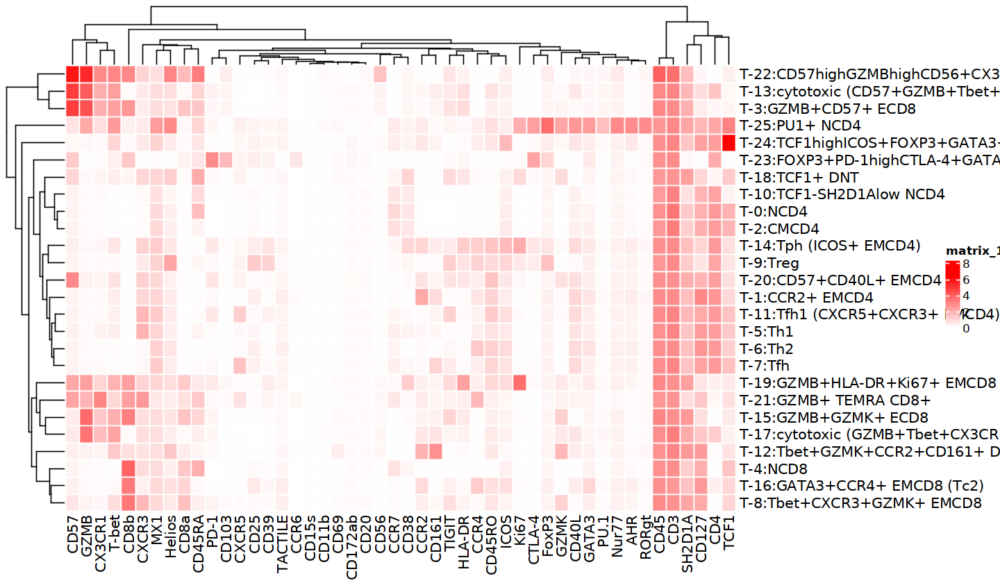

In [21]:

options(repr.plot.height = 7, repr.plot.width = 12)
plot(
    pheatmap(
      mat = t(exp_ave),
      border_color = "white",
      #breaks  = mat_breaks,
      #color  =inferno(length(mat_breaks) - 1),
      color= colorRampPalette(c("white", "red"))(length(mat_breaks)),
      show_rownames = TRUE,
      show_colnames = TRUE,
      cluster_rows = TRUE,
      cluster_cols = TRUE,
      # cutree_rows = 5,
      # cutree_cols = 3,
      #   annotation_col = annotation_col,
      #   annotation_colors = meta_colors,
      fontsize = 12,
      fontsize_row = 12,
      scale = "none"
    )
)


In [22]:
ph_markers_data_arcsinh = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/arcsinh_transformed_Prop",prop,"_Nmin",n_min,".rds"))
colnames(ph_markers_data_arcsinh) = gsub("\\.","-",colnames(ph_markers_data_arcsinh))
ph_markers_data_arcsinh = ph_markers_data_arcsinh[clu_logi,]
dim(ph_markers_data_arcsinh)
head(ph_markers_data_arcsinh)


[1] 2196401      48

CD45,CD172ab,CD8a,CD20,CD4,CD3,CD56,CCR6,CD45RA,MX1,...,GATA3,TIGIT,Ki67,T-bet,CCR7,CD57,HLA-DR,CD103,CD38,CD11b
2.521515,0.0596507986,2.483664090,1.457546e-01,0.146042741,2.181314,0.5166952131,-0.0030607581,0.075889196,0.98941251,...,0.362215059,0.787497893,-0.002755850,0.920291739,0.001731477,-1.782343e-03,-2.069561e-05,-0.0002447364,0.001014612,0.0273255993
1.774781,0.0261615956,-0.001437899,2.696114e-03,0.001524504,3.326065,0.0605022815,0.1747033484,-0.001727373,0.68194875,...,0.597180256,0.322916599,0.001298372,2.157777758,-0.002566625,3.030152e-04,-3.833635e-04,-0.0004225948,0.447789286,0.0036451161
2.652980,0.7714011350,-0.001568306,-1.531980e-03,2.745002378,3.913657,1.1059630409,0.0006712663,-0.001216444,0.18727816,...,0.402796117,-0.004202756,0.003069771,0.001770767,0.258700751,6.797119e-02,-3.158901e-03,-0.0012393256,0.555189936,-0.0022141164
2.831174,-0.0024141292,-0.001418078,2.434246e-04,2.986267397,3.881371,0.0006325577,0.0013489613,-0.001067691,1.66169369,...,-0.001035666,-0.002019529,0.004817010,0.774293742,0.002540573,4.094736e-02,-8.032398e-04,0.0018027321,-0.004109640,-0.0024217607
2.598646,0.0380435026,0.002368119,-1.267173e-05,2.615635256,2.665693,-0.0005314105,0.0002105111,0.002430186,1.29941381,...,1.150310209,-0.002766740,-0.001829089,1.488046680,0.183832590,3.598799e-05,6.406902e-02,-0.0025492793,0.001464441,0.4526469342
3.204120,0.0005548585,0.104701180,1.417023e-01,2.396689598,3.877174,-0.0008724180,-0.0008111419,1.324661817,0.08944463,...,0.608108532,-0.002106562,-0.003195798,0.643727087,1.380859805,-1.843324e-03,-1.856220e-03,0.0027147009,0.512195323,0.0003816952


In [23]:
markers = c('AHR','CCR2','CCR4','CCR6','CCR7','CD103','CD11b','CD127','CD15s','CD161','CD172ab','CD20','CD25','CD3','CD38','CD39','CD4','CD40L','CD45','CD45RA','CD45RO','CD56','CD57','CD69','CD8a','CD8b','CTLA-4','CX3CR1','CXCR3','CXCR5','FoxP3','GATA3','GZMB','GZMK','HLA-DR','Helios','ICOS','Ki67','MX1','Nur77','PD-1','PU-1','RORgt','SH2D1A','T-bet','TACTILE','TCF1','TIGIT')


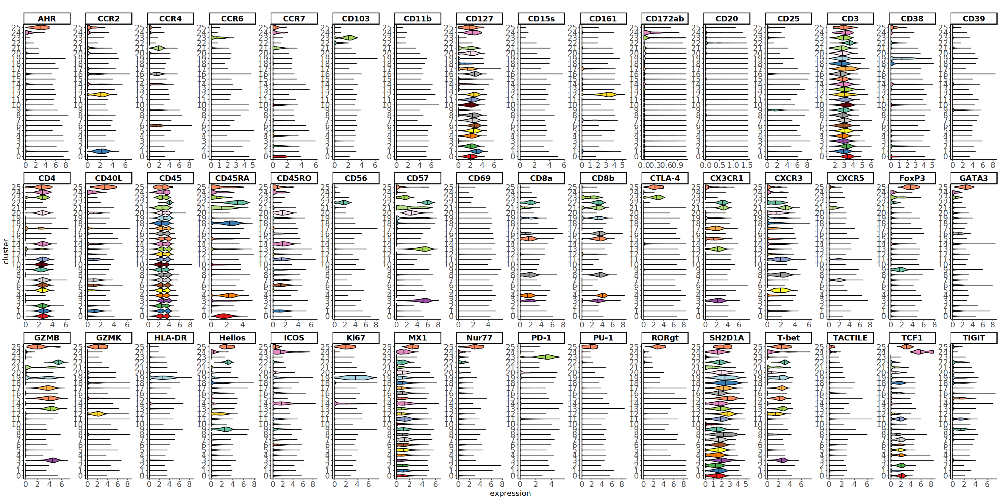

In [24]:
options(repr.plot.height = 14, repr.plot.width = 28)
suppressWarnings({
  as.data.frame(ph_markers_data_arcsinh[,markers]) %>%
    dplyr::mutate(cluster = umap_res$res_cell) %>%
    dplyr::mutate(cluster = factor(cluster,levels=unique(umap_res$res_cell)[order(as.numeric(unique(umap_res$res_cell)))])) %>%
    tidyr::pivot_longer(!cluster) %>%
    magrittr::set_colnames(c("cluster","protein","expression")) %>%
    dplyr::mutate(protein = gsub("\\.","-",protein)) %>% 
    ggplot(.,aes(x=cluster, y=expression, fill = cluster)) + 
    geom_violin(color = "black", aes(fill = cluster), scale = "width", draw_quantiles = c(0.5)) +
    facet_wrap(protein ~ ., scales = "free" , nrow = 3) +
    theme_classic() +
    coord_flip() +
    scale_fill_manual(values = c(
    "0" = "#E41A1C",
    "1" = "#377EB8",
    "2" = "#4DAF4A",
    "3" = "#984EA3",
    "4" = "#FF7F00",
    "5" = "#FFFF33",
    "6" = "#A65628",
    "7" = "lightgrey",
    "8" = "#999999",
    "9" = "#66C2A5",
    "10" = "#67000D",
    "11" = "#8DA0CB",
    "12" = "#FFD92F",
    "13" = "#A6D854",
    "14" = "#E78AC3",
    "15" = "#FC8D62",
    "16" = "darkgrey",
    "17" = "#FEB24C",
    "18" = "#377EB8",
    "19" = "lightblue",
    "20" = "#FDE0EF",
    "21" = "#B8E186",
    "22" = "#66C2A5",
    "23" = "#A6D855",
    "24" = "#E78AC4",
    "25" = "#FC8D63",
    "26" = "brown",
    "27" = "#FEB25C",
    "28" = "#377EB9",
    "29" = "lightgreen",
    "30" = "#FDE1EF"
  )) +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "",
         x = "cluster",
         y = "expression") 
})

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


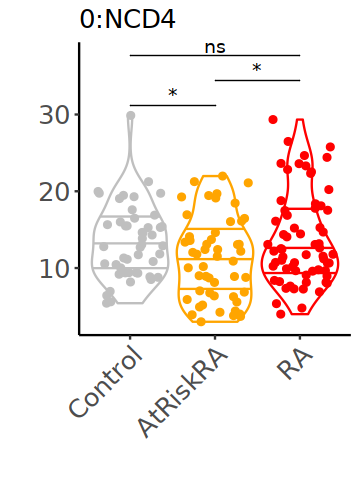

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


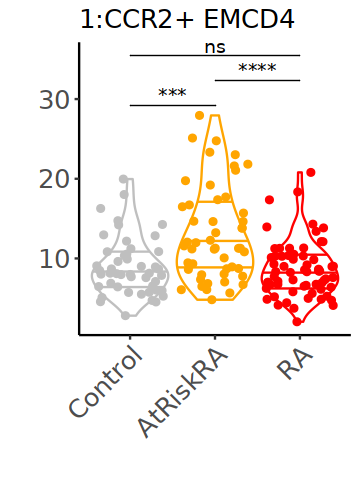

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


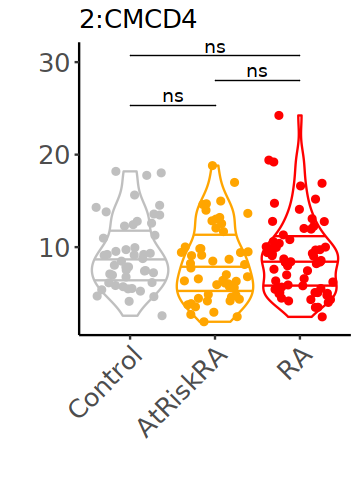

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


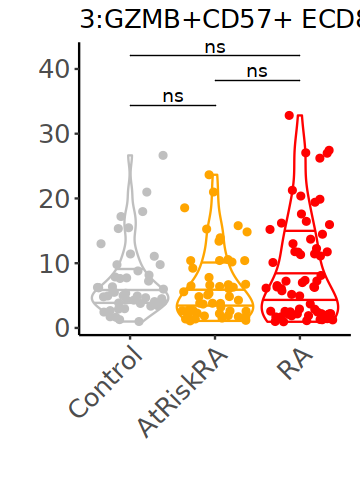

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


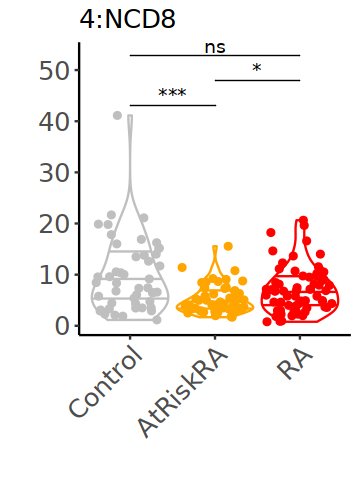

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


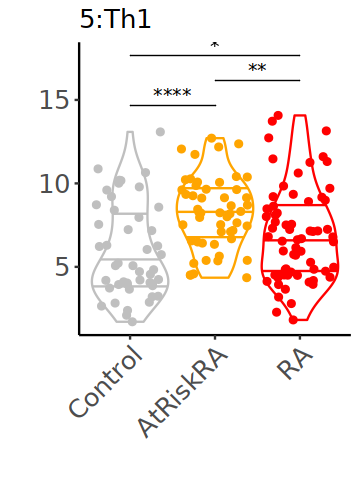

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


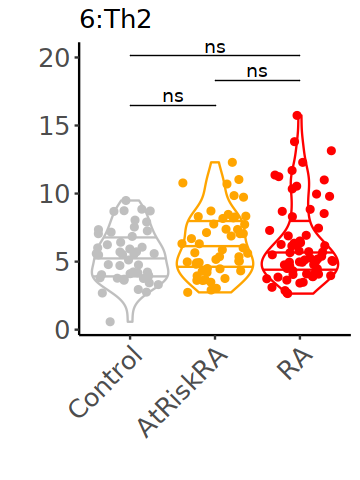

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


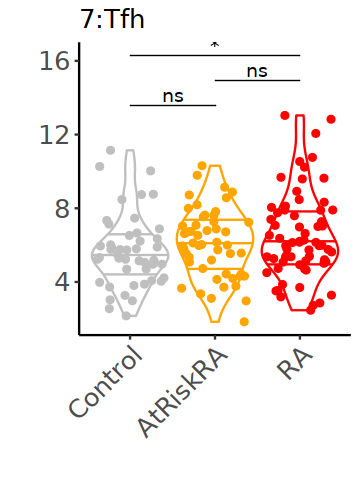

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


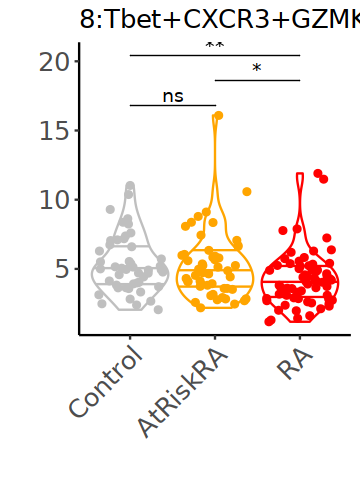

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


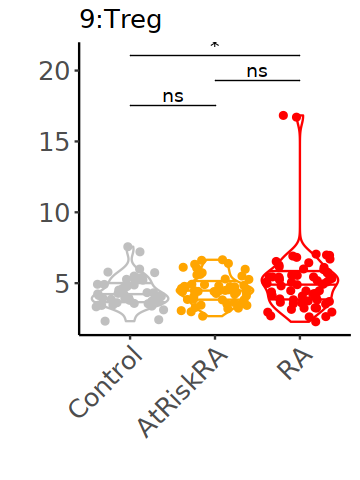

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


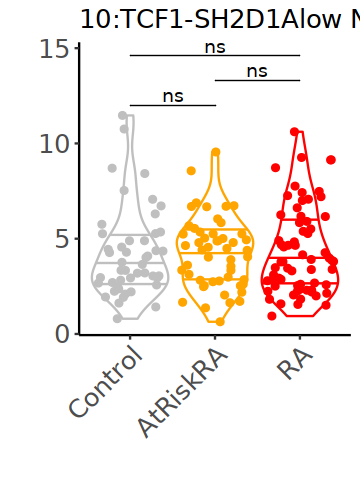

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


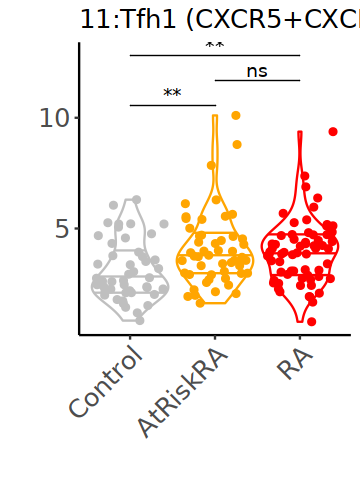

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


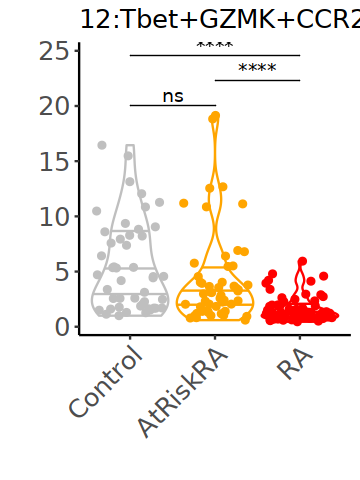

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


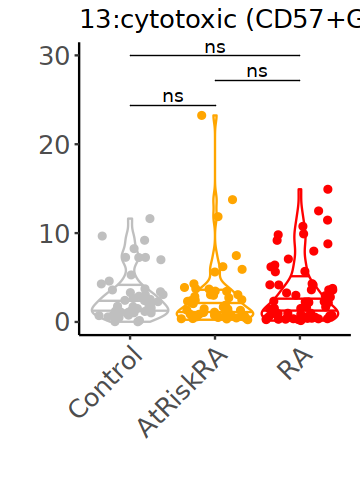

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


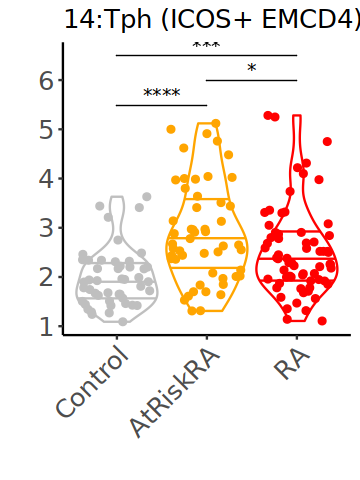

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


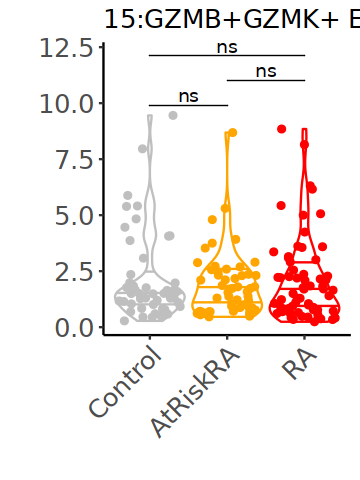

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


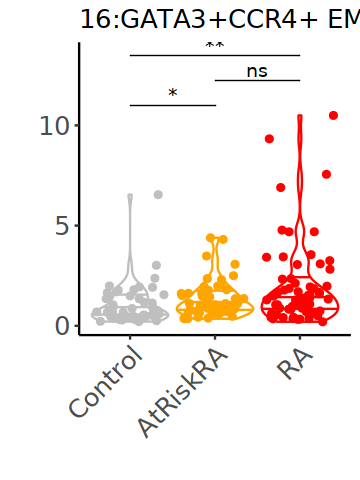

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


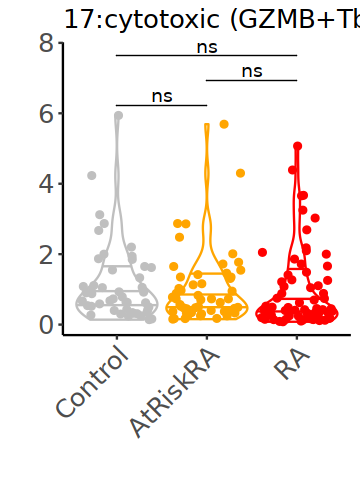

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


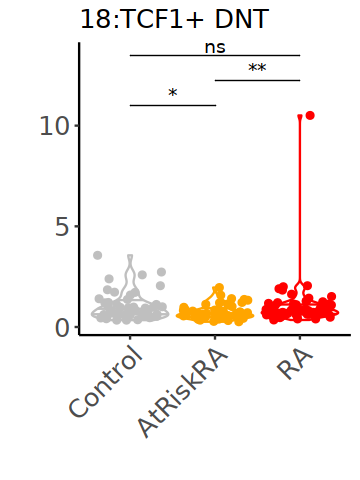

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


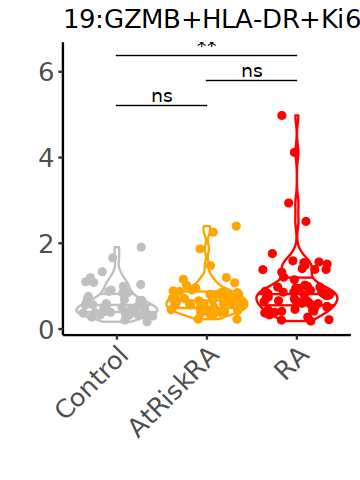

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


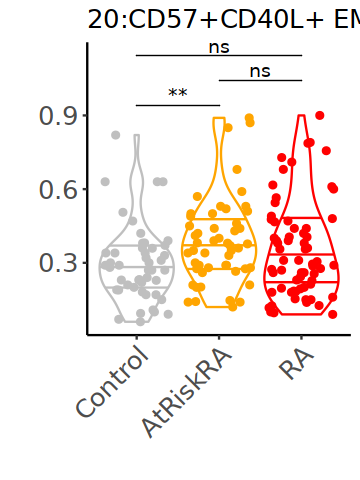

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


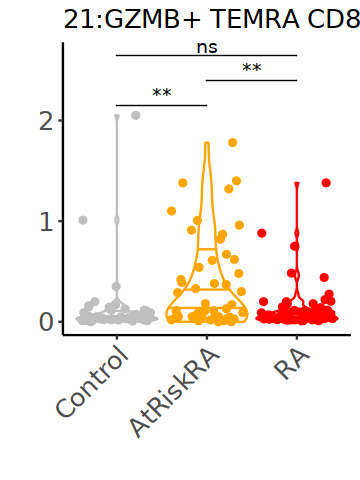

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


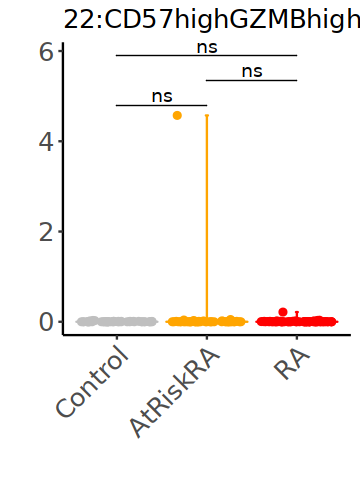

`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'disease'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'disease'. You can override
using the `.groups` argument.


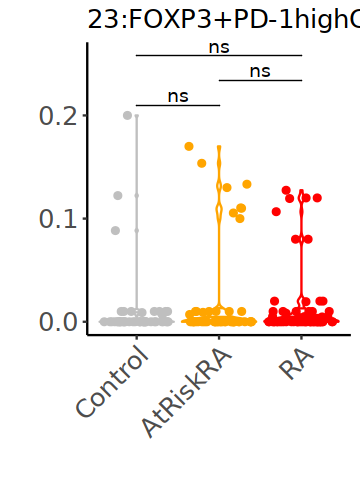

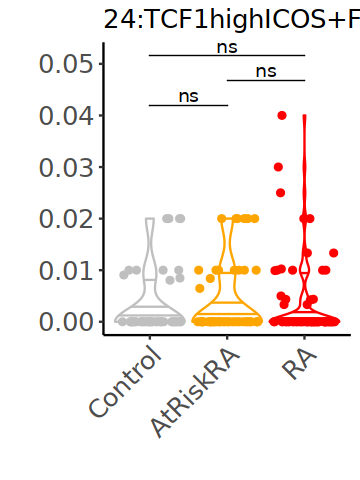

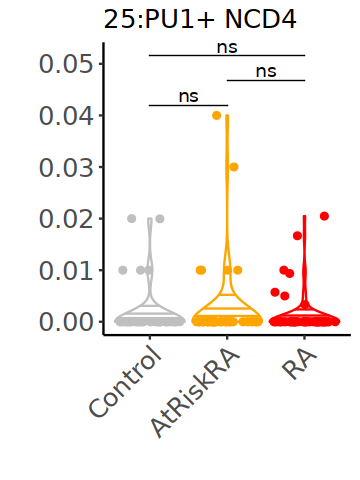

In [25]:


options(repr.plot.height = 4, repr.plot.width = 3)

for (clu in unique(umap_res$res_cell)[order(as.integer(unique(umap_res$res_cell)))]){
    
    # For each subject, make rows that says 0 if the cells belonging to each cluster are 0
    tmp = data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, disease = umap_res$disease) %>%
          dplyr::group_by(subject_id,disease,cluster) %>%
          dplyr::summarize(count = dplyr::n()) %>%
          dplyr::ungroup() %>%
          dplyr::group_by(subject_id) %>%
          dplyr::mutate(proportion = 100*count/sum(count)) %>%
          dplyr::filter(cluster==clu) %>%
        dplyr::group_by(disease,cluster) %>%
        dplyr::summarize(count = dplyr::n()) %>%
        dplyr::ungroup()
    for (dis in c("Control","AtRiskRA","RA")){
        if(!(dis %in% tmp$disease)){
            tmp = tmp %>%
                dplyr::add_row(disease = dis, cluster = clu, count = 0)
        }
    }
    tmp = cbind(
        tmp,
        all_count = umap_res %>%
            dplyr::distinct(disease,subject_id) %>%
            dplyr::group_by(disease) %>%
            dplyr::summarize(all_count = dplyr::n()) %>%
            .$all_count
        ) %>%
        dplyr::mutate(diff = all_count-count)
    tmp = rbind(
        data.frame(subject_id = rep("Control",tmp[tmp$disease == "Control",]$diff), 
                   cluster = rep(clu,tmp[tmp$disease == "Control",]$diff), 
                   count = rep(0,tmp[tmp$disease == "Control",]$diff), 
                   proportion = rep(0,tmp[tmp$disease == "Control",]$diff), 
                   disease = rep("Control",tmp[tmp$disease == "Control",]$diff)
                   ),
        data.frame(subject_id = rep("AtRiskRA",tmp[tmp$disease == "AtRiskRA",]$diff), 
                   cluster = rep(clu,tmp[tmp$disease == "AtRiskRA",]$diff), 
                   count = rep(0,tmp[tmp$disease == "AtRiskRA",]$diff), 
                   proportion = rep(0,tmp[tmp$disease == "AtRiskRA",]$diff), 
                   disease = rep("AtRiskRA",tmp[tmp$disease == "AtRiskRA",]$diff)
                   ),
        data.frame(subject_id = rep("RA",tmp[tmp$disease == "RA",]$diff), 
                   cluster = rep(clu,tmp[tmp$disease == "RA",]$diff), 
                   count = rep(0,tmp[tmp$disease == "RA",]$diff), 
                   proportion = rep(0,tmp[tmp$disease == "RA",]$diff), 
                   disease = rep("RA",tmp[tmp$disease == "RA",]$diff)
                   )
        )
    
    plot(
       data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, disease = umap_res$disease) %>%
          dplyr::group_by(subject_id,disease,cluster) %>%
          dplyr::summarize(count = dplyr::n()) %>%
          dplyr::ungroup() %>%
          dplyr::group_by(subject_id) %>%
          dplyr::mutate(proportion = 100*count/sum(count)) %>%
          dplyr::filter(cluster==clu) %>%
          rbind(.,tmp) %>%
          dplyr::mutate(disease = factor(disease,levels = c("Control", "AtRiskRA", "RA"))) %>%
          ggplot(., aes(x = disease, y=proportion, fill = cluster)) + 
          geom_violin(aes(color = disease), fill = "white", scale = "width", draw_quantiles = c(0.25, 0.5, 0.75)) +
          geom_jitter(aes(fill = disease, color = disease)) +
          ggpubr::stat_compare_means(
            comparisons = list(c("Control", "AtRiskRA"), c("AtRiskRA", "RA"),  c("Control", "RA")), 
            label = "p.signif",
            tip.length = 0
            ) +
          scale_fill_manual(values = c("Control" = "grey75","AtRiskRA" = "orange","RA" = "red")) +
          scale_color_manual(values = c("Control" = "grey75","AtRiskRA" = "orange","RA" = "red")) +
          theme_classic() +
          theme(strip.text.x=element_text(size=15, color="black", face="bold"),
                strip.text.y=element_text(size=15, color="black", face="bold"),
                legend.position = "none",
                plot.title = element_text(size=15),
                axis.title.x = element_text(size=15),
                axis.title.y = element_text(size =15),
                axis.text.y = element_text(size = 15),
                axis.text.x = element_text(size = 15, angle = 45, hjust=1),
                legend.text =  element_text(size = 15),
                legend.key.size = grid::unit(0.5, "lines"),
                legend.title = element_text(size = 0.8, hjust = 0)) +
          labs(title = paste(clu,unique(cluster_df[cluster_df$cluster==clu,]$clu_name),sep=":"),
               x = "",
               y = "") 

            )
}




`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
Warning message in wilcox.test.default(c(13.04, 5.60103752938316, 15.2695967376529, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(13.04, 5.60103752938316, 15.2695967376529, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(13.04, 5.60103752938316, 15.2695967376529, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summ

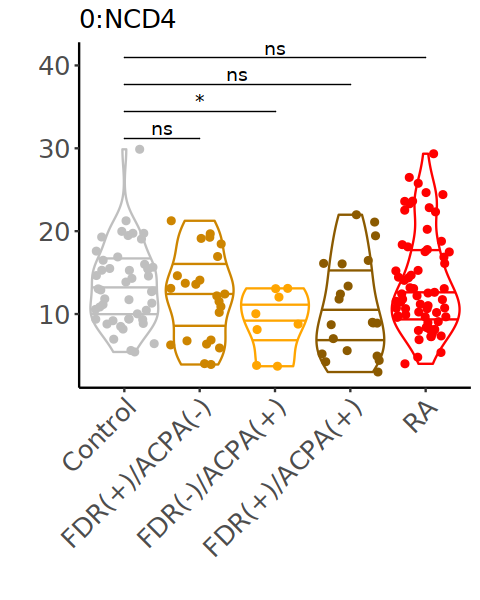

Warning message in wilcox.test.default(c(9.73, 2.58571775958499, 11.2822836429542, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(9.73, 2.58571775958499, 11.2822836429542, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(9.73, 2.58571775958499, 11.2822836429542, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


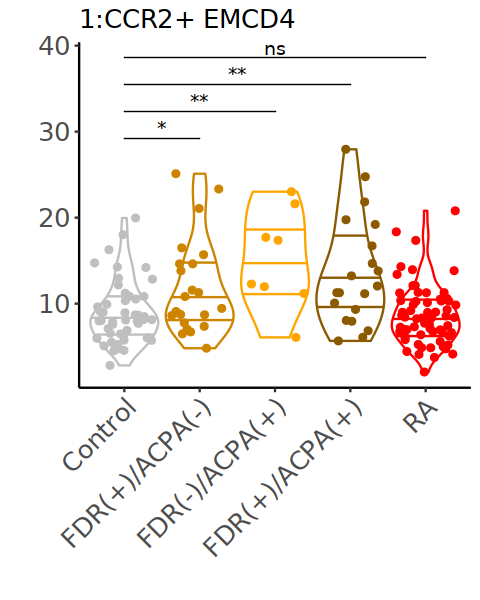

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


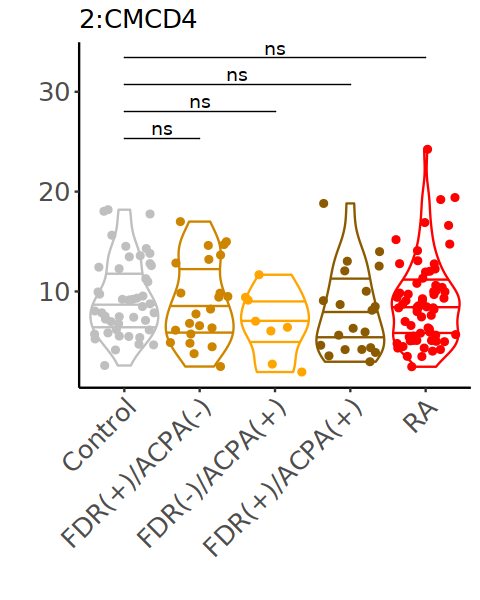

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


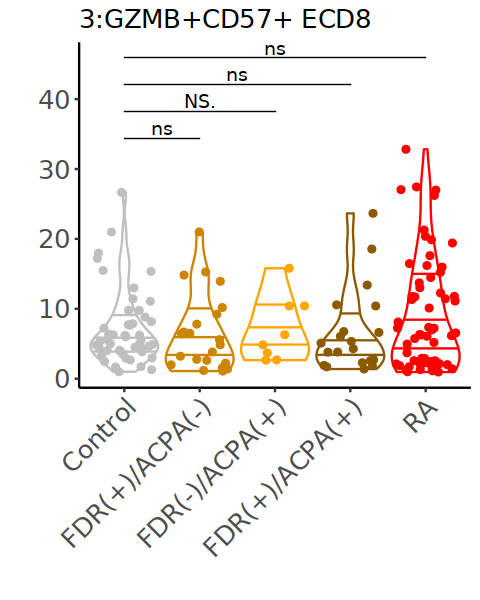

Warning message in wilcox.test.default(c(2.83, 8.57582880765178, 4.05980969642048, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


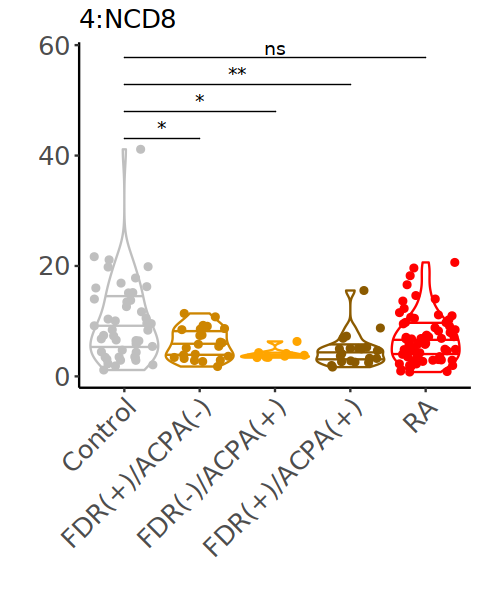

Warning message in wilcox.test.default(c(5.59, 4.23117451568453, 3.99637516991391, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.59, 4.23117451568453, 3.99637516991391, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(5.59, 4.23117451568453, 3.99637516991391, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


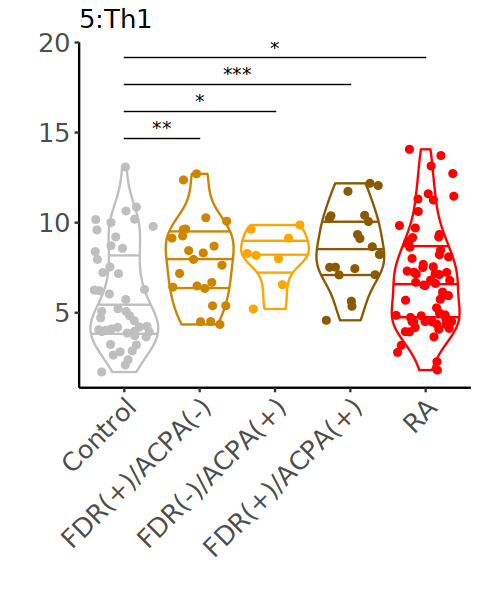

Warning message in wilcox.test.default(c(5.29, 5.22817540731134, 4.22292705029452, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


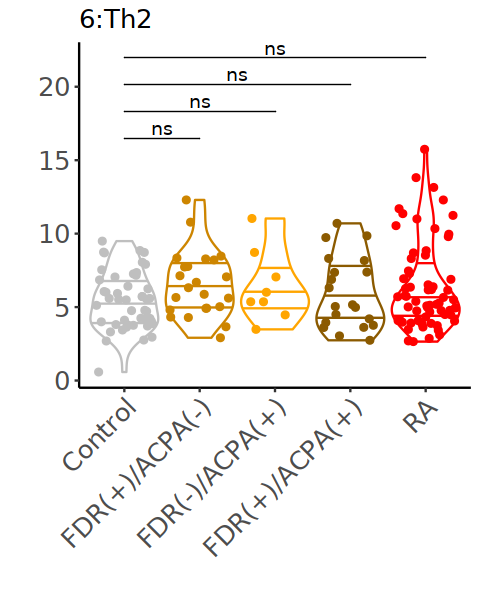

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


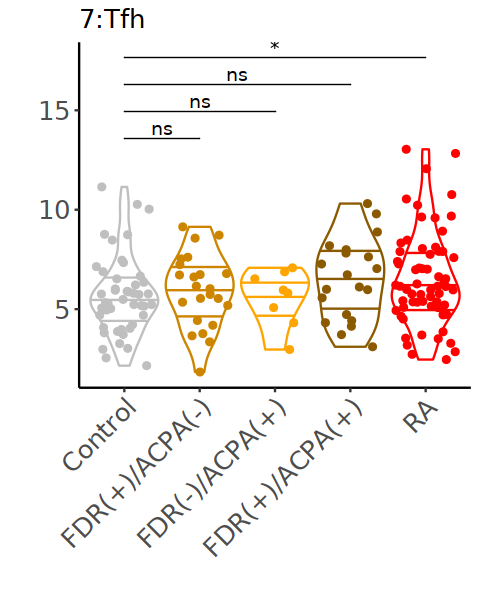

Warning message in wilcox.test.default(c(3.43, 2.31822971548999, 5.50067965564114, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(3.43, 2.31822971548999, 5.50067965564114, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(3.43, 2.31822971548999, 5.50067965564114, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


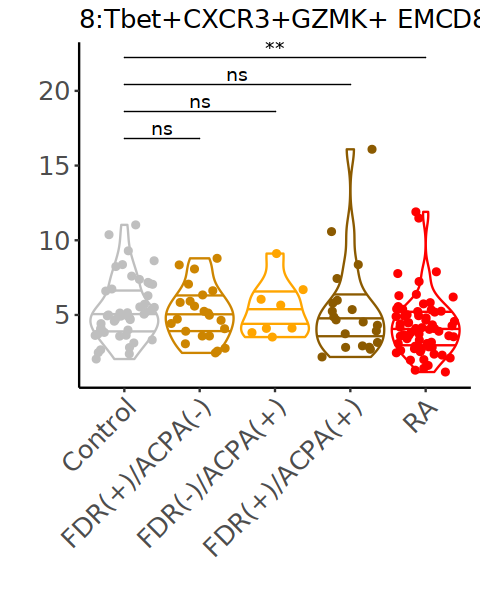

Warning message in wilcox.test.default(c(2.21, 1.62113966118181, 3.04485727231536, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


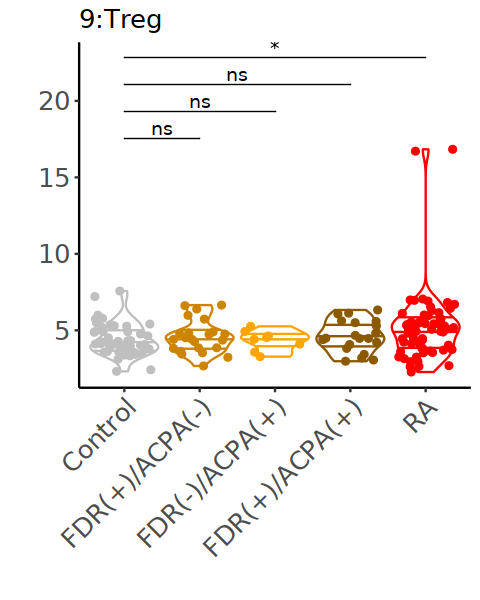

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


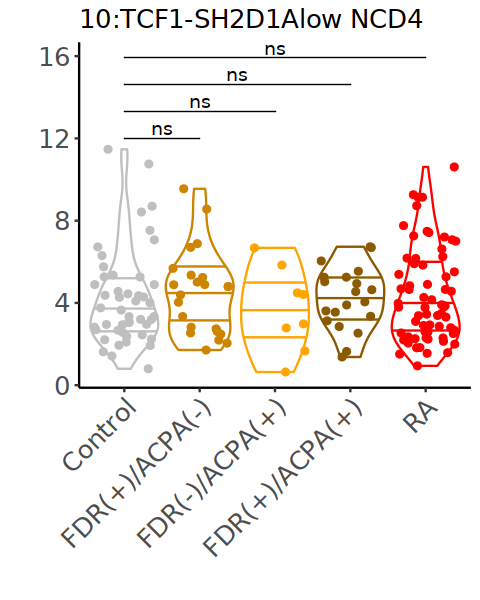

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


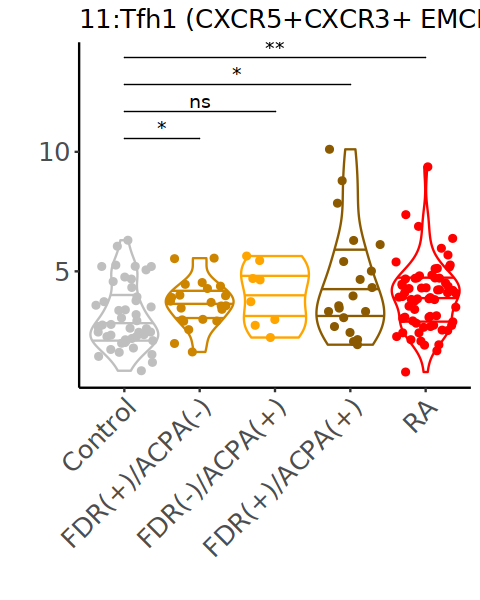

`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


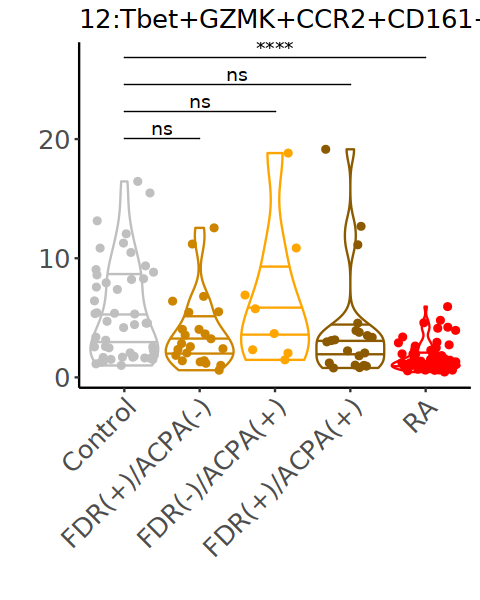

Warning message in wilcox.test.default(c(1.68, 1.42660290183999, 1.939284096058, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.68, 1.42660290183999, 1.939284096058, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.68, 1.42660290183999, 1.939284096058, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


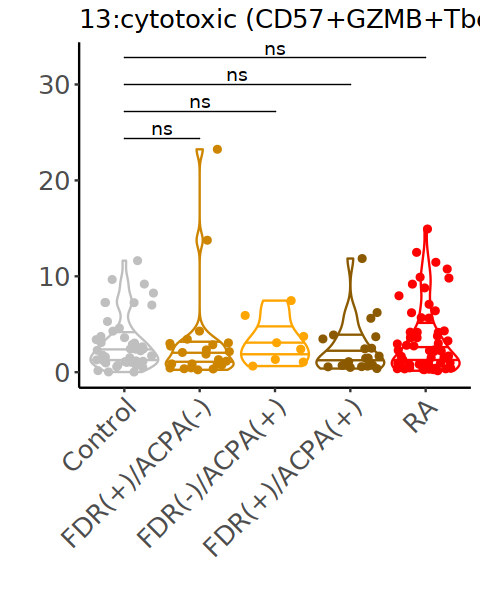

Warning message in wilcox.test.default(c(1.2, 3.86641809191862, 0.44404168554599, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.2, 3.86641809191862, 0.44404168554599, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.2, 3.86641809191862, 0.44404168554599, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


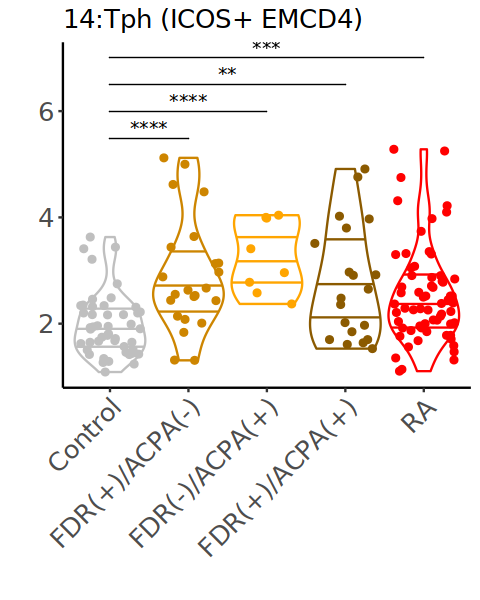

Warning message in wilcox.test.default(c(0.6, 0.948366701791359, 0.208427729950159, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.6, 0.948366701791359, 0.208427729950159, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.6, 0.948366701791359, 0.208427729950159, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


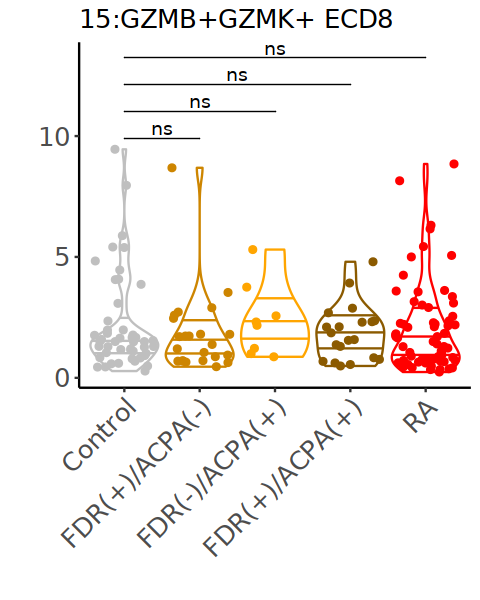

Warning message in wilcox.test.default(c(1.94, 3.12069384777499, 0.788400543724513, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1.94, 3.12069384777499, 0.788400543724513, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


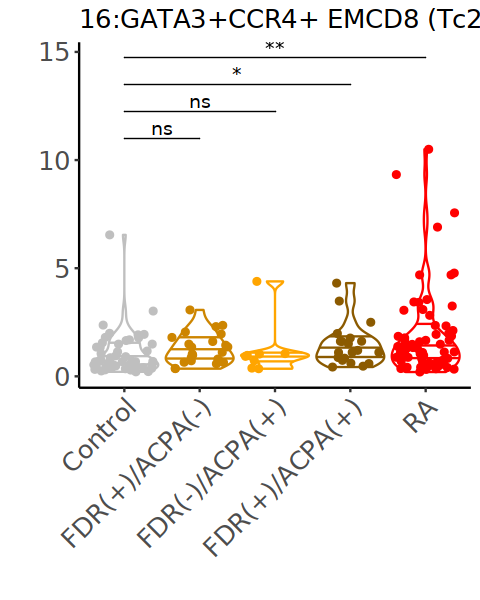

Warning message in wilcox.test.default(c(0.49, 0.526870389884089, 0.942455822383326, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.49, 0.526870389884089, 0.942455822383326, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.49, 0.526870389884089, 0.942455822383326, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


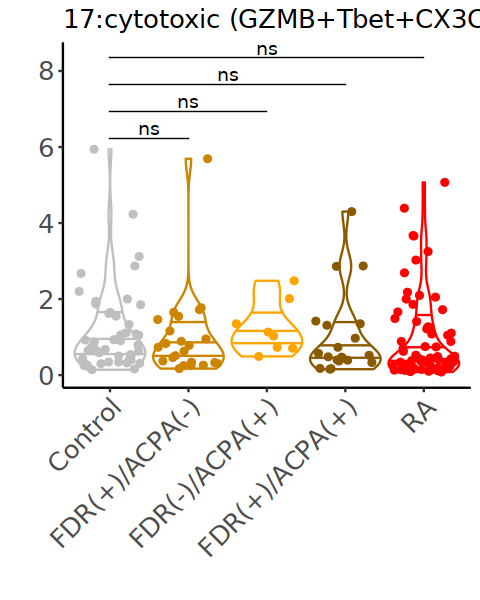

Warning message in wilcox.test.default(c(0.43, 0.567398881413634, 0.398731309469869, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.43, 0.567398881413634, 0.398731309469869, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.43, 0.567398881413634, 0.398731309469869, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


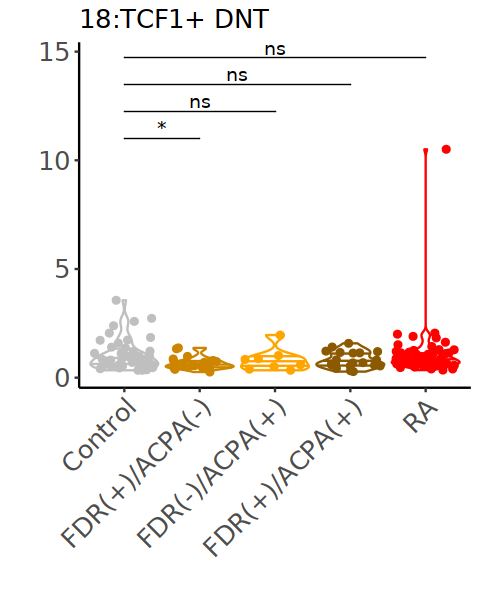

Warning message in wilcox.test.default(c(0.19, 0.380967820377726, 0.181241504304486, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.19, 0.380967820377726, 0.181241504304486, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.19, 0.380967820377726, 0.181241504304486, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


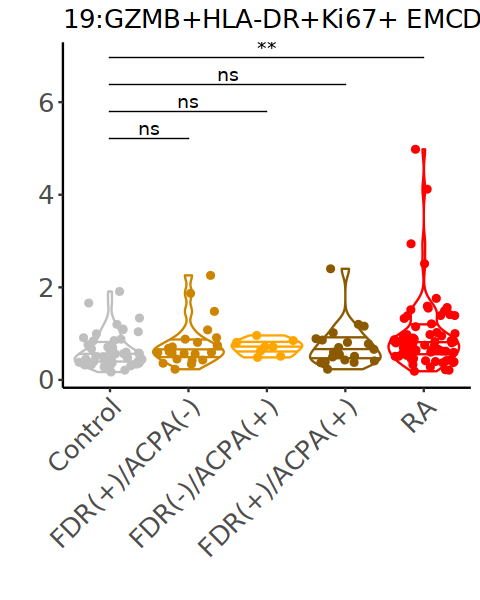

Warning message in wilcox.test.default(c(0.04, 0.0729512847531815, 0.144993203443589, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.04, 0.0729512847531815, 0.144993203443589, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.04, 0.0729512847531815, 0.144993203443589, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


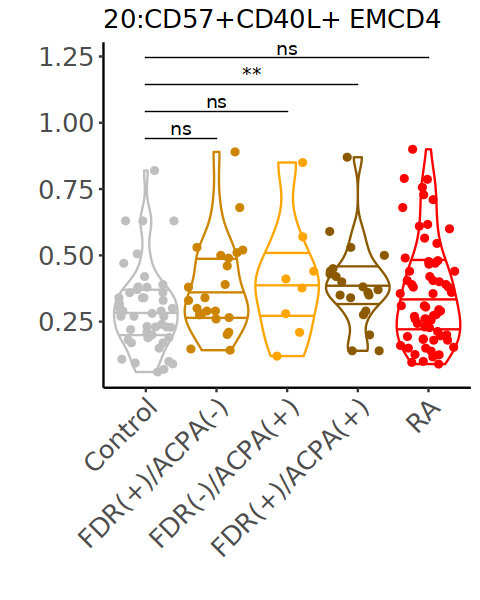

Warning message in wilcox.test.default(c(0.01, 0.00846596681341009, 0.01000100010001, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.01, 0.00846596681341009, 0.01000100010001, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.01, 0.00846596681341009, 0.01000100010001, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


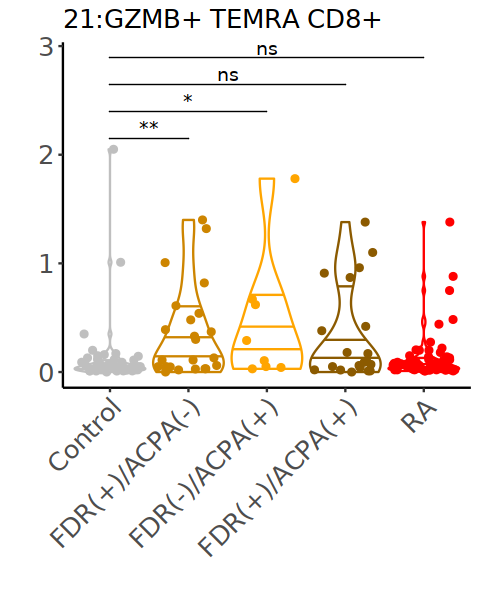

Warning message in wilcox.test.default(c(0.01, 0.2, 0.01000100010001, 0.122299225438239, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.01, 0.2, 0.01000100010001, 0.122299225438239, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.01, 0.2, 0.01000100010001, 0.122299225438239, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


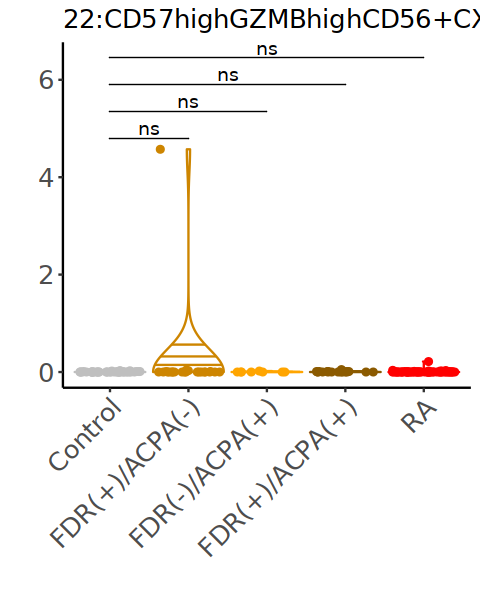

Warning message in wilcox.test.default(c(0.00906207521522429, 0.00846596681341009, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.00906207521522429, 0.00846596681341009, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.00906207521522429, 0.00846596681341009, :
“cannot compute exact p-value with ties”
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'AtRisk'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'subject_id', 'AtRisk'. You can override
using the `.groups` argument.


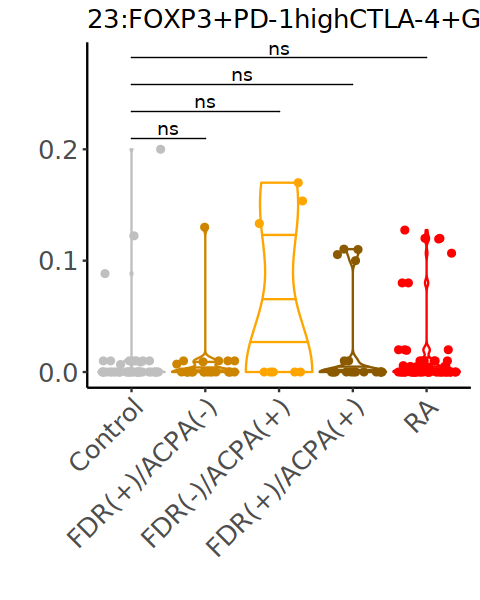

Warning message in wilcox.test.default(c(0.01000200040008, 0.0199541055572184, 0.02, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.01000200040008, 0.0199541055572184, 0.02, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.01000200040008, 0.0199541055572184, 0.02, :
“cannot compute exact p-value with ties”


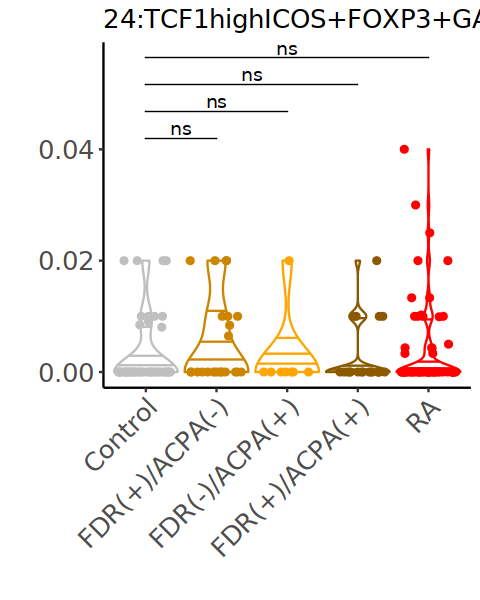

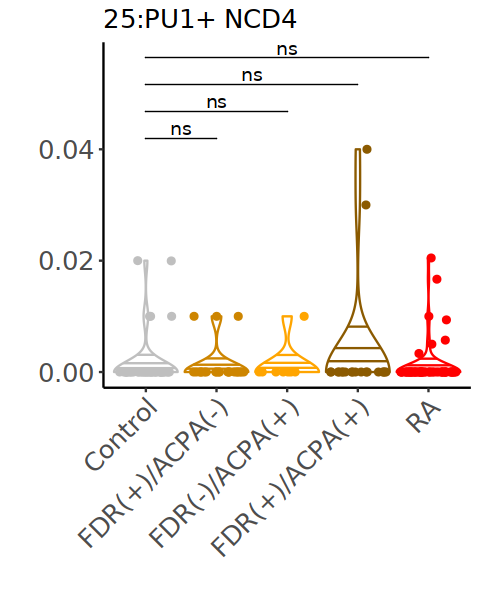

In [27]:
options(repr.plot.height = 5, repr.plot.width = 4)

for (clu in unique(umap_res$res_cell)[order(as.integer(unique(umap_res$res_cell)))]){
    
    # For each subject, make rows that says 0 if the cells belonging to each cluster are 0
  tmp = data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, AtRisk = umap_res$AtRisk) %>%
    dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
    dplyr::group_by(subject_id,AtRisk,cluster) %>%
    dplyr::summarize(count = dplyr::n()) %>%
    dplyr::ungroup() %>%
    dplyr::group_by(subject_id) %>%
    dplyr::mutate(proportion = 100*count/sum(count)) %>%
    dplyr::filter(cluster==clu) %>%
    dplyr::group_by(AtRisk,cluster) %>%
    dplyr::summarize(count = dplyr::n()) %>%
    dplyr::ungroup() %>%
    dplyr::arrange(AtRisk)
  for (dis in c("Control","FDR(+)/ACPA(-)","FDR(-)/ACPA(+)","FDR(+)/ACPA(+)","RA")){
    if(!(dis %in% tmp$AtRisk)){
      tmp = tmp %>%
        dplyr::add_row(AtRisk = dis, cluster = clu, count = 0)
    }
  }
  tmp = cbind(
    tmp,
    all_count = umap_res %>%
      dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
      dplyr::distinct(AtRisk,subject_id) %>%
      dplyr::group_by(AtRisk) %>%
      dplyr::summarize(all_count = dplyr::n()) %>%
      .$all_count
  ) %>%
    dplyr::mutate(diff = all_count-count)
  
  tmp = rbind(
    data.frame(subject_id = rep("Control",tmp[tmp$AtRisk == "Control",]$diff), 
               cluster = rep(clu,tmp[tmp$AtRisk == "Control",]$diff), 
               count = rep(0,tmp[tmp$AtRisk == "Control",]$diff), 
               proportion = rep(0,tmp[tmp$AtRisk == "Control",]$diff), 
               AtRisk = rep("Control",tmp[tmp$AtRisk == "Control",]$diff)
    ),
    data.frame(subject_id = rep("FDR(+)/ACPA(-)",tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff), 
               cluster = rep(clu,tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff), 
               count = rep(0,tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff), 
               proportion = rep(0,tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff), 
               AtRisk = rep("FDR(+)/ACPA(-)",tmp[tmp$AtRisk == "FDR(+)/ACPA(-)",]$diff)
    ),
    data.frame(subject_id = rep("FDR(-)/ACPA(+)",tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff), 
               cluster = rep(clu,tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff), 
               count = rep(0,tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff), 
               proportion = rep(0,tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff), 
               AtRisk = rep("FDR(-)/ACPA(+)",tmp[tmp$AtRisk == "FDR(-)/ACPA(+)",]$diff)
    ),
    data.frame(subject_id = rep("FDR(+)/ACPA(+)",tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff), 
               cluster = rep(clu,tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff), 
               count = rep(0,tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff), 
               proportion = rep(0,tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff), 
               AtRisk = rep("FDR(+)/ACPA(+)",tmp[tmp$AtRisk == "FDR(+)/ACPA(+)",]$diff)
    ),
    data.frame(subject_id = rep("RA",ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0)), 
               cluster = rep(clu,ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0)), 
               count = rep(0,ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0)), 
               proportion = rep(0,ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0)),  
               AtRisk = rep("RA",ifelse(tmp[tmp$AtRisk == "RA",]$diff>0,tmp[tmp$AtRisk == "RA",]$diff,0))
    )
  )
  
  plot(
    data.frame(subject_id = umap_res$subject_id, cluster = umap_res$res_cell, AtRisk = umap_res$AtRisk) %>%
      dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
      dplyr::group_by(subject_id,AtRisk,cluster) %>%
      dplyr::summarize(count = dplyr::n()) %>%
      dplyr::ungroup() %>%
      dplyr::group_by(subject_id) %>%
      dplyr::mutate(proportion = 100*count/sum(count)) %>%
      dplyr::filter(cluster==clu) %>%
      rbind(.,tmp) %>%
      dplyr::mutate(AtRisk = factor(AtRisk,levels=c("Control","FDR(+)/ACPA(-)","FDR(-)/ACPA(+)","FDR(+)/ACPA(+)","RA"))) %>%
      ggplot(., aes(x = AtRisk, y=proportion, fill = cluster)) + 
      geom_violin(aes(color = AtRisk), fill = "white", scale = "width", draw_quantiles = c(0.25, 0.5, 0.75)) +
      geom_jitter(aes(fill = AtRisk, color = AtRisk)) +
      ggpubr::stat_compare_means(
        comparisons = list(c("Control", "FDR(+)/ACPA(-)"), c("Control", "FDR(-)/ACPA(+)"), c("Control", "FDR(+)/ACPA(+)"), c("Control", "RA")), 
        label = "p.signif",
        tip.length = 0
      ) +
      scale_fill_manual(values=c("Control" = "grey75","FDR(-)/ACPA(+)" = "orange","FDR(+)/ACPA(-)" = "orange3","FDR(+)/ACPA(+)" = "orange4","RA" = "red")) +
      scale_color_manual(values=c("Control" = "grey75","FDR(-)/ACPA(+)" = "orange","FDR(+)/ACPA(-)" = "orange3","FDR(+)/ACPA(+)" = "orange4","RA" = "red")) + 
      theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
            strip.text.y=element_text(size=15, color="black", face="bold"),
            legend.position = "none",
            plot.title = element_text(size=15),
            axis.title.x = element_text(size=15),
            axis.title.y = element_text(size =15),
            axis.text.y = element_text(size = 15),
            axis.text.x = element_text(size = 15, angle = 45, hjust=1),
            legend.text =  element_text(size = 15),
            legend.key.size = grid::unit(0.5, "lines"),
            legend.title = element_text(size = 0.8, hjust = 0)) +
      labs(title = paste(clu,unique(cluster_df[cluster_df$cluster==clu,]$clu_name),sep=":"),,
           x = "",
           y = "") 
    
  )
}



[1] "AHR"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00425
2 AtRiskRA  0.00654
3 RA        0.0426 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


[1] "CCR2"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00331
2 AtRiskRA  0.00473
3 RA        0.00302


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


[1] "CCR4"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00253
2 AtRiskRA  0.00455
3 RA        0.00379


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


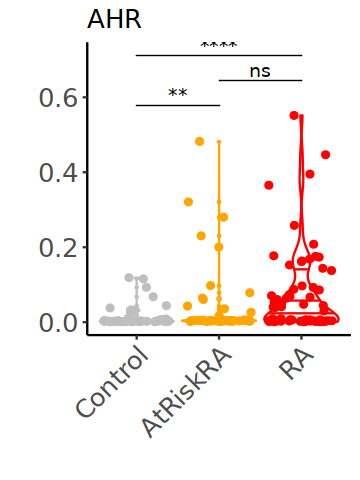

[1] "CCR6"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000383
2 AtRiskRA  0.000637
3 RA        0.000476


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


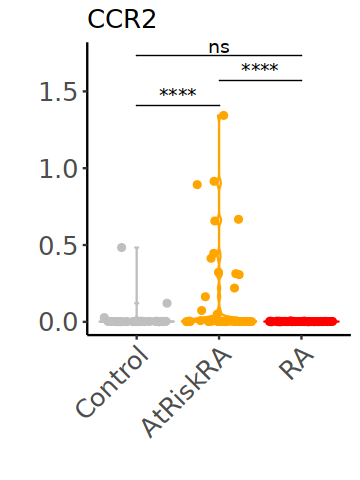

[1] "CCR7"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.100  
2 AtRiskRA  0.00716
3 RA        0.0413 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


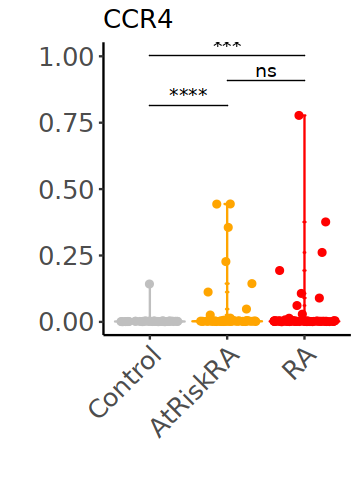

[1] "CD103"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.00101 
2 AtRiskRA  0.000980
3 RA        0.000991


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


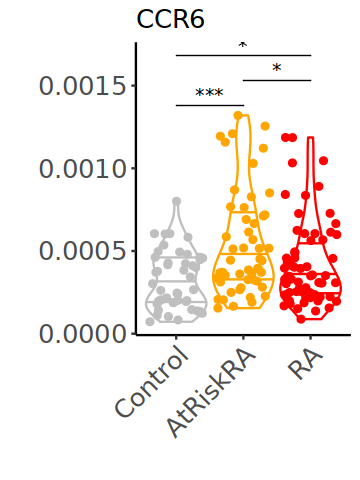

[1] "CD11b"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000741
2 AtRiskRA  0.000788
3 RA        0.000822


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


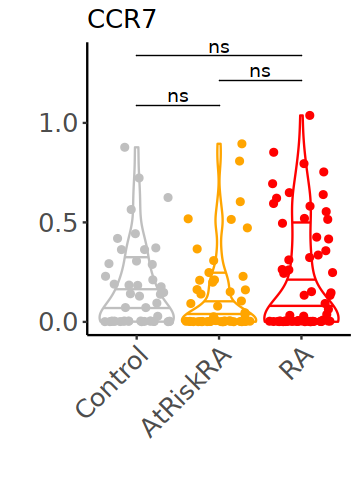

[1] "CD127"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.40
2 AtRiskRA   1.44
3 RA         1.39


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


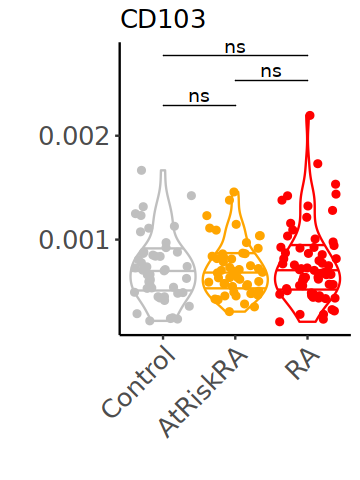

[1] "CD15s"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000626
2 AtRiskRA  0.000591
3 RA        0.000555


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


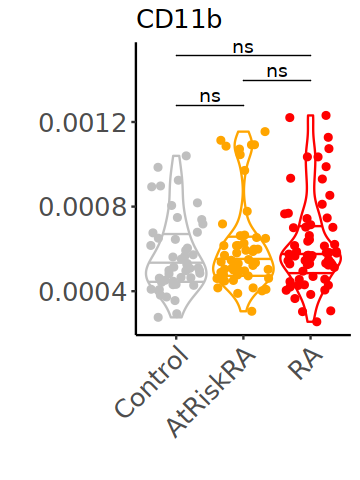

[1] "CD161"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00215
2 AtRiskRA  0.00248
3 RA        0.00186


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


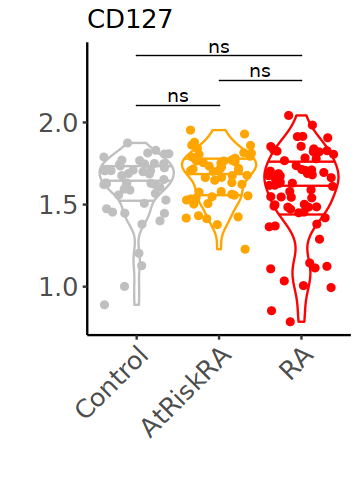

[1] "CD172ab"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00253
2 AtRiskRA  0.00329
3 RA        0.00167


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


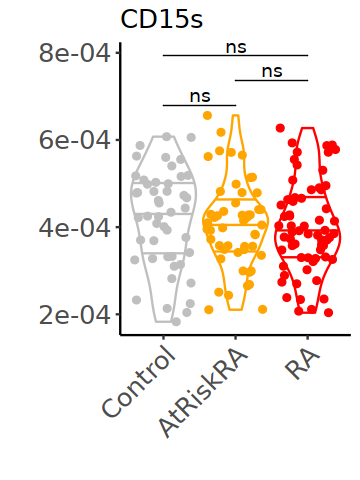

[1] "CD20"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00225
2 AtRiskRA  0.00238
3 RA        0.00230


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


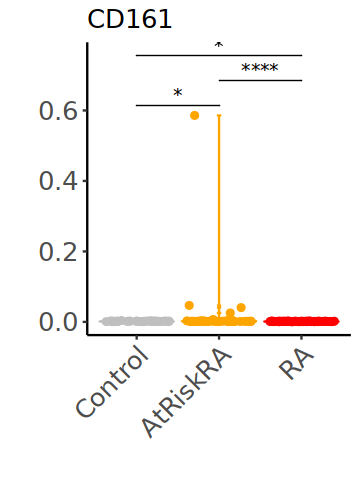

[1] "CD25"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00224
2 AtRiskRA  0.00291
3 RA        0.00349


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


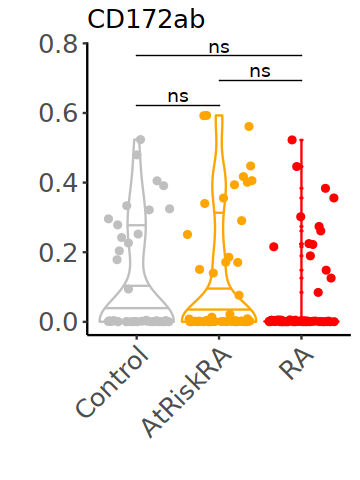

[1] "CD3"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.59
2 AtRiskRA   1.59
3 RA         1.59


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


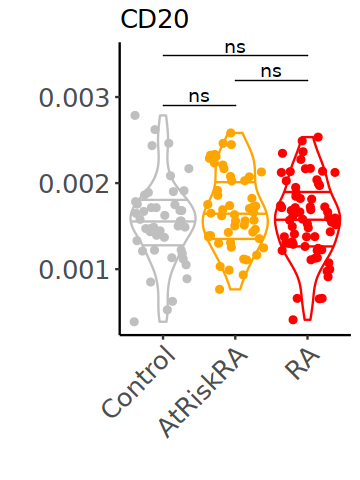

[1] "CD38"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00487
2 AtRiskRA  0.00408
3 RA        0.00466


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


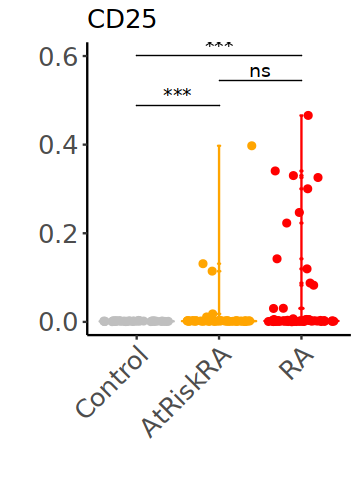

[1] "CD39"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00132
2 AtRiskRA  0.00174
3 RA        0.00168


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


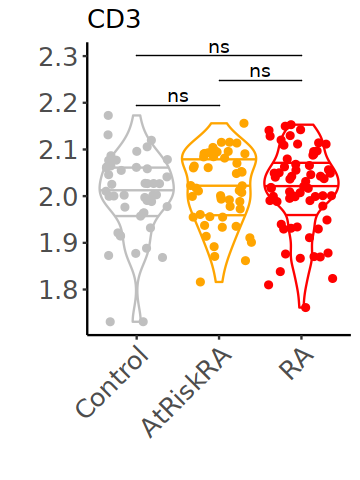

[1] "CD4"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.39
2 AtRiskRA   1.43
3 RA         1.43


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


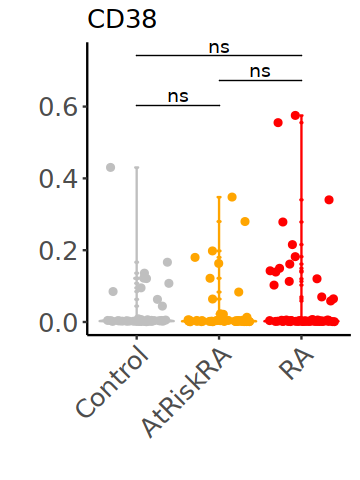

[1] "CD40L"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.286
2 AtRiskRA  0.435
3 RA        0.413


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


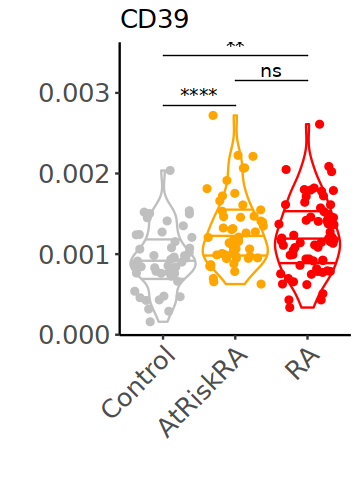

[1] "CD45"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.48
2 AtRiskRA   1.49
3 RA         1.51


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


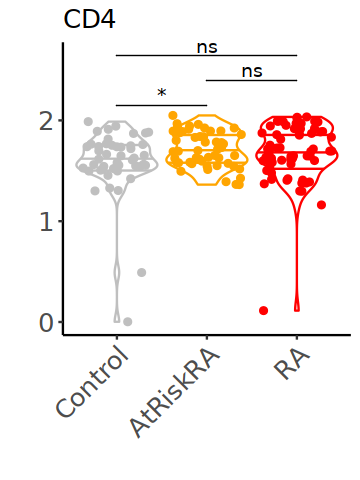

[1] "CD45RA"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.262  
2 AtRiskRA  0.00748
3 RA        0.199  


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


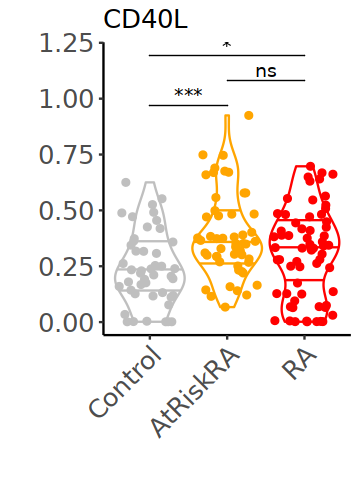

[1] "CD45RO"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00566
2 AtRiskRA  0.288  
3 RA        0.0100 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


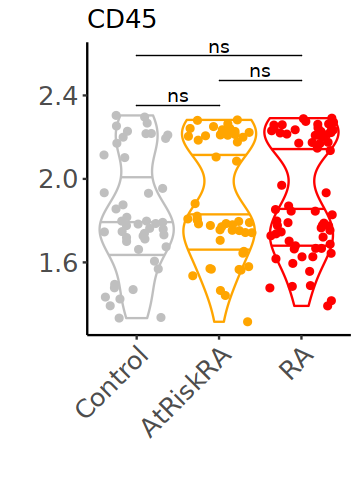

[1] "CD56"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00194
2 AtRiskRA  0.00229
3 RA        0.00194


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


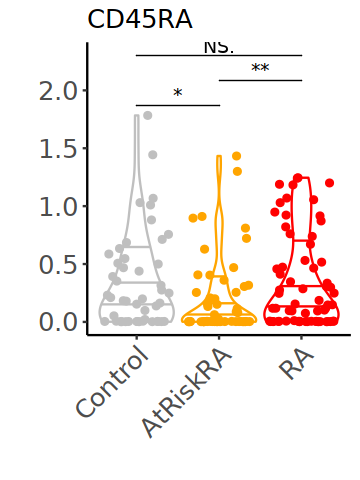

[1] "CD57"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.120  
2 AtRiskRA  0.00621
3 RA        0.107  


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


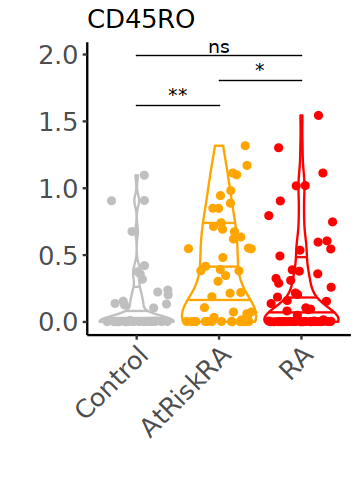

[1] "CD69"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00112
2 AtRiskRA  0.00106
3 RA        0.00113


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


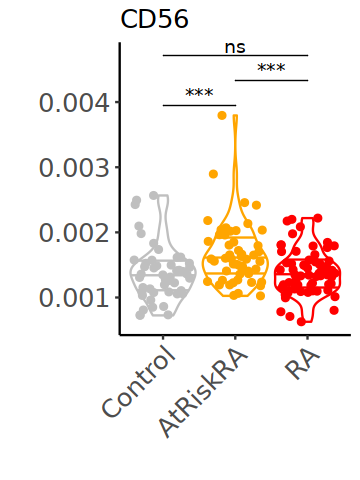

[1] "CD8a"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00480
2 AtRiskRA  0.00443
3 RA        0.00411


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


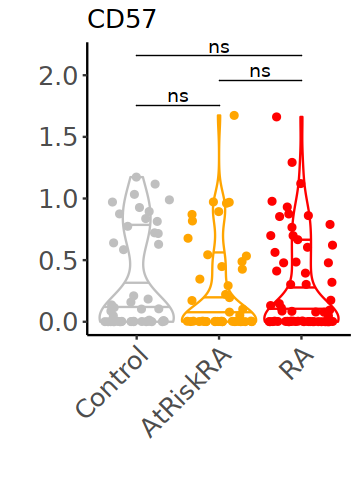

[1] "CD8b"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00316
2 AtRiskRA  0.00247
3 RA        0.00243


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


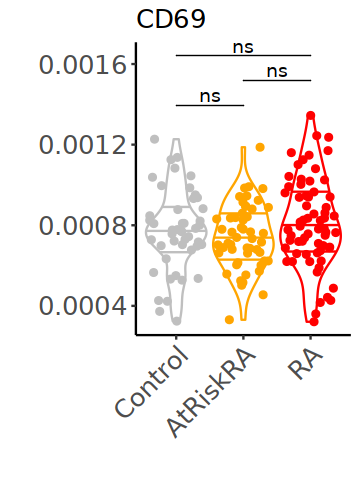

[1] "CTLA-4"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition      med
  <fct>        <dbl>
1 Control   0.000906
2 AtRiskRA  0.00121 
3 RA        0.00121 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


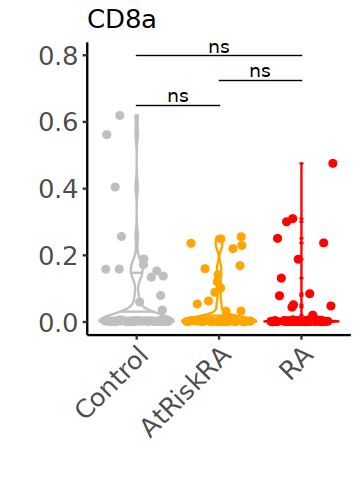

[1] "CX3CR1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00343
2 AtRiskRA  0.00557
3 RA        0.00392


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


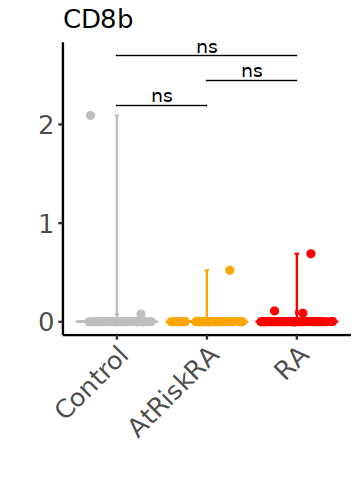

[1] "CXCR3"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.318
2 AtRiskRA  0.512
3 RA        0.292


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


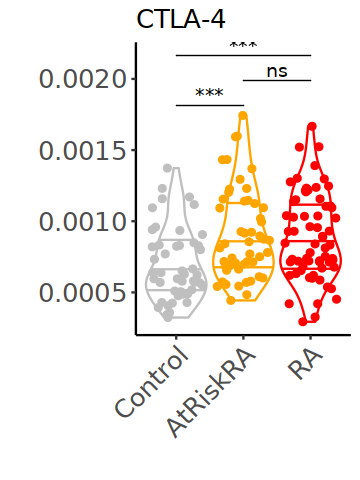

[1] "CXCR5"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00159
2 AtRiskRA  0.00230
3 RA        0.00219


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


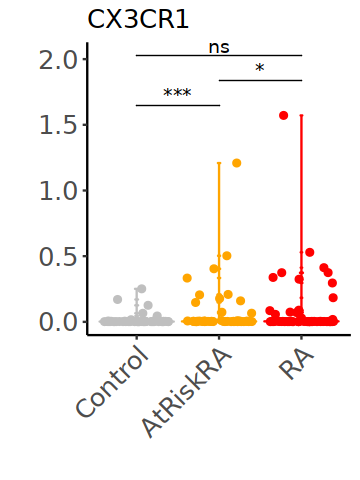

[1] "FoxP3"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.106
2 AtRiskRA  0.206
3 RA        0.265


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


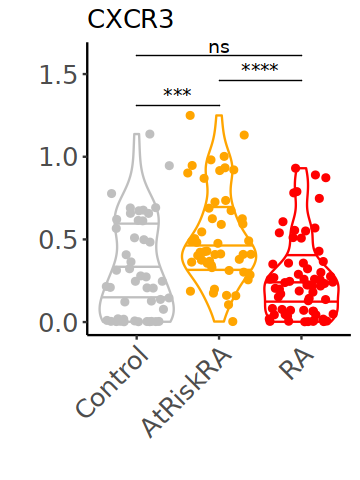

[1] "GATA3"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.228
2 AtRiskRA  0.362
3 RA        0.319


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


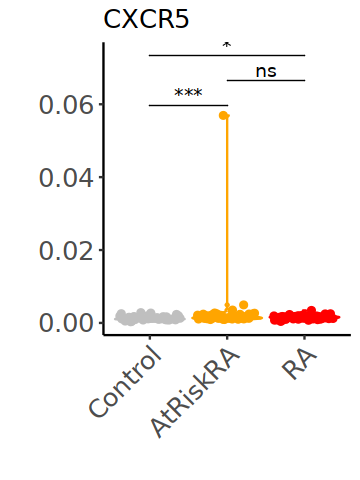

[1] "GZMB"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00333
2 AtRiskRA  0.00450
3 RA        0.00519


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


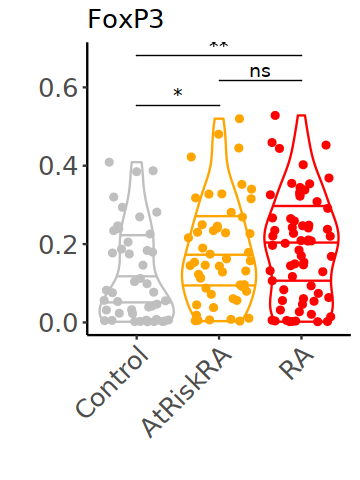

[1] "GZMK"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00178
2 AtRiskRA  0.00189
3 RA        0.00118


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


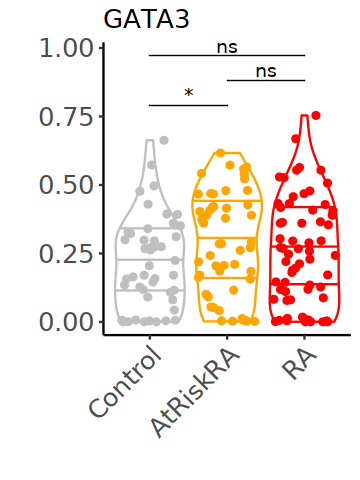

[1] "HLA-DR"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00297
2 AtRiskRA  0.00293
3 RA        0.00345


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


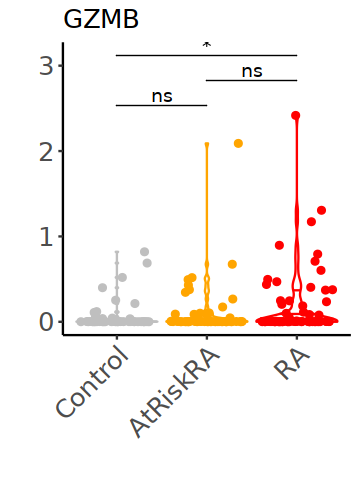

[1] "Helios"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.479
2 AtRiskRA  0.503
3 RA        0.533


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


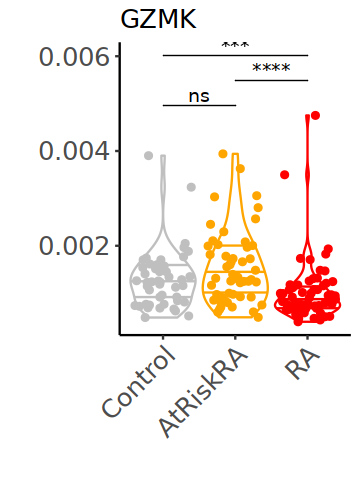

[1] "ICOS"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.444
2 AtRiskRA  0.452
3 RA        0.519


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


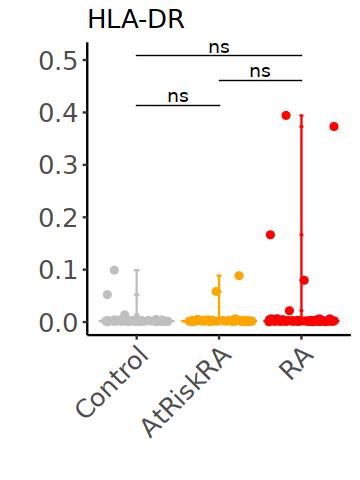

[1] "Ki67"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00123
2 AtRiskRA  0.00151
3 RA        0.00145


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


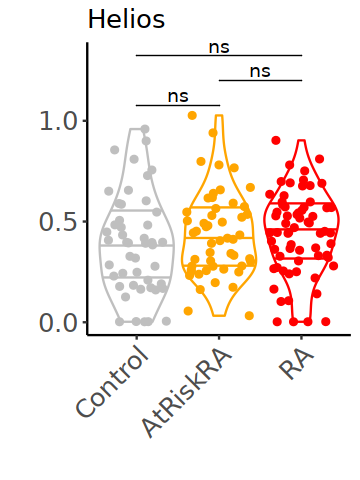

[1] "MX1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control   0.842
2 AtRiskRA  0.955
3 RA        1.01 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


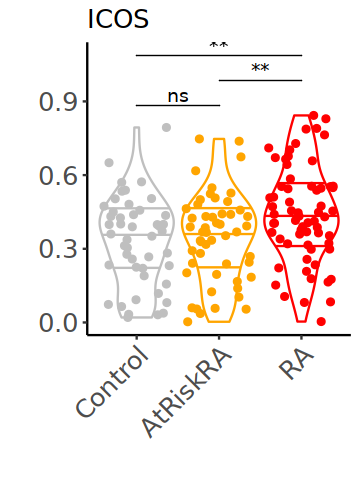

[1] "Nur77"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition    med
  <fct>      <dbl>
1 Control   0.0964
2 AtRiskRA  0.162 
3 RA        0.217 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


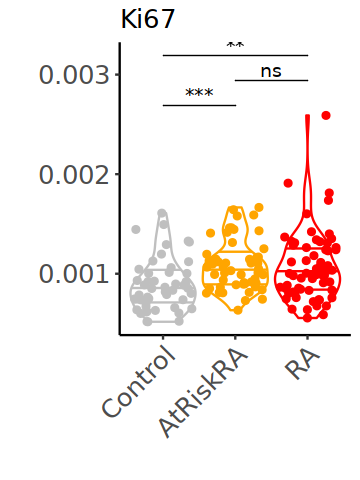

[1] "PD-1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00107
2 AtRiskRA  0.00158
3 RA        0.00132


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


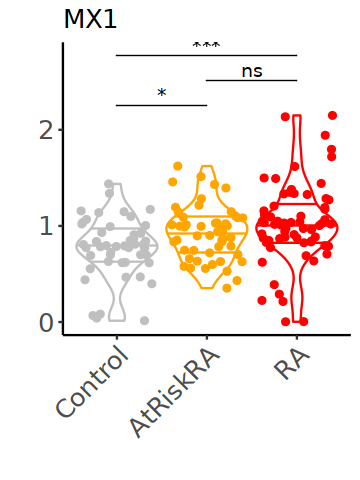

[1] "PU.1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00167
2 AtRiskRA  0.00220
3 RA        0.00241


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


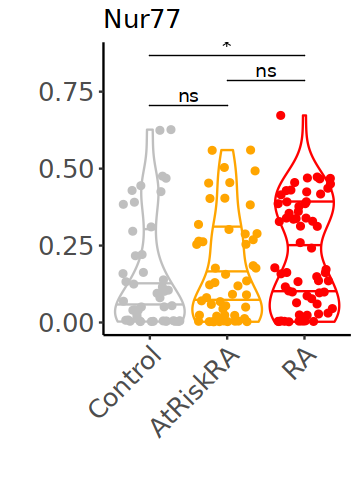

[1] "RORgt"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00272
2 AtRiskRA  0.00366
3 RA        0.00349


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


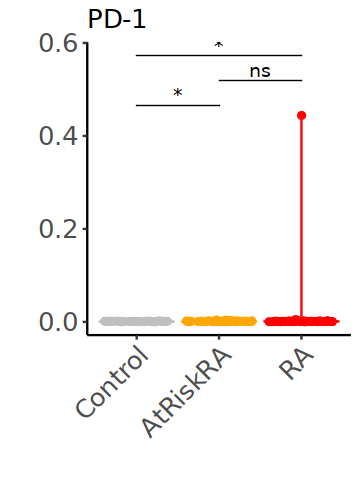

[1] "SH2D1A"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.27
2 AtRiskRA   1.25
3 RA         1.26


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


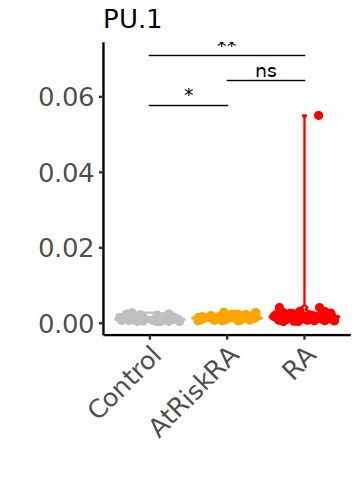

[1] "T-bet"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00547
2 AtRiskRA  0.0632 
3 RA        0.00488


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


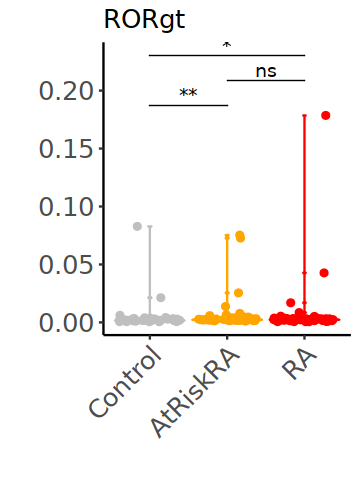

[1] "TACTILE"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00572
2 AtRiskRA  0.0107 
3 RA        0.00759


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


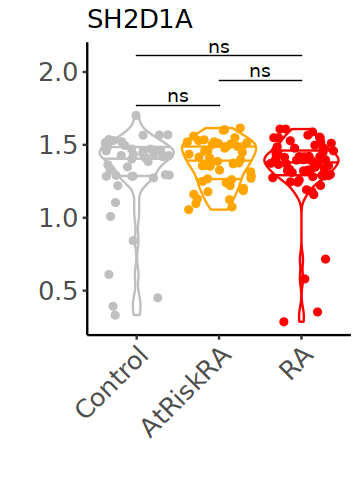

[1] "TCF1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition   med
  <fct>     <dbl>
1 Control    1.12
2 AtRiskRA   1.10
3 RA         1.17


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


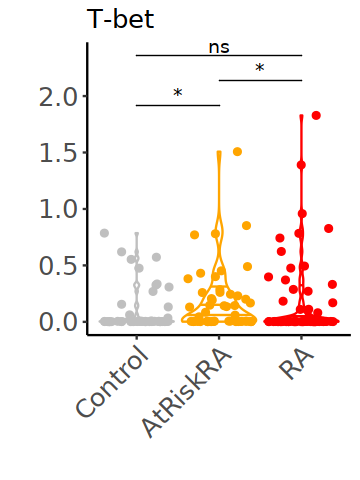

[1] "TIGIT"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 3 × 2
  condition     med
  <fct>       <dbl>
1 Control   0.00235
2 AtRiskRA  0.00307
3 RA        0.00292


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


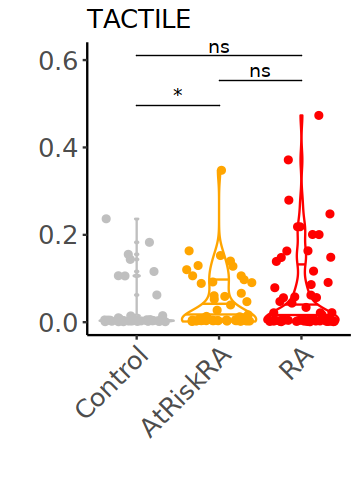

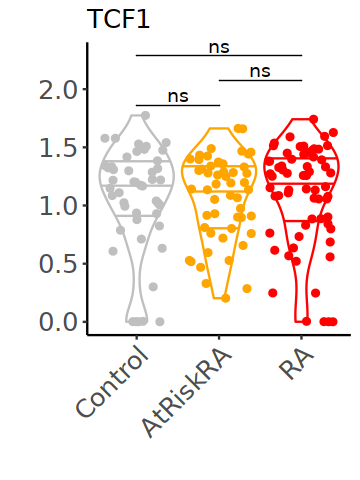

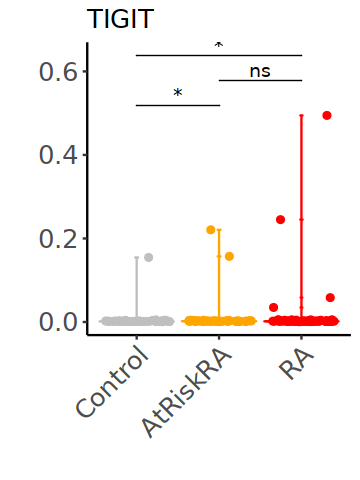

In [28]:
markers = c('AHR','CCR2','CCR4','CCR6','CCR7','CD103','CD11b','CD127','CD15s','CD161','CD172ab','CD20','CD25','CD3','CD38','CD39','CD4','CD40L','CD45','CD45RA','CD45RO','CD56','CD57','CD69','CD8a','CD8b','CTLA-4','CX3CR1','CXCR3','CXCR5','FoxP3','GATA3','GZMB','GZMK','HLA-DR','Helios','ICOS','Ki67','MX1','Nur77','PD-1','PU.1','RORgt','SH2D1A','T-bet','TACTILE','TCF1','TIGIT')
options(repr.plot.height = 4, repr.plot.width = 3)
for (gene in markers){
    print(gene)
    
    data.frame(ph_markers_data_arcsinh, subject_id = umap_res$subject_id, condition = umap_res$disease) %>% 
        dplyr::mutate(expr = ph_markers_data_arcsinh[,grepl(paste0("^",gene,"$"),colnames(ph_markers_data_arcsinh))]) %>%
        dplyr::group_by(subject_id, condition) %>%
        dplyr::summarize(med = quantile(log2(expr+1), probs = c(0.5))) %>%
        dplyr::ungroup() %>%
        dplyr::group_by(condition) %>%
        dplyr::summarize(med = quantile(log2(med+1), probs = c(0.5))) %>% print()
    plot(
        data.frame(ph_markers_data_arcsinh, subject_id = umap_res$subject_id, condition = umap_res$disease) %>% 
            dplyr::mutate(expr = ph_markers_data_arcsinh[,grepl(paste0("^",gene,"$"),colnames(ph_markers_data_arcsinh))]) %>%
            dplyr::group_by(subject_id, condition) %>%
            dplyr::summarize(med = quantile(log2(expr+1), probs = c(0.5))) %>%
            ggplot(., aes(x = condition, y=med, fill = condition, color = condition)) + 
                      geom_violin(aes(color = condition), fill = "white", scale = "width", draw_quantiles = c(0.25, 0.5, 0.75)) +
                      geom_jitter(aes(fill = condition, color = condition)) +
                      ggpubr::stat_compare_means(
                        comparisons = list(c("Control", "AtRiskRA"), c("AtRiskRA", "RA"),  c("Control", "RA")), 
                        label = "p.signif",
                        tip.length = 0
                        ) +
                      scale_fill_manual(values = c("Control" = "grey75","AtRiskRA" = "orange","RA" = "red")) +
                      scale_color_manual(values = c("Control" = "grey75","AtRiskRA" = "orange","RA" = "red")) +
                      theme_classic() +
                      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
                            strip.text.y=element_text(size=15, color="black", face="bold"),
                            legend.position = "none",
                            plot.title = element_text(size=15),
                            axis.title.x = element_text(size=15),
                            axis.title.y = element_text(size =15),
                            axis.text.y = element_text(size = 15),
                            axis.text.x = element_text(size = 15, angle = 45, hjust=1),
                            legend.text =  element_text(size = 15),
                            legend.key.size = grid::unit(0.5, "lines"),
                            legend.title = element_text(size = 0.8, hjust = 0)) +
                      labs(title = gene,
                           x = "",
                           y = "") 
         )

}


[1] "AHR"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00425
2 FDR(+)/ACPA(+) 0.00678
3 FDR(+)/ACPA(-) 0.00569
4 FDR(-)/ACPA(+) 0.00808
5 RA             0.0426 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


[1] "CCR2"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00331
2 FDR(+)/ACPA(+) 0.00494
3 FDR(+)/ACPA(-) 0.00401
4 FDR(-)/ACPA(+) 0.0113 
5 RA             0.00302


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


[1] "CCR4"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00253
2 FDR(+)/ACPA(+) 0.00555
3 FDR(+)/ACPA(-) 0.00407
4 FDR(-)/ACPA(+) 0.00531
5 RA             0.00379


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


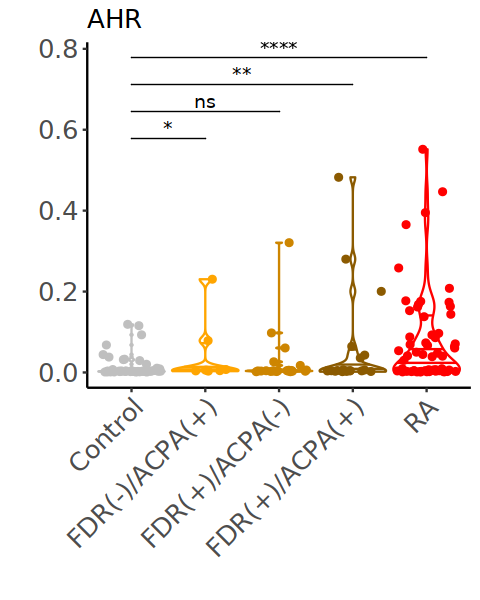

[1] "CCR6"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000383
2 FDR(+)/ACPA(+) 0.000546
3 FDR(+)/ACPA(-) 0.000563
4 FDR(-)/ACPA(+) 0.000866
5 RA             0.000476


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


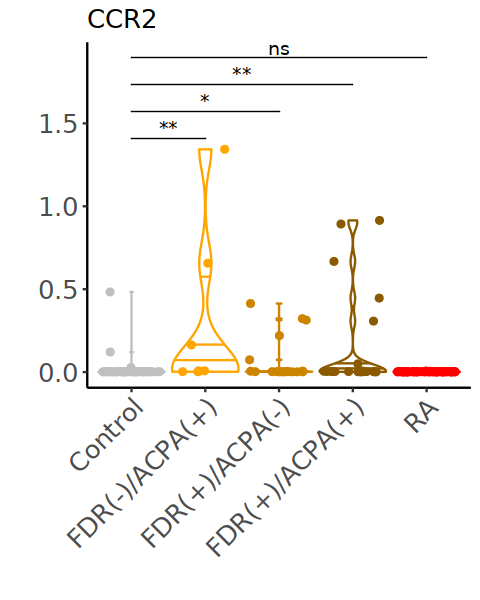

[1] "CCR7"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.100  
2 FDR(+)/ACPA(+) 0.00603
3 FDR(+)/ACPA(-) 0.0650 
4 FDR(-)/ACPA(+) 0.00532
5 RA             0.0413 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


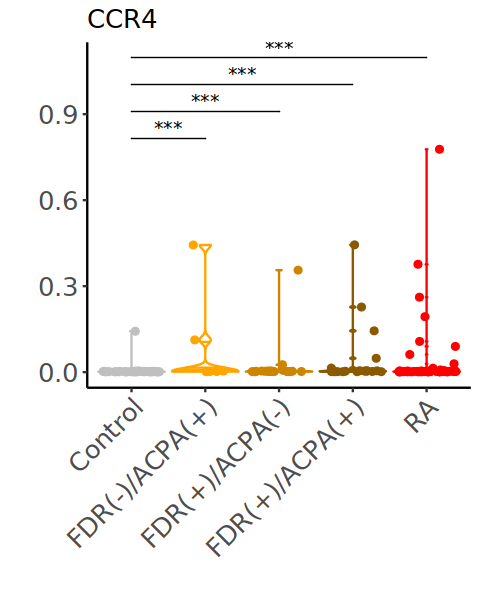

[1] "CD103"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.00101 
2 FDR(+)/ACPA(+) 0.000998
3 FDR(+)/ACPA(-) 0.000891
4 FDR(-)/ACPA(+) 0.00111 
5 RA             0.000991


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


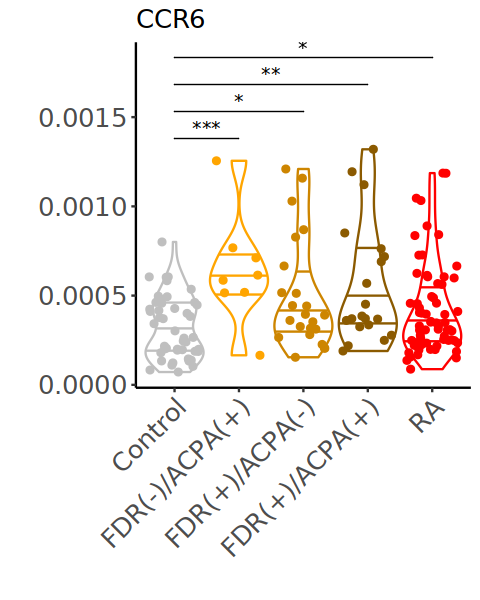

[1] "CD11b"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000741
2 FDR(+)/ACPA(+) 0.000772
3 FDR(+)/ACPA(-) 0.000848
4 FDR(-)/ACPA(+) 0.000755
5 RA             0.000822


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


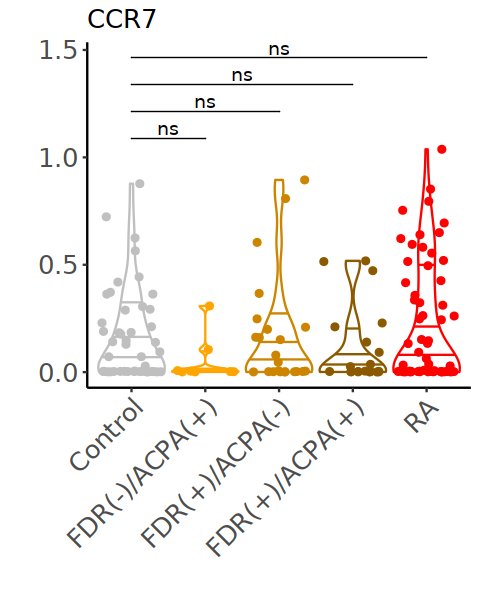

[1] "CD127"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.40
2 FDR(+)/ACPA(+)  1.44
3 FDR(+)/ACPA(-)  1.42
4 FDR(-)/ACPA(+)  1.46
5 RA              1.39


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


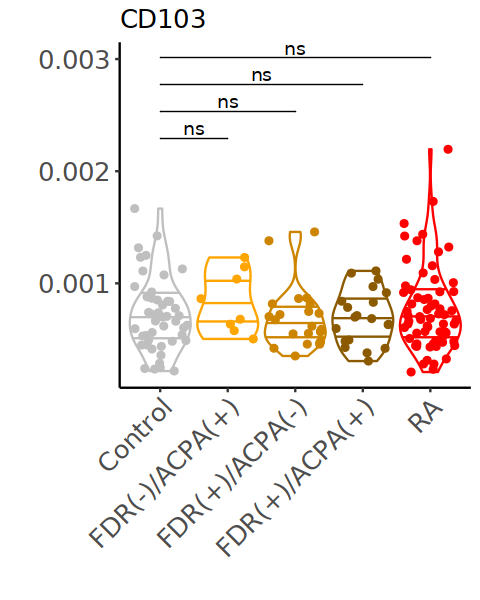

[1] "CD15s"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000626
2 FDR(+)/ACPA(+) 0.000560
3 FDR(+)/ACPA(-) 0.000604
4 FDR(-)/ACPA(+) 0.000617
5 RA             0.000555


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


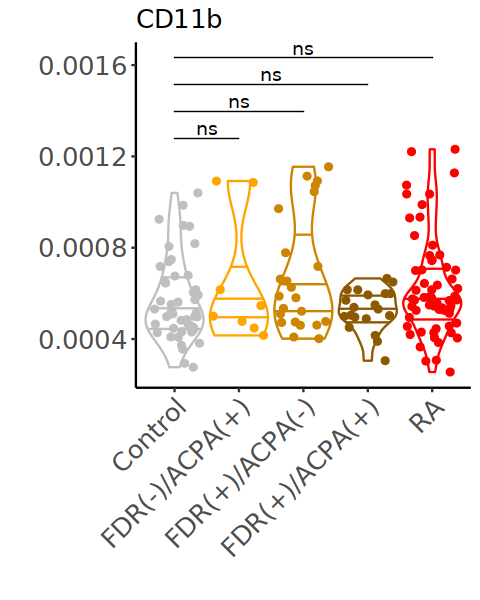

[1] "CD161"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00215
2 FDR(+)/ACPA(+) 0.00238
3 FDR(+)/ACPA(-) 0.00227
4 FDR(-)/ACPA(+) 0.00353
5 RA             0.00186


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


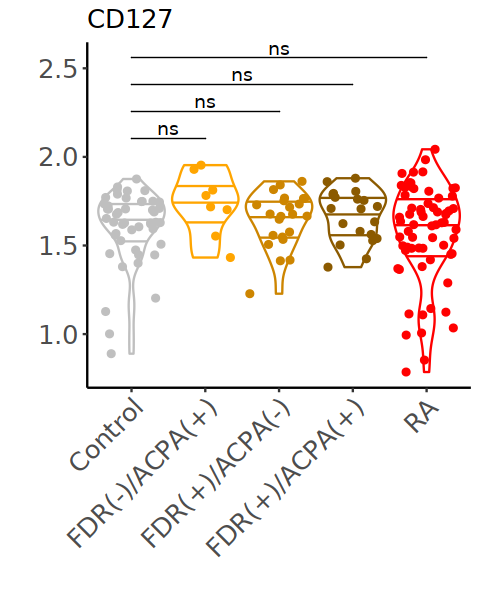

[1] "CD172ab"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00253
2 FDR(+)/ACPA(+) 0.00374
3 FDR(+)/ACPA(-) 0.00279
4 FDR(-)/ACPA(+) 0.163  
5 RA             0.00167


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


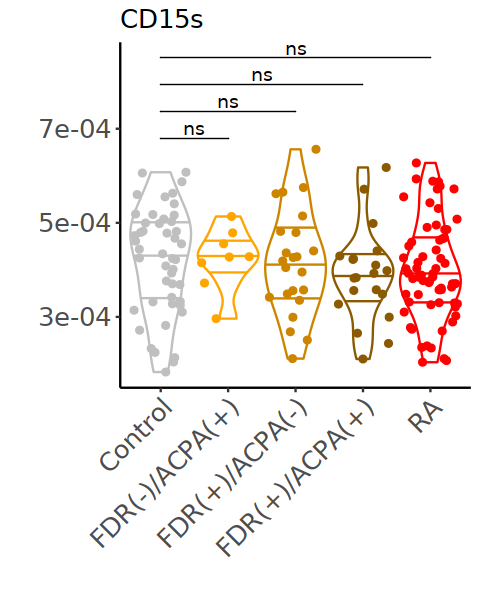

[1] "CD20"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00225
2 FDR(+)/ACPA(+) 0.00242
3 FDR(+)/ACPA(-) 0.00226
4 FDR(-)/ACPA(+) 0.00242
5 RA             0.00230


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


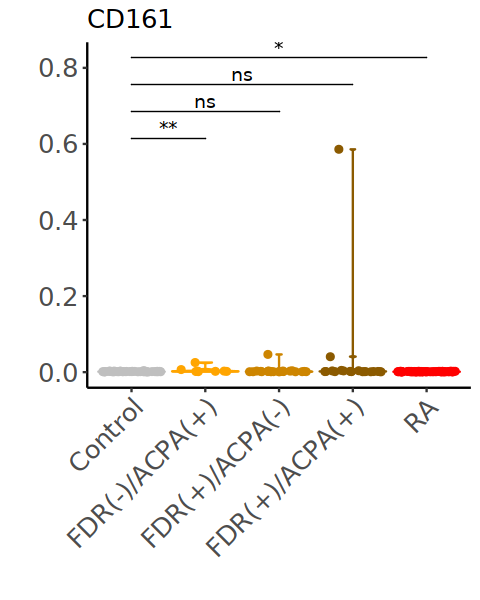

[1] "CD25"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00224
2 FDR(+)/ACPA(+) 0.00294
3 FDR(+)/ACPA(-) 0.00278
4 FDR(-)/ACPA(+) 0.00335
5 RA             0.00349


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


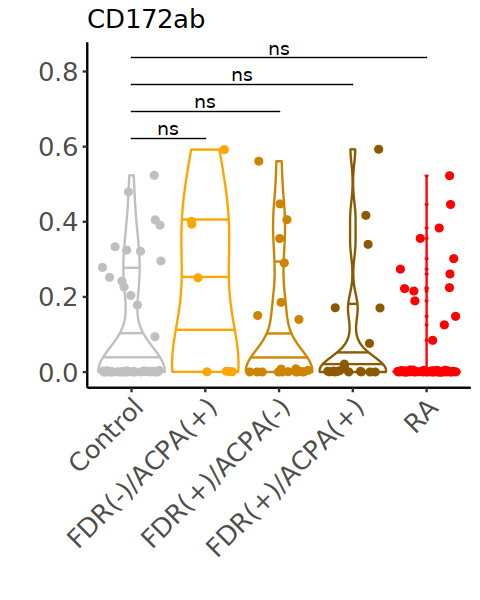

[1] "CD3"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.59
2 FDR(+)/ACPA(+)  1.59
3 FDR(+)/ACPA(-)  1.59
4 FDR(-)/ACPA(+)  1.61
5 RA              1.59


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


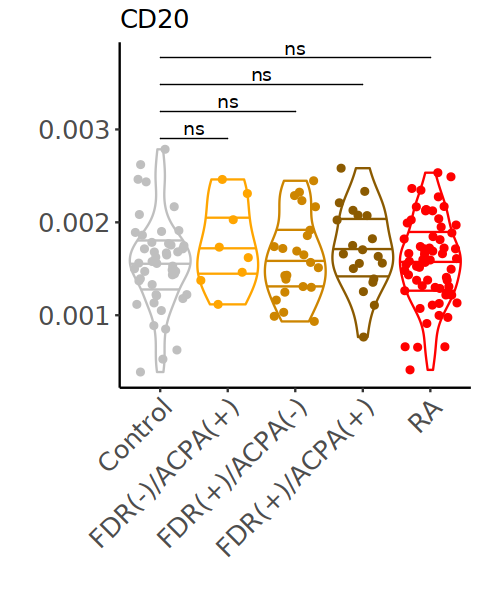

[1] "CD38"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00487
2 FDR(+)/ACPA(+) 0.00493
3 FDR(+)/ACPA(-) 0.00566
4 FDR(-)/ACPA(+) 0.00336
5 RA             0.00466


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


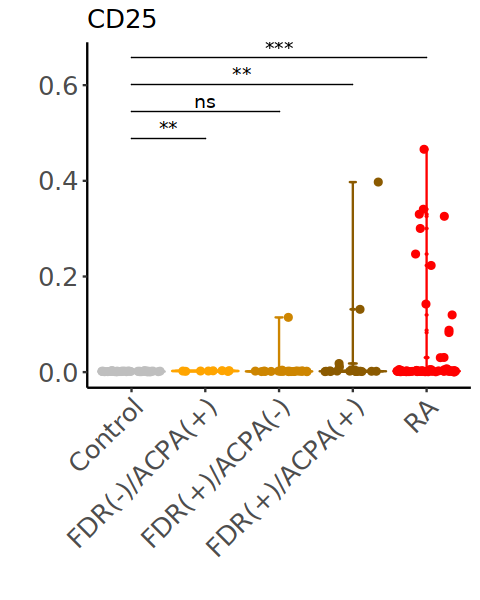

[1] "CD39"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00132
2 FDR(+)/ACPA(+) 0.00160
3 FDR(+)/ACPA(-) 0.00164
4 FDR(-)/ACPA(+) 0.00189
5 RA             0.00168


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


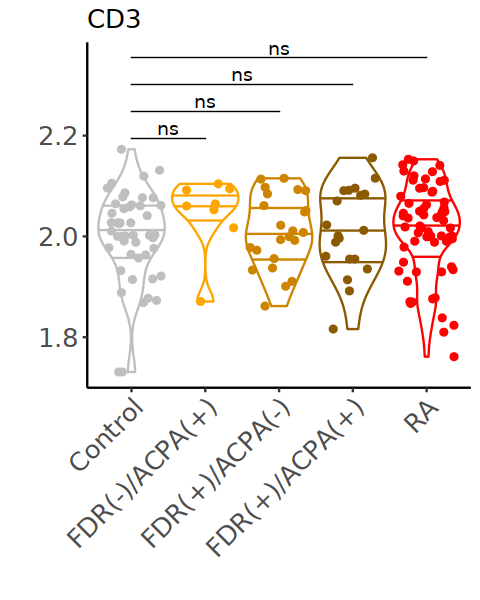

[1] "CD4"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.39
2 FDR(+)/ACPA(+)  1.40
3 FDR(+)/ACPA(-)  1.43
4 FDR(-)/ACPA(+)  1.49
5 RA              1.43


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


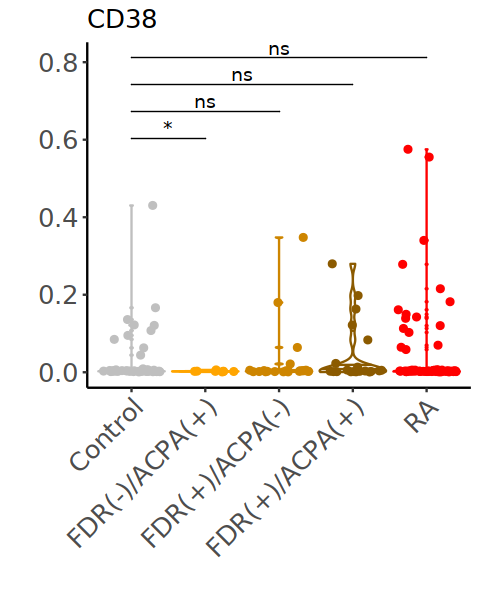

[1] "CD40L"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.286
2 FDR(+)/ACPA(+) 0.433
3 FDR(+)/ACPA(-) 0.410
4 FDR(-)/ACPA(+) 0.509
5 RA             0.413


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


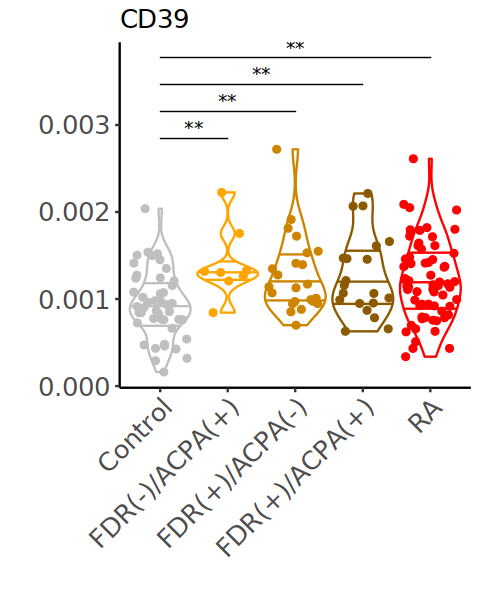

[1] "CD45"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.48
2 FDR(+)/ACPA(+)  1.48
3 FDR(+)/ACPA(-)  1.49
4 FDR(-)/ACPA(+)  1.67
5 RA              1.51


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


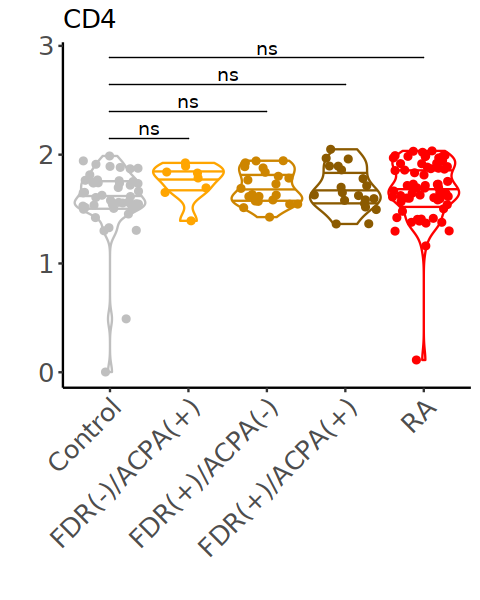

[1] "CD45RA"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.262  
2 FDR(+)/ACPA(+) 0.00546
3 FDR(+)/ACPA(-) 0.122  
4 FDR(-)/ACPA(+) 0.0203 
5 RA             0.199  


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


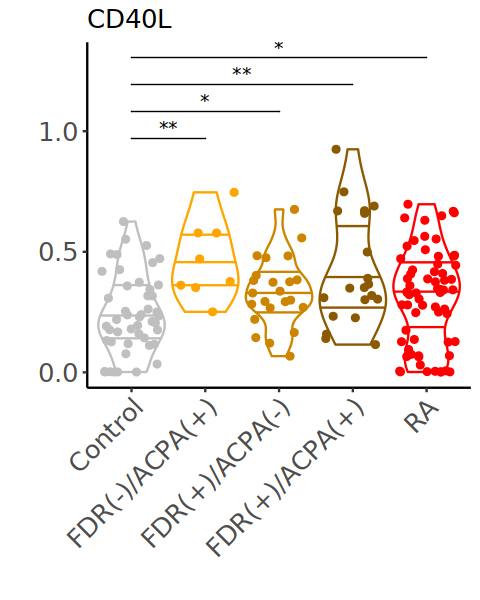

[1] "CD45RO"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00566
2 FDR(+)/ACPA(+) 0.177  
3 FDR(+)/ACPA(-) 0.147  
4 FDR(-)/ACPA(+) 0.599  
5 RA             0.0100 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


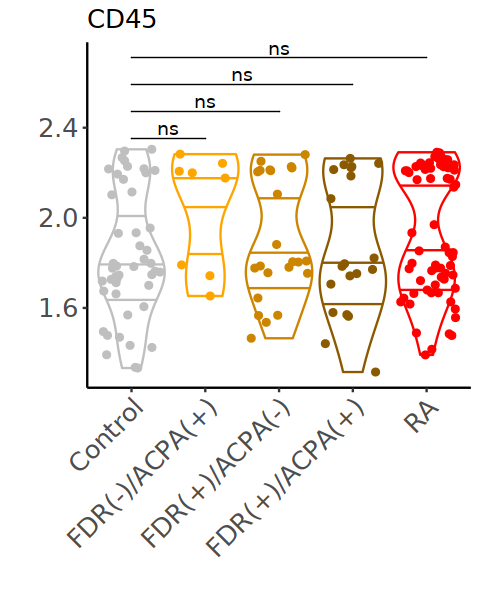

[1] "CD56"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00194
2 FDR(+)/ACPA(+) 0.00213
3 FDR(+)/ACPA(-) 0.00238
4 FDR(-)/ACPA(+) 0.00251
5 RA             0.00194


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


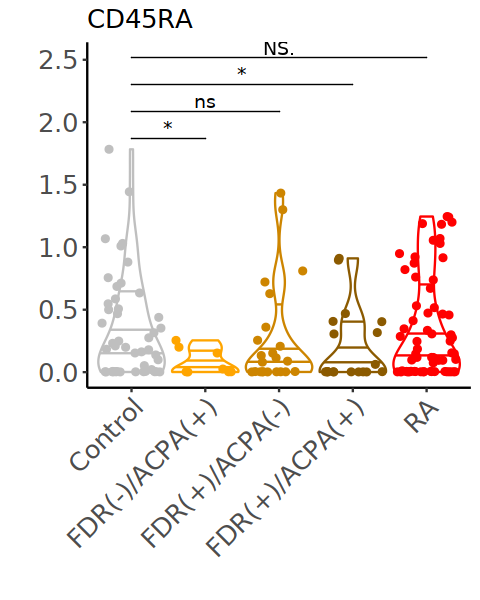

[1] "CD57"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.120  
2 FDR(+)/ACPA(+) 0.00643
3 FDR(+)/ACPA(-) 0.00600
4 FDR(-)/ACPA(+) 0.146  
5 RA             0.107  


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


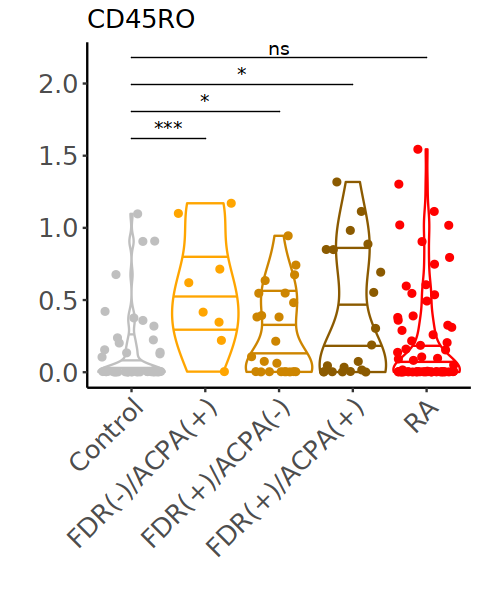

[1] "CD69"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.00112 
2 FDR(+)/ACPA(+) 0.00111 
3 FDR(+)/ACPA(-) 0.000980
4 FDR(-)/ACPA(+) 0.00116 
5 RA             0.00113 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


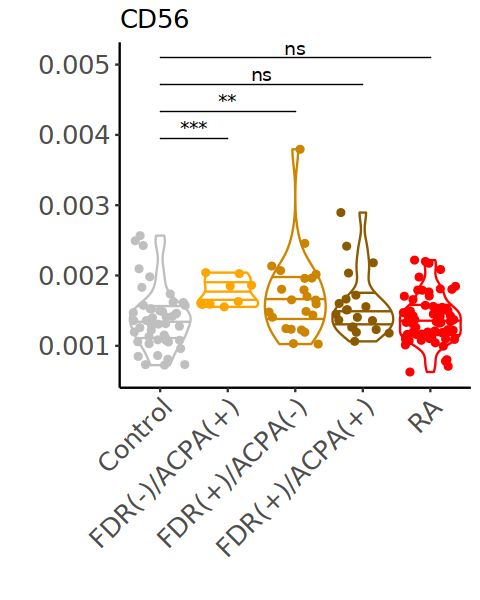

[1] "CD8a"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00480
2 FDR(+)/ACPA(+) 0.00407
3 FDR(+)/ACPA(-) 0.00443
4 FDR(-)/ACPA(+) 0.0102 
5 RA             0.00411


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


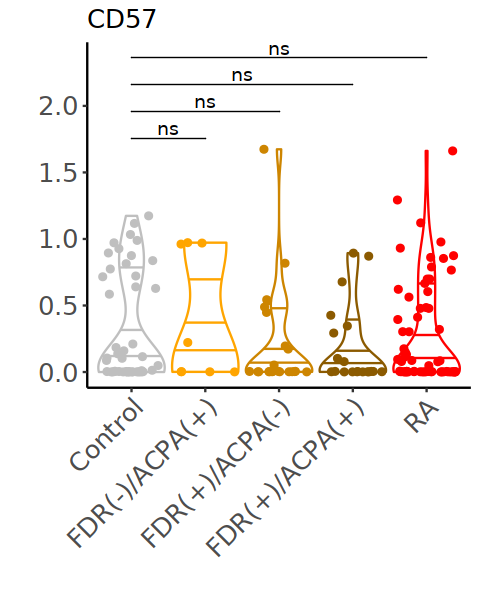

[1] "CD8b"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00316
2 FDR(+)/ACPA(+) 0.00249
3 FDR(+)/ACPA(-) 0.00234
4 FDR(-)/ACPA(+) 0.00256
5 RA             0.00243


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


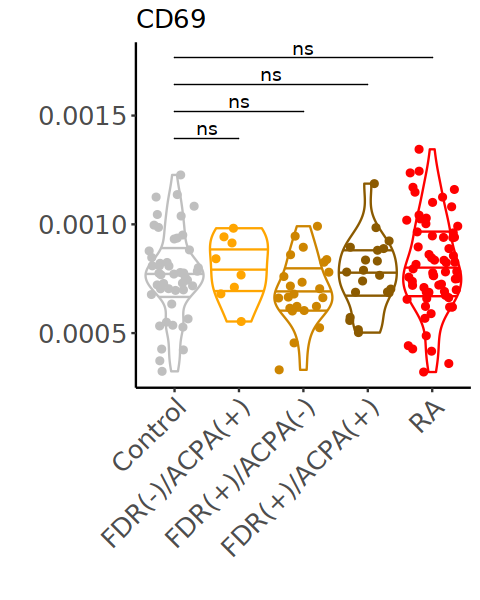

[1] "CTLA-4"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk              med
  <chr>             <dbl>
1 Control        0.000906
2 FDR(+)/ACPA(+) 0.00108 
3 FDR(+)/ACPA(-) 0.00111 
4 FDR(-)/ACPA(+) 0.00136 
5 RA             0.00121 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


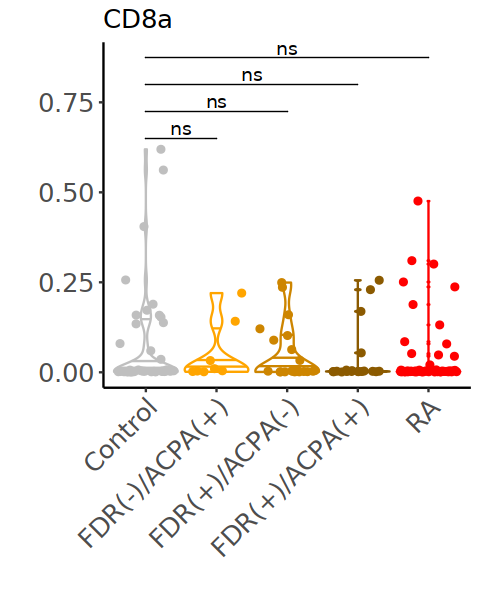

[1] "CX3CR1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00343
2 FDR(+)/ACPA(+) 0.00519
3 FDR(+)/ACPA(-) 0.00495
4 FDR(-)/ACPA(+) 0.00671
5 RA             0.00392


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


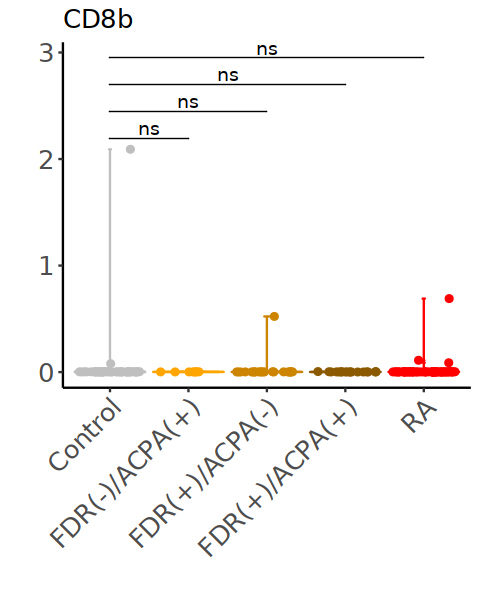

[1] "CXCR3"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.318
2 FDR(+)/ACPA(+) 0.506
3 FDR(+)/ACPA(-) 0.494
4 FDR(-)/ACPA(+) 0.649
5 RA             0.292


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


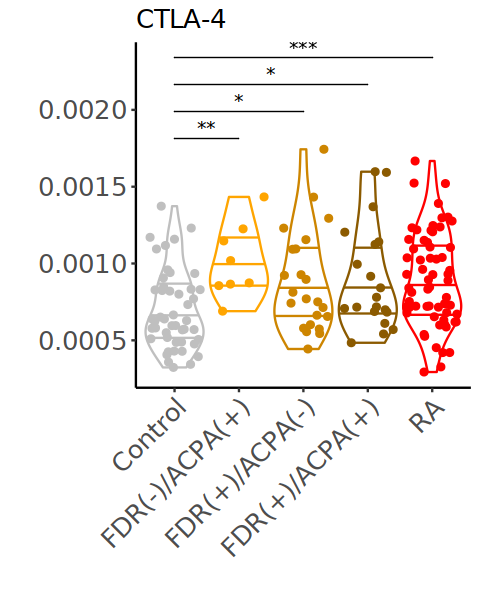

[1] "CXCR5"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00159
2 FDR(+)/ACPA(+) 0.00260
3 FDR(+)/ACPA(-) 0.00206
4 FDR(-)/ACPA(+) 0.00298
5 RA             0.00219


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


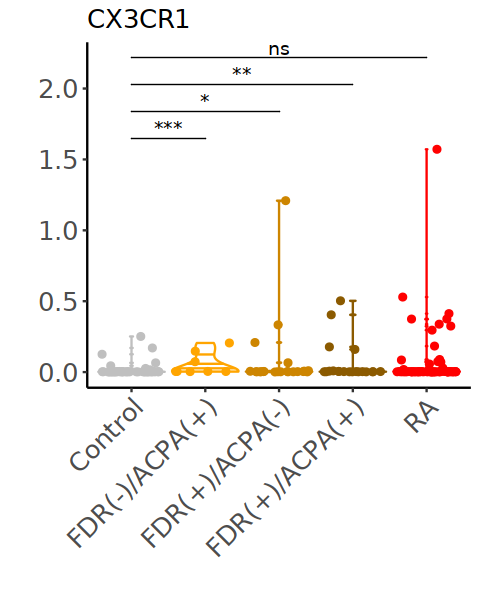

[1] "FoxP3"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.106
2 FDR(+)/ACPA(+) 0.227
3 FDR(+)/ACPA(-) 0.175
4 FDR(-)/ACPA(+) 0.253
5 RA             0.265


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


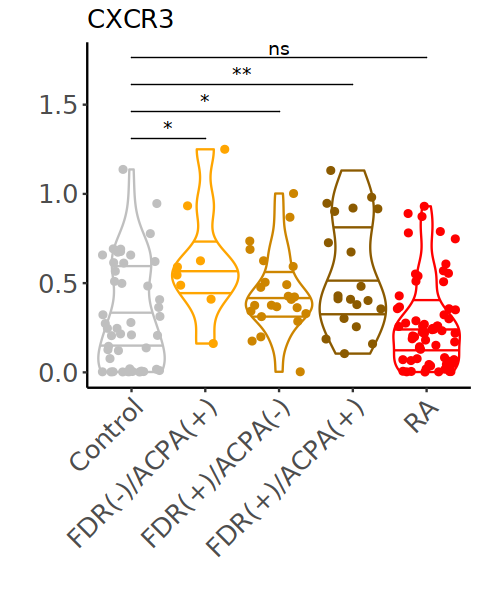

[1] "GATA3"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.228
2 FDR(+)/ACPA(+) 0.406
3 FDR(+)/ACPA(-) 0.346
4 FDR(-)/ACPA(+) 0.245
5 RA             0.319


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


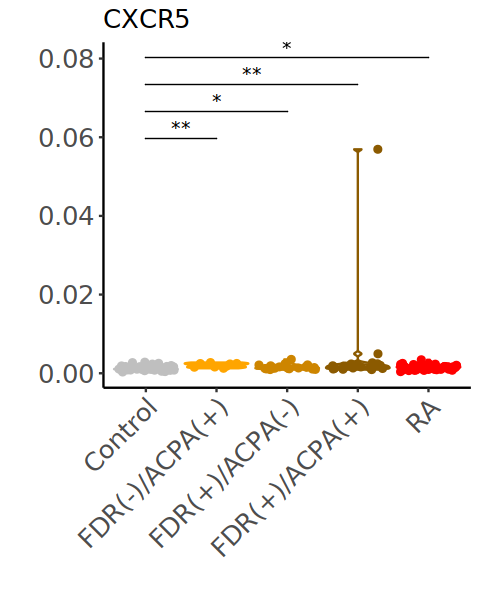

[1] "GZMB"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00333
2 FDR(+)/ACPA(+) 0.00473
3 FDR(+)/ACPA(-) 0.00434
4 FDR(-)/ACPA(+) 0.00439
5 RA             0.00519


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


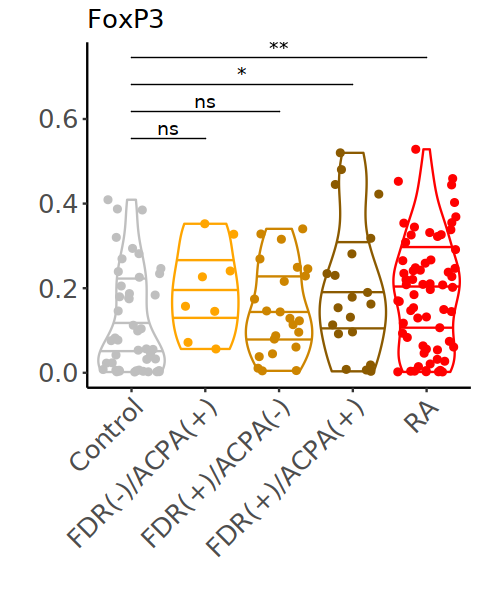

[1] "GZMK"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00178
2 FDR(+)/ACPA(+) 0.00193
3 FDR(+)/ACPA(-) 0.00188
4 FDR(-)/ACPA(+) 0.00260
5 RA             0.00118


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


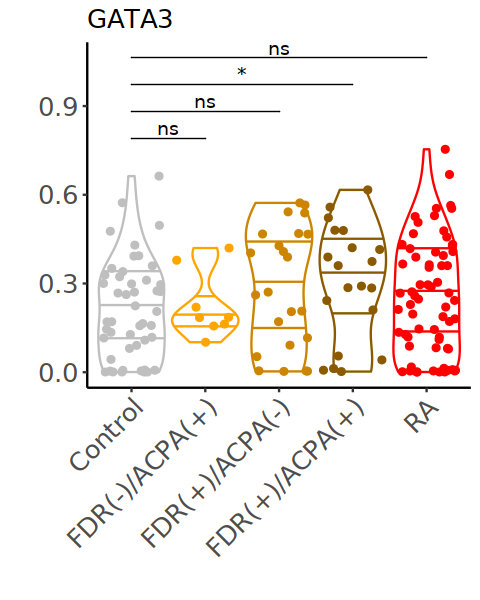

[1] "HLA-DR"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00297
2 FDR(+)/ACPA(+) 0.00355
3 FDR(+)/ACPA(-) 0.00263
4 FDR(-)/ACPA(+) 0.00369
5 RA             0.00345


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


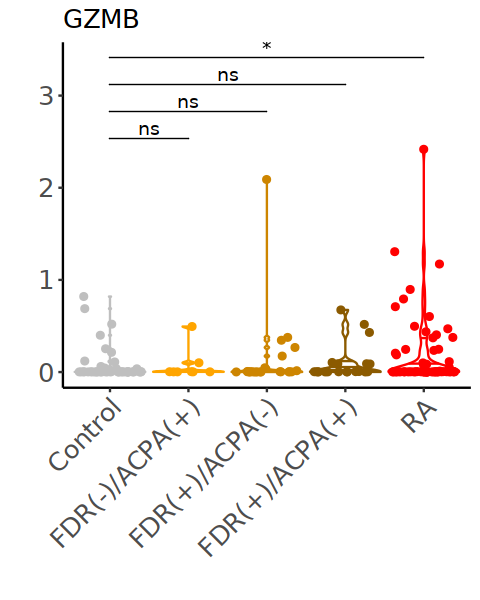

[1] "Helios"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.479
2 FDR(+)/ACPA(+) 0.518
3 FDR(+)/ACPA(-) 0.477
4 FDR(-)/ACPA(+) 0.559
5 RA             0.533


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


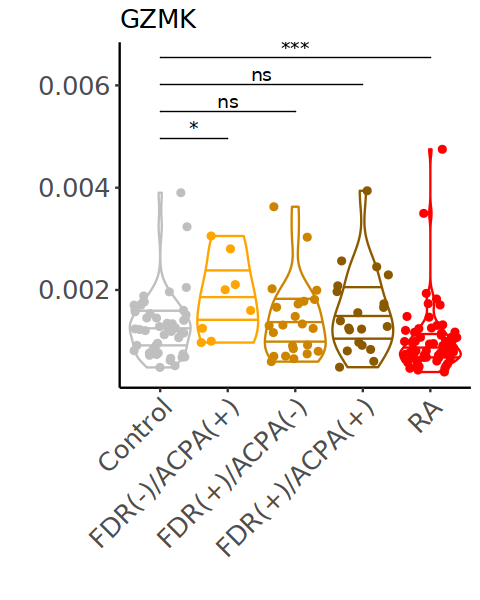

[1] "ICOS"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.444
2 FDR(+)/ACPA(+) 0.444
3 FDR(+)/ACPA(-) 0.415
4 FDR(-)/ACPA(+) 0.462
5 RA             0.519


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


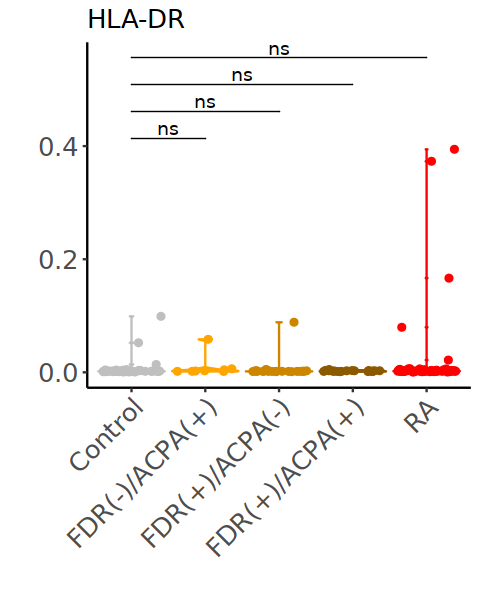

[1] "Ki67"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00123
2 FDR(+)/ACPA(+) 0.00149
3 FDR(+)/ACPA(-) 0.00145
4 FDR(-)/ACPA(+) 0.00160
5 RA             0.00145


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


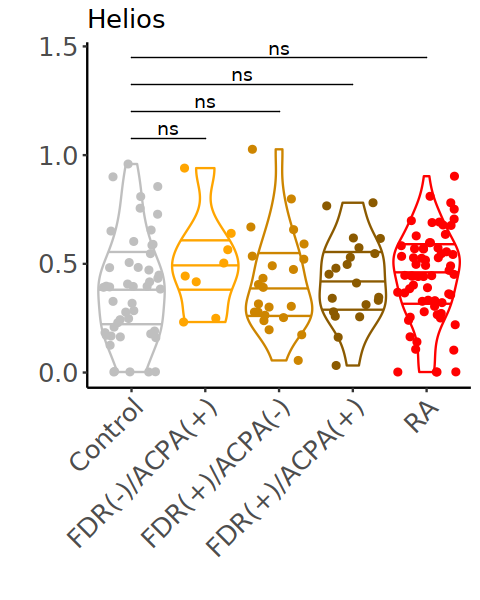

[1] "MX1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control        0.842
2 FDR(+)/ACPA(+) 0.979
3 FDR(+)/ACPA(-) 0.927
4 FDR(-)/ACPA(+) 0.929
5 RA             1.01 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


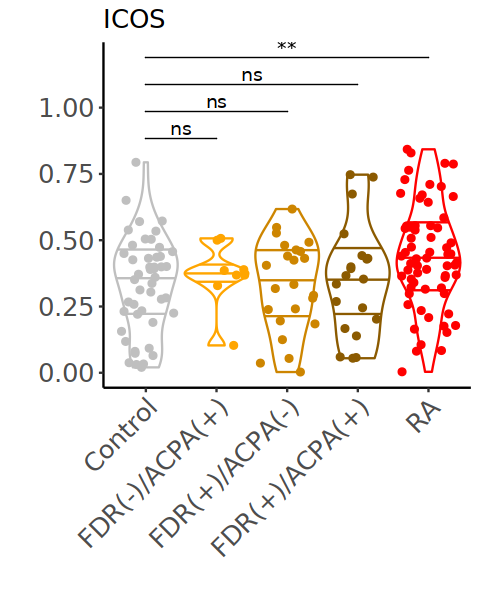

[1] "Nur77"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk            med
  <chr>           <dbl>
1 Control        0.0964
2 FDR(+)/ACPA(+) 0.164 
3 FDR(+)/ACPA(-) 0.0949
4 FDR(-)/ACPA(+) 0.341 
5 RA             0.217 


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


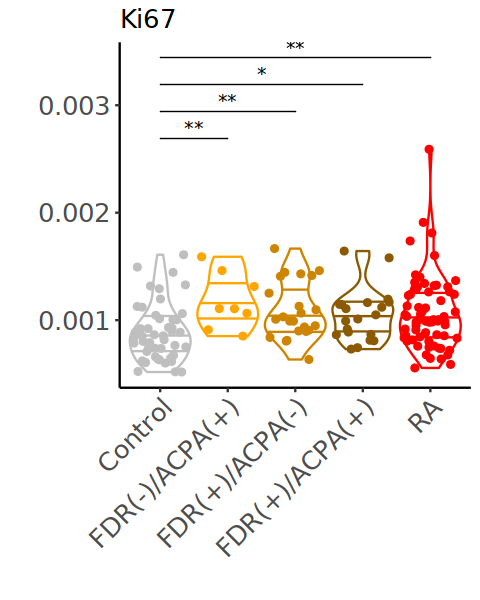

[1] "PD-1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00107
2 FDR(+)/ACPA(+) 0.00145
3 FDR(+)/ACPA(-) 0.00144
4 FDR(-)/ACPA(+) 0.00193
5 RA             0.00132


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


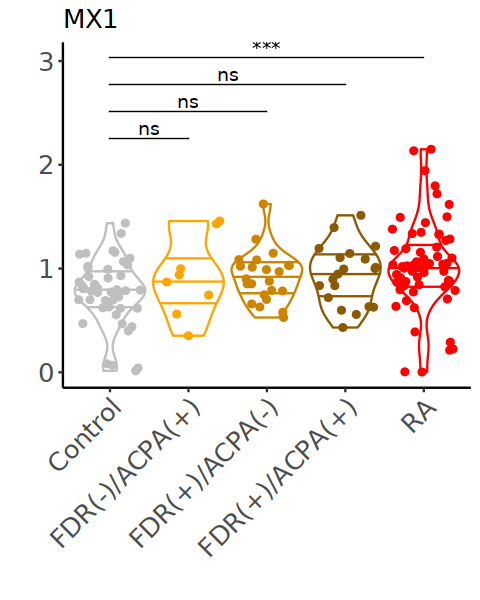

[1] "PU.1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00167
2 FDR(+)/ACPA(+) 0.00214
3 FDR(+)/ACPA(-) 0.00194
4 FDR(-)/ACPA(+) 0.00255
5 RA             0.00241


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


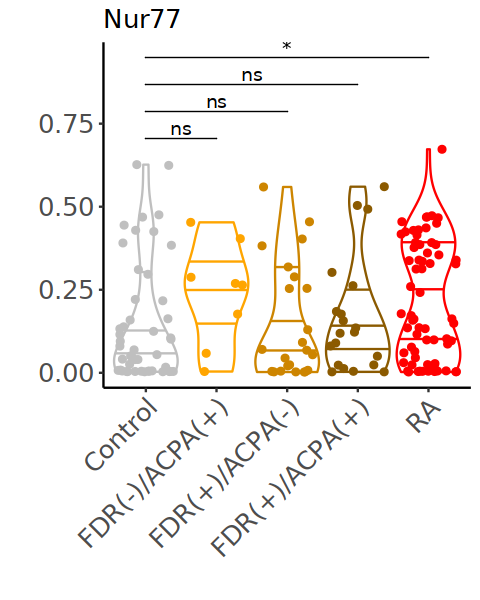

[1] "RORgt"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00272
2 FDR(+)/ACPA(+) 0.00406
3 FDR(+)/ACPA(-) 0.00324
4 FDR(-)/ACPA(+) 0.00391
5 RA             0.00349


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


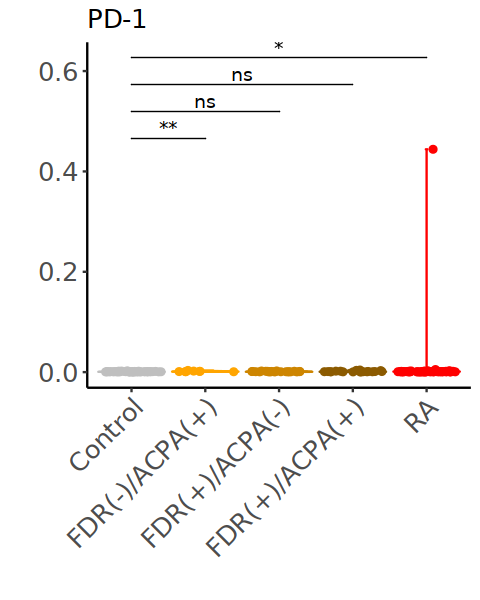

[1] "SH2D1A"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.27
2 FDR(+)/ACPA(+)  1.26
3 FDR(+)/ACPA(-)  1.25
4 FDR(-)/ACPA(+)  1.28
5 RA              1.26


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


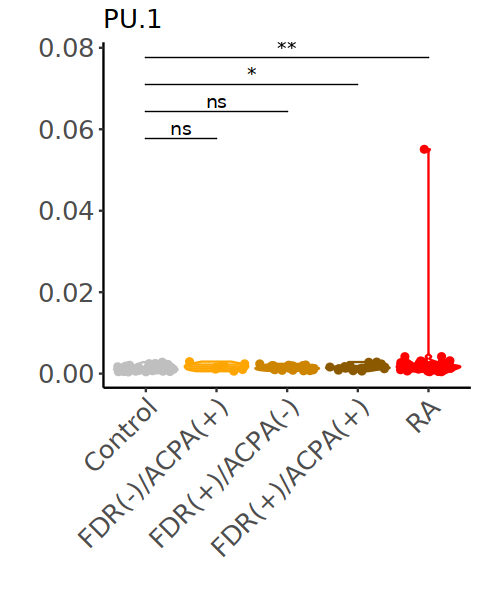

[1] "T-bet"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00547
2 FDR(+)/ACPA(+) 0.133  
3 FDR(+)/ACPA(-) 0.00757
4 FDR(-)/ACPA(+) 0.254  
5 RA             0.00488


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


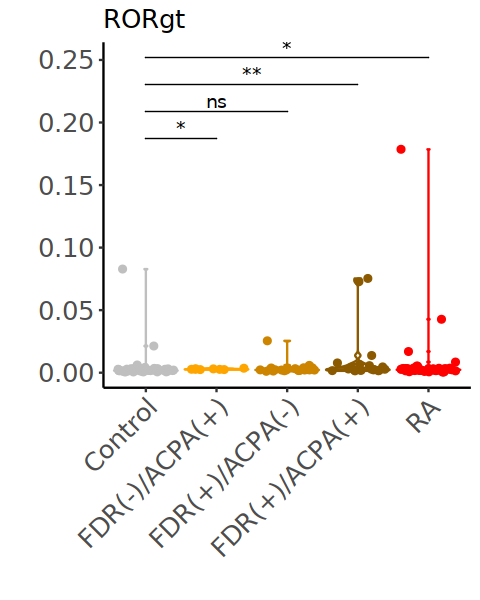

[1] "TACTILE"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00572
2 FDR(+)/ACPA(+) 0.00793
3 FDR(+)/ACPA(-) 0.00818
4 FDR(-)/ACPA(+) 0.0703 
5 RA             0.00759


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


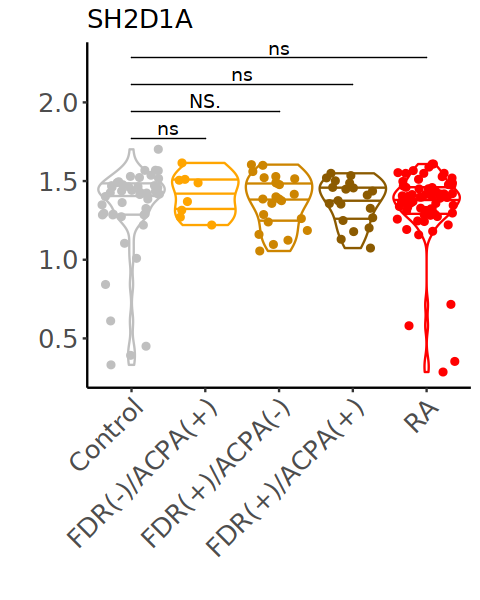

[1] "TCF1"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk           med
  <chr>          <dbl>
1 Control         1.12
2 FDR(+)/ACPA(+)  1.10
3 FDR(+)/ACPA(-)  1.17
4 FDR(-)/ACPA(+)  1.01
5 RA              1.17


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


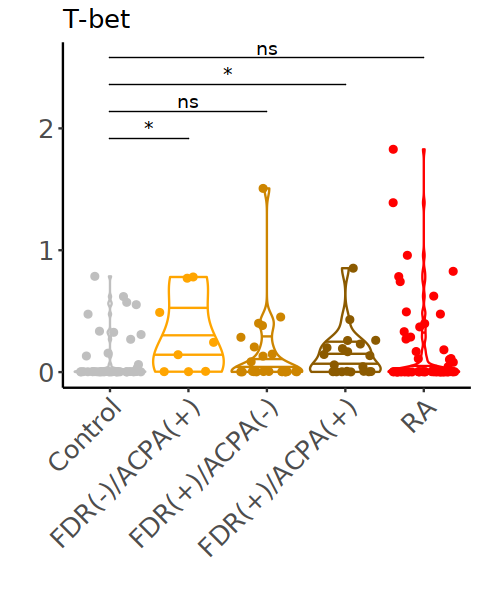

[1] "TIGIT"


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


# A tibble: 5 × 2
  AtRisk             med
  <chr>            <dbl>
1 Control        0.00235
2 FDR(+)/ACPA(+) 0.00311
3 FDR(+)/ACPA(-) 0.00275
4 FDR(-)/ACPA(+) 0.00317
5 RA             0.00292


`summarise()` has grouped output by 'subject_id'. You can override using the
`.groups` argument.


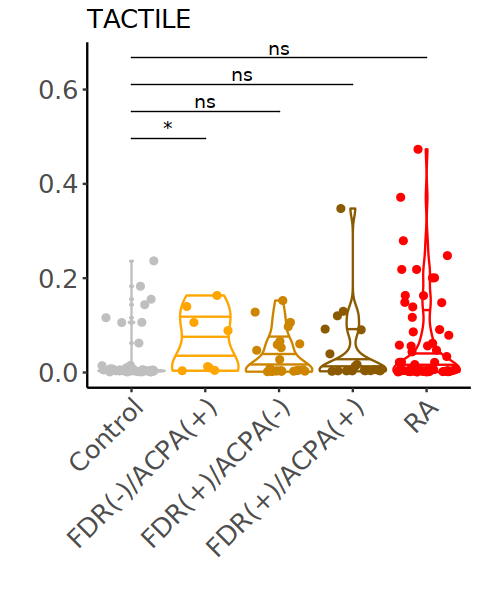

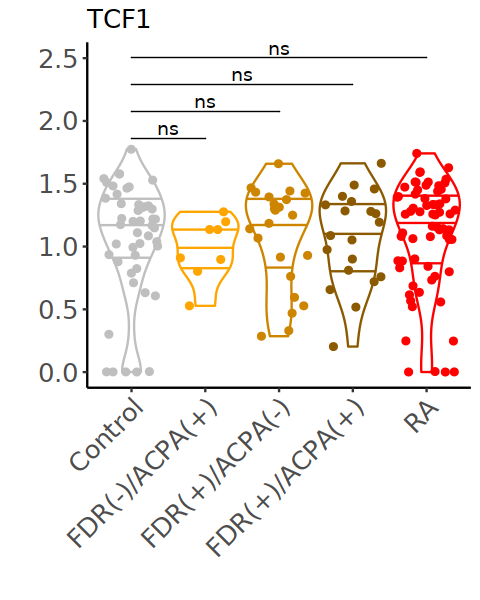

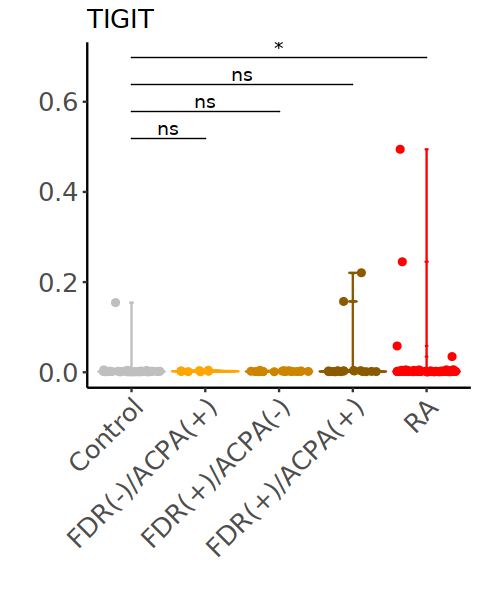

In [29]:
options(repr.plot.height = 5, repr.plot.width = 4)
for (gene in markers){
  print(gene)
  
  data.frame(ph_markers_data_arcsinh, subject_id = umap_res$subject_id, AtRisk = umap_res$AtRisk) %>% 
    dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
    dplyr::mutate(expr = ph_markers_data_arcsinh[,grepl(paste0("^",gene,"$"),colnames(ph_markers_data_arcsinh))]) %>%
    dplyr::group_by(subject_id, AtRisk) %>%
    dplyr::summarize(med = quantile(log2(expr+1), probs = c(0.5))) %>%
    dplyr::group_by(AtRisk) %>%
    dplyr::summarize(med = quantile(log2(med+1), probs = c(0.5))) %>% print()
  plot(
    data.frame(ph_markers_data_arcsinh, subject_id = umap_res$subject_id, AtRisk = umap_res$AtRisk) %>% 
      dplyr::mutate(AtRisk = ifelse(AtRisk=="FDR(-)/ACPA(-)","Control",as.character(AtRisk))) %>%
      dplyr::mutate(expr = ph_markers_data_arcsinh[,grepl(paste0("^",gene,"$"),colnames(ph_markers_data_arcsinh))]) %>%
      dplyr::group_by(subject_id, AtRisk) %>%
      dplyr::summarize(med = quantile(log2(expr+1), probs = c(0.5))) %>%
      as.data.frame() %>%
      dplyr::mutate(AtRisk = factor(AtRisk,levels = c("Control","FDR(-)/ACPA(+)","FDR(+)/ACPA(-)","FDR(+)/ACPA(+)","RA"))) %>%
      ggplot(., aes(x = AtRisk, y=med, fill = AtRisk, color = AtRisk)) + 
      geom_violin(aes(color = AtRisk), fill = "white", scale = "width", draw_quantiles = c(0.25, 0.5, 0.75)) +
      geom_jitter(aes(fill = AtRisk, color = AtRisk)) +
      ggpubr::stat_compare_means(
        comparisons = list(c("Control", "FDR(-)/ACPA(+)"), c("Control", "FDR(+)/ACPA(-)"), c("Control", "FDR(+)/ACPA(+)"), c("Control", "RA")),
        label = "p.signif",
        tip.length = 0
      ) +
      scale_fill_manual(values=c("Control" = "grey75","FDR(-)/ACPA(+)" = "orange","FDR(+)/ACPA(-)" = "orange3","FDR(+)/ACPA(+)" = "orange4","RA" = "red")) +
      scale_color_manual(values=c("Control" = "grey75","FDR(-)/ACPA(+)" = "orange","FDR(+)/ACPA(-)" = "orange3","FDR(+)/ACPA(+)" = "orange4","RA" = "red")) + 
      theme_classic() +
      theme(strip.text.x=element_text(size=15, color="black", face="bold"),
            strip.text.y=element_text(size=15, color="black", face="bold"),
            legend.position = "none",
            plot.title = element_text(size=15),
            axis.title.x = element_text(size=15),
            axis.title.y = element_text(size =15),
            axis.text.y = element_text(size = 15),
            axis.text.x = element_text(size = 15, angle = 45, hjust=1),
            legend.text =  element_text(size = 15),
            legend.key.size = grid::unit(0.5, "lines"),
            legend.title = element_text(size = 0.8, hjust = 0)) +
      labs(title = gene,
           x = "",
           y = "") 
  )
  
}


In [ ]:
# CNA; covarying neighborhood analysis

In [30]:
obj = readRDS(paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/SeuratObj_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
obj@meta.data$subject_id <- stringr::str_split(obj@meta.data$OmiqFileIndex, pattern="_", simplify=TRUE)[,3] %>% 
                                    stringr::str_split(., pattern="\\-V", simplify=TRUE) %>%
                                    as.data.frame() %>%
                                    .[,1] %>%
                                    gsub("-","_",.)

umap_res <- readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/umap_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
# remove clusters less than cut off
min_cell_cluster = 30
clu = umap_res %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(count = dplyr::n()) %>%
    dplyr::arrange(count) %>%
    dplyr::filter(count > min_cell_cluster) %>%
    .$res_cell %>%
    unique()
clu_logi = umap_res$res_cell %in% clu
umap_res = umap_res[clu_logi,]

# Find cluster center
cluster_center <- umap_res %>%
  dplyr::group_by(res_cell) %>%
  dplyr::summarise_at(vars(UMAP1, UMAP2), dplyr::funs(median(., na.rm=TRUE)))
cluster_center <- as.data.frame(cluster_center)
cluster_center$res_cell <- as.character(cluster_center$res_cell)

Loading required package: SeuratObject

Attaching sp



In [32]:
# meta data

batch_fl = readRDS(file=paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/meta_Prop",prop,"_Nmin",n_min,".rds"))
batch_fl$subject_id <- stringr::str_split(batch_fl$OmiqFileIndex, pattern="_", simplify=TRUE)[,3] %>% 
  stringr::str_split(., pattern="\\-V", simplify=TRUE) %>%
  as.data.frame() %>%
  .[,1] %>%
  gsub("-","_",.)
batch_fl = batch_fl[clu_logi,]
umap_res$subject_id = batch_fl$subject_id
umap_res$time_point = batch_fl$time_point
all(umap_res$subject_id == obj@meta.data$subject_id)

meta<- read.table("/projects/jinamo@xsede.org/cytof/data/RA_AtRiskRA_Control_meta.txt",sep="\t",header=TRUE, na.strings=c("","NA")) %>%
    dplyr::mutate(age_at_biopsy = as.integer(age_at_biopsy),
                  diagnosis = factor(diagnosis, levels=c("Control","AtRiskRA","RA")))
meta = merge(meta,obj@meta.data,by="subject_id")
meta = meta[order(match(meta$subject_id, obj@meta.data$subject_id)),]
print(head(meta))
print(dim(meta))
table(meta$sex)
table(meta$ethnicity)
table(meta$sex)
table(meta$AMP_Group)
table(meta$CCP)
table(meta$RF)
all(meta$subject_id == obj@meta.data$subject_id)

meta_add = read.table("/projects/jinamo@xsede.org/cytof/data/meta_clinical_RA.txt", header = TRUE, sep = "\t") %>%
  dplyr::mutate(CDAI = as.numeric(CDAI),
                subject_id = gsub("-","_",subject_id),
                treatment = dplyr::case_when(
                  treatment == "1" ~ "naive",
                  treatment == "2" ~ "MTX failure",
                  treatment == "3" ~ "TNF failure",
                  treatment == "4" ~ "OA"
                )) %>%
  dplyr::select(-c(sex))
meta_add = dplyr::left_join(obj@meta.data[,!grepl("CDAI",colnames(obj@meta.data))],meta_add,by="subject_id")

meta_add2 = read.table("/projects/jinamo@xsede.org/cytof/data/clinical_data_for_FAN_from_Kat.txt", header = TRUE, sep = "\t") %>%
  dplyr::select(-c(sex))
meta_add2 = dplyr::left_join(obj@meta.data[,!grepl("CDAI",colnames(obj@meta.data))],meta_add2,by="subject_id")

meta_add3 = read.table("/projects/jinamo@xsede.org/cytof/data/RA_Cleaned_aggregate_vars.txt", header = TRUE, sep = "\t") %>%
  dplyr::select(c(subject_id,HAQ,das28_crp3,bmi,ra_group,pathotype_str,sdai,ccp_type,ccp_range,rf_range,mdtjc28_sum,mdsjc28_sum,diabetes,Race_white,Race_black,Race_multiple,Race_other,MTX,SSZ,HCQ,LEF,TNFi))
meta_add3 = dplyr::left_join(obj@meta.data,meta_add3,by="subject_id")

meta_total = read.csv("/projects/jinamo@xsede.org/cytof/data/Total_Metadata.csv") %>%
    dplyr::mutate(subject_id = gsub("-","_",Patient)) %>%
    dplyr::distinct(subject_id,Site,Race)
meta_total = meta_total[!(is.na(meta_total$Race) | meta_total$Race==""), ]
meta_total = merge(umap_res,meta_total,by="subject_id")
meta_total = meta_total[order(match(meta_total$subject_id, umap_res$subject_id)),]


[1] TRUE

Warning message in mask$eval_all_mutate(quo):
“NAs introduced by coercion”


  subject_id age_at_biopsy    sex    ethnicity diagnosis collection_method ctap
1   200_0272            28 female not_hispanic   Control              <NA> <NA>
2   200_0272            28 female not_hispanic   Control              <NA> <NA>
3   200_0272            28 female not_hispanic   Control              <NA> <NA>
4   200_0272            28 female not_hispanic   Control              <NA> <NA>
5   200_0272            28 female not_hispanic   Control              <NA> <NA>
6   200_0272            28 female not_hispanic   Control              <NA> <NA>
  AMP_Group  CCP   RF CCP30_titer CCP31_titer RF_IgM_titer RF_IgG_titer
1      <NA> <NA> <NA>          NA          NA           NA           NA
2      <NA> <NA> <NA>          NA          NA           NA           NA
3      <NA> <NA> <NA>          NA          NA           NA           NA
4      <NA> <NA> <NA>          NA          NA           NA           NA
5      <NA> <NA> <NA>          NA          NA           NA           NA
6      <


 female    male 
1561901  634500 


hispanic_latino    not_hispanic 
         345848         1835110 


 female    male 
1561901  634500 


   FDR     GP 
449194 159104 


Negative Positive 
  320073   288225 


Negative Positive 
  488301   119997 

[1] TRUE

In [33]:
# merge meta data to Seurat object
obj@meta.data$AtRisk = dplyr::case_when(
  meta$AMP_Group == "FDR" & meta$CCP == "Positive" ~ "FDR(+)/ACPA(+)",
  meta$AMP_Group == "GP" & meta$CCP == "Positive" ~ "FDR(-)/ACPA(+)",
  meta$AMP_Group == "FDR" & meta$CCP == "Negative" ~ "FDR(+)/ACPA(-)",
  meta$AMP_Group == "GP" & meta$CCP == "Negative" ~ "FDR(-)/ACPA(-)",
  obj@meta.data$disease == "Control" ~ "Control",
  obj@meta.data$disease == "RA" ~ "RA")
obj@meta.data$age_at_biopsy <- as.numeric(meta$age_at_biopsy)
obj@meta.data$sex <- as.numeric(factor(meta$sex, c('female', 'male')))
obj@meta.data$ethnicity <- as.numeric(factor(meta$ethnicity, c('not_hispanic', 'hispanic_latino')))
obj@meta.data$AMP_Group <- as.numeric(factor(meta$AMP_Group, c('GP', 'FDR')))
obj@meta.data$CCP <- as.numeric(factor(meta$CCP, c('Negative', 'Positive')))
obj@meta.data$CCP30_titer <- as.numeric(meta$CCP30_titer)
obj@meta.data$CCP31_titer <- as.numeric(meta$CCP31_titer)
obj@meta.data$RF <- as.numeric(factor(meta$RF, c('Negative', 'Positive')))
obj@meta.data$RF_IgM_titer <- as.numeric(meta$RF_IgM_titer)
obj@meta.data$RF_IgG_titer <- as.numeric(meta$RF_IgG_titer)
obj@meta.data$RF_IgA_titer <- as.numeric(meta$RF_IgA_titer)
obj@meta.data$batch <- as.numeric(factor(meta$batch))
obj@meta.data$AtRisk = factor(obj@meta.data$AtRisk,levels=c("Control","FDR(+)/ACPA(+)","FDR(-)/ACPA(+)","FDR(+)/ACPA(-)","FDR(-)/ACPA(-)","RA"))
obj@meta.data$alt_AtRisk = dplyr::case_when(
  obj@meta.data$AtRisk == "FDR(-)/ACPA(-)" ~ "FDR(-)/ACPA(-)",
  obj@meta.data$AtRisk == "FDR(+)/ACPA(-)" | obj@meta.data$AtRisk == "FDR(-)/ACPA(+)" | obj@meta.data$AtRisk == "FDR(+)/ACPA(+)" ~ "AtRiskRA",
  TRUE ~ "others")
obj@meta.data$ctap <- dplyr::case_when(
  meta$diagnosis == "AtRiskRA" ~ "AtRiskRA",
  meta$diagnosis == "Control" ~ "Control")
obj@meta.data$ctap <- ifelse(is.na(obj@meta.data$ctap),meta$ctap,obj@meta.data$ctap)
obj@meta.data$CDAI <- as.numeric(meta_add$CDAI)
obj@meta.data$krenn_lining <- as.numeric(meta_add$krenn_lining)
obj@meta.data$krenn_inflammation <- as.numeric(meta_add$krenn_inflammation)
obj@meta.data$treatment <- dplyr::case_when(
  meta$diagnosis == "AtRiskRA" ~ "AtRiskRA",
  meta$diagnosis == "Control" ~ "Control")
obj@meta.data$treatment <- ifelse(is.na(obj@meta.data$treatment),meta_add$treatment,obj@meta.data$treatment)
obj@meta.data$disease = dplyr::case_when(
  obj@meta.data$AtRisk == "FDR(+)/ACPA(+)" | obj@meta.data$AtRisk == "FDR(-)/ACPA(+)" | obj@meta.data$AtRisk == "FDR(+)/ACPA(-)" ~ "AtRiskRA",
  obj@meta.data$AtRisk == "Control" | obj@meta.data$AtRisk == "FDR(-)/ACPA(-)" ~ "Control",
  obj@meta.data$AtRisk == "RA" ~ "RA")
obj@meta.data$condition = obj@meta.data$disease
obj@meta.data$condition = factor(obj@meta.data$condition, levels = c('Control', 'AtRiskRA', "RA"))

obj@meta.data$CRP <- as.numeric(meta_add2$crp_result)
obj@meta.data$ESR <- as.numeric(meta_add2$esr_result)
obj@meta.data$RA_duration_years <- as.numeric(meta_add2$RA_duration_years)
obj@meta.data$CDAI <- ifelse(is.na(obj@meta.data$CDAI), as.numeric(meta_add2$cdai), obj@meta.data$CDAI)
obj@meta.data$SDAI <- as.numeric(meta_add3$sdai)
obj@meta.data$DAS28_ESR <- as.numeric(meta_add2$das28_esr3)
obj@meta.data$DAS28_CRP <- as.numeric(meta_add3$das28_crp3)
obj@meta.data$CCP31_titer <- ifelse(obj@meta.data$condition == "RA", as.numeric(meta_add2$ccp_result), obj@meta.data$CCP31_titer)
obj@meta.data$CCP31_cutoff <- as.numeric(meta_add3$ccp_range)
obj@meta.data$RF_IgM_titer <- ifelse(obj@meta.data$condition == "RA", as.numeric(meta_add2$rf_result), obj@meta.data$RF_IgM_titer)
obj@meta.data$RF_IgM_cutoff <- as.numeric(meta_add3$rf_range)
obj@meta.data$smoke_hx <- as.factor(meta_add2$smoke_hx)
obj@meta.data$smoke_current <- as.factor(meta_add2$smoke_current)
obj@meta.data$Methotrexate_only <- meta_add2$Methotrexate_only
obj@meta.data$TNFi_possible_nbDMARD <- meta_add2$TNFi_possible_nbDMARD
obj@meta.data$other_bDMARD <- meta_add2$other_bDMARD
obj@meta.data$other_nbDMARD_no_bDMARD <- meta_add2$other_nbDMARD_no_bDMARD
obj@meta.data$no_DMARD <- meta_add2$no_DMARD
obj@meta.data$bDMARD <- meta_add2$bDMARD
obj@meta.data$nbDMARD <- meta_add2$nbDMARD
obj@meta.data$Prednisone <- meta_add2$Prednisone
obj@meta.data$Prednisone_GE_7.5 <- ifelse(obj@meta.data$Prednisone, meta_add2$Prednisone_GE_7.5, FALSE)

obj@meta.data$time_point <- batch_fl$time_point

obj@meta.data$Site <- meta_total$Site
obj@meta.data$Race <- meta_total$Race

In [34]:
# Control vs AtRiskRA 

logi = obj$condition %in% c("Control","AtRiskRA")
obj_sub = readRDS(paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/SeuratObj_Control_AtRiskRA_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))


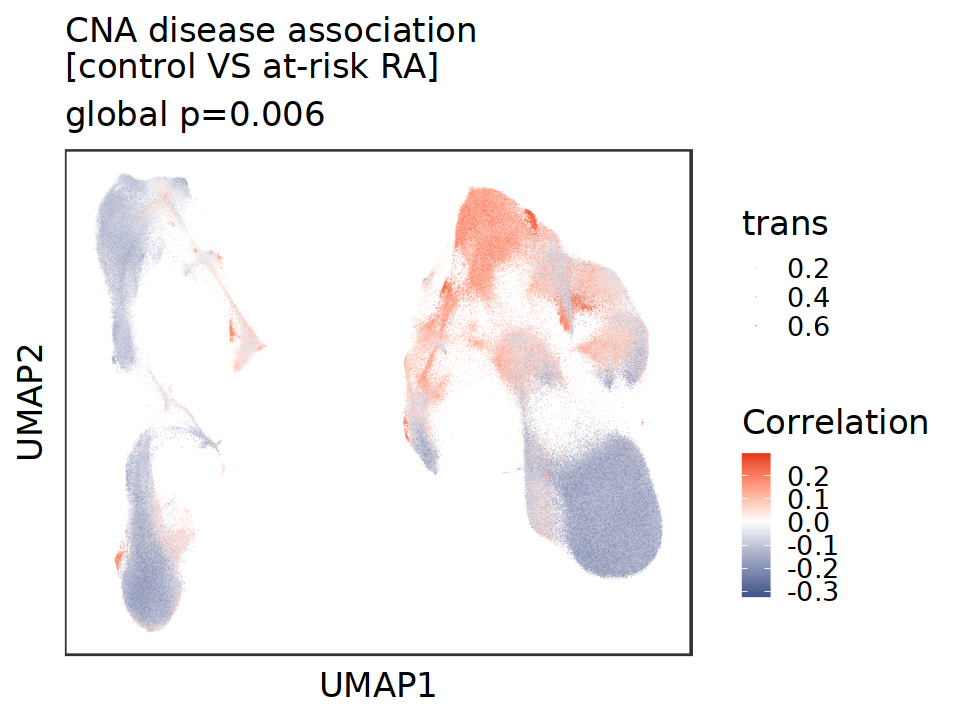

In [35]:
# positive correlation means association with at-risk RA
options(repr.plot.height = 6, repr.plot.width = 8)
cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs)) %>%
    dplyr::mutate(trans = abs(cna_ncorrs)*2) %>%
    ggplot(aes(x = UMAP1, y = UMAP2)) +
       geom_point(
         aes(color = cna_ncorrs, alpha = trans),
           size = 0.001, stroke = 0, shape = 16
       ) +
       scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab"  ) +
       labs(
         x = "UMAP1",
         y = "UMAP2",
         title = 'CNA disease association\n[control VS at-risk RA]', 
         color = 'Correlation',
         subtitle = sprintf('global p=%0.3f', obj_sub@reductions$cna@misc$p)
       ) +
       theme_bw(base_size = 20) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=20)
       )


Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


,cluster,size,model.pvalue,conditionAtRiskRA.OR,conditionAtRiskRA.OR.95pct.ci.lower,conditionAtRiskRA.OR.95pct.ci.upper
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cluster0,cluster0,127818,0.0437147681,0.7940251,0.6360149,0.9912911
cluster1,cluster1,113775,0.0002599211,1.4747811,1.2484941,1.7420822
cluster10,cluster10,43480,0.7309630923,0.9613646,0.8293621,1.1143767
cluster11,cluster11,37121,0.0618274786,1.1723484,1.0321586,1.3315791
cluster12,cluster12,49796,0.8053759734,1.0415431,0.9275553,1.1695388
cluster13,cluster13,30475,0.5096055244,0.8483963,0.6885912,1.0452883
cluster14,cluster14,25266,0.0000861521,1.3097743,1.1704619,1.4656681
cluster15,cluster15,21412,0.2979221019,0.8465501,0.6764671,1.0593967
cluster16,cluster16,12478,0.3229480351,1.1518187,0.9664599,1.3727277


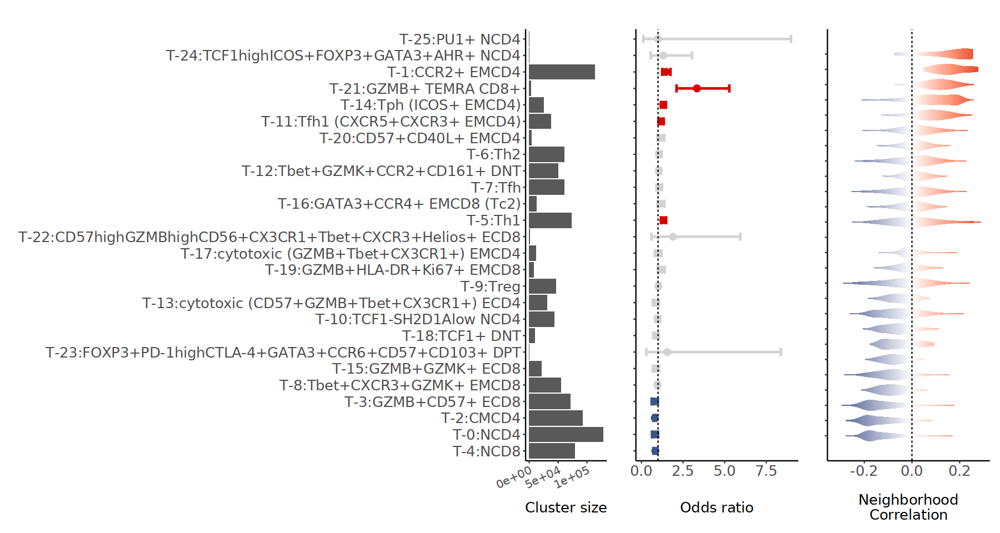

In [36]:
cor_pos = obj_sub@meta.data$cna_ncorrs_fdr05
cor_pos = cor_pos[cor_pos > 0]
# summary(cor_pos)
cor_neg = obj_sub@meta.data$cna_ncorrs_fdr05
cor_neg = cor_neg[cor_neg < 0]
# summary(cor_neg)

ord = cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(med = median(cna_ncorrs)) %>%
    dplyr::arrange(med) %>%
    .$res_cell

p <- cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::mutate(res_cell = factor(res_cell,levels=ord)) %>%
    ggplot(aes(x=res_cell, y=cna_ncorrs)) + 
    geom_violin(trim=TRUE, scale = "width")

mywidth <- .35 # bit of trial and error
# This is all you need for the fill: 
vl_fill <- data.frame(ggplot_build(p)$data) %>%
  mutate(xnew = x- mywidth*violinwidth, xend = x+ mywidth*violinwidth) 

# Bit convoluted for the outline, need to be rearranged: the order matters
vl_poly <- 
  vl_fill %>% 
  select(xnew, xend, y, group) %>%
  pivot_longer(-c(y, group), names_to = "oldx", values_to = "x") %>% 
  arrange(y) %>%
  split(., .$oldx) %>%
  map(., function(x) {
    if(all(x$oldx == "xnew")) x <- arrange(x, desc(y))
    x
    }) %>%
  bind_rows()


if (length(cor_pos)!=0 & length(cor_neg)!=0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        # geom_hline(yintercept=c(min(cor_pos), max(cor_neg)), linetype='dashed', color='black') +
        geom_hline(yintercept=0, linetype='dashed', color='black') +
        theme_classic() +
        coord_flip() +   
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_blank(),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "",
             x = "",
             y = "Neighborhood\nCorrelation") 
  } else if (length(cor_pos)!=0 & length(cor_neg)==0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        # geom_hline(yintercept=c(min(cor_pos)), linetype='dashed', color='black') +
        geom_hline(yintercept=0, linetype='dashed', color='black') +
        theme_classic() +
        coord_flip() +
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_blank(),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "",
             x = "",
             y = "Neighborhood\nCorrelation") 
  } else if (length(cor_pos)==0 & length(cor_neg)!=0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        # geom_hline(yintercept=c(min(cor_neg)), linetype='dashed', color='black') +
        geom_hline(yintercept=0, linetype='dashed', color='black') +
        theme_classic() +
        coord_flip() +
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_blank(),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "",
             x = "",
             y = "Neighborhood\nCorrelation") 
  } else if (length(cor_pos)==0 & length(cor_neg)==0) {
      g1 = ggplot() +
        geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
        geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
        scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
        scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
        geom_hline(yintercept=0, linetype='dashed', color='black') +
        theme_classic() +
        coord_flip() +
        theme(strip.text.x=element_text(size=15, color="black", face="bold"),
              strip.text.y=element_text(size=15, color="black", face="bold"),
              legend.position = "none",
              plot.title = element_text(size=15),
              axis.title.x = element_text(size=15),
              axis.title.y = element_text(size =15),
              axis.text.y = element_blank(),
              axis.text.x = element_text(size =15),
              legend.text =  element_text(size = 15),
              legend.key.size = grid::unit(0.5, "lines"),
              legend.title = element_text(size = 0.8, hjust = 0)) +
        labs(title = "",
             x = "",
             y = "Neighborhood\nCorrelation") 
  }

# MASC: Mixed-effects association testing for single cells
## Sci Transl Med. 2018 Oct 17;10(463):eaaq0305.

masc = readRDS(file = paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/MASC_Control_AtRiskRA_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
masc
g2 = masc %>%
  magrittr::set_colnames(c("cluster","size","model.pvalue","OR","CIlower","CIupper")) %>%
    dplyr::mutate(col = dplyr::case_when(
      CIupper < 1 ~ '#3C5488FF',
      CIlower > 1 ~ '#DC0000FF',
      TRUE ~ "lightgray"),
                 CIupper = ifelse(CIupper>100 & model.pvalue>0.05, 1, CIupper),
                 CIlower = ifelse(CIlower<0.01 & model.pvalue>0.05, 1, CIlower),
                 OR = ifelse(CIupper==1|CIlower==1,1,OR)) %>%
  dplyr::mutate(cluster = gsub("cluster","",cluster),
                cluster = factor(cluster,levels=ord)) %>%
  ggplot(., aes(y=cluster, x=OR, colour=col)) + 
  geom_point(position=position_dodge(width=0.3), size=3) +
  geom_errorbarh(aes(xmin=CIlower, xmax=CIupper), position = position_dodge(0.3), height=0.5, linewidth = 1) +
  scale_color_manual(values = c('#3C5488FF' = '#3C5488FF', '#DC0000FF' = '#DC0000FF', "lightgray" = "lightgray")) + 
  scale_y_discrete(labels=cluster_df %>%
    magrittr::set_rownames(cluster_df$cluster) %>%
    .[ord,] %>% .$clu_name) +
  geom_vline(xintercept=1, linetype='dashed', color='black') +
  theme_classic() +
  theme(strip.text.x=element_text(size=15, color="black", face="bold"),
        strip.text.y=element_text(size=15, color="black", face="bold"),
        legend.position = "none",
        plot.title = element_text(size=15),
        axis.title.x = element_text(size=15),
        axis.title.y = element_text(size =15),
        axis.text.y = element_blank(),
        axis.text.x = element_text(size = 15),
        legend.text =  element_text(size = 15),
        legend.key.size = grid::unit(0.5, "lines"),
        legend.title = element_text(size = 0.8, hjust = 0)) +
  labs(title = "",
       y = "",
       x = "Odds ratio")

g3 = masc %>%
  magrittr::set_colnames(c("cluster","size","model.pvalue","OR","CIlower","CIupper")) %>%
    dplyr::mutate(col = dplyr::case_when(
      CIupper < 1 ~ '#3C5488FF',
      CIlower > 1 ~ '#DC0000FF',
      TRUE ~ "lightgray"),
                 CIupper = ifelse(CIupper>100 & model.pvalue>0.05, 1, CIupper),
                 CIlower = ifelse(CIlower<0.01 & model.pvalue>0.05, 1, CIlower),
                 OR = ifelse(CIupper==1|CIlower==1,1,OR)) %>%
  dplyr::mutate(cluster = gsub("cluster","",cluster),
                cluster = factor(cluster,levels=ord)) %>%
  ggplot(., aes(y=cluster, x=size)) + 
  geom_bar(stat = "identity", position=position_dodge()) + 
  scale_y_discrete(labels=paste0("T-",
                                 cluster_df %>%
                                   magrittr::set_rownames(cluster_df$cluster) %>%
                                   .[ord,] %>% .$cluster,
                                 ":",
                                 cluster_df %>%
                                   magrittr::set_rownames(cluster_df$cluster) %>%
                                   .[ord,] %>% .$clu_name)
  ) +
  theme_classic() +
  theme(strip.text.x=element_text(size=15, color="black", face="bold"),
        strip.text.y=element_text(size=15, color="black", face="bold"),
        legend.position = "none",
        plot.title = element_text(size=15),
        axis.title.x = element_text(size=15),
        axis.title.y = element_text(size =15),
        axis.text.y = element_text(size = 15),
        axis.text.x = element_text(size = 12, angle = 25, hjust = 1),
        legend.text =  element_text(size = 15),
        legend.key.size = grid::unit(0.5, "lines"),
        legend.title = element_text(size = 0.8, hjust = 0)) +
  labs(title = "",
       y = "",
       x = "Cluster size")
options(repr.plot.height = 8, repr.plot.width = 15)
(g3+g2+g1)+plot_layout(widths = c(1,2,2))

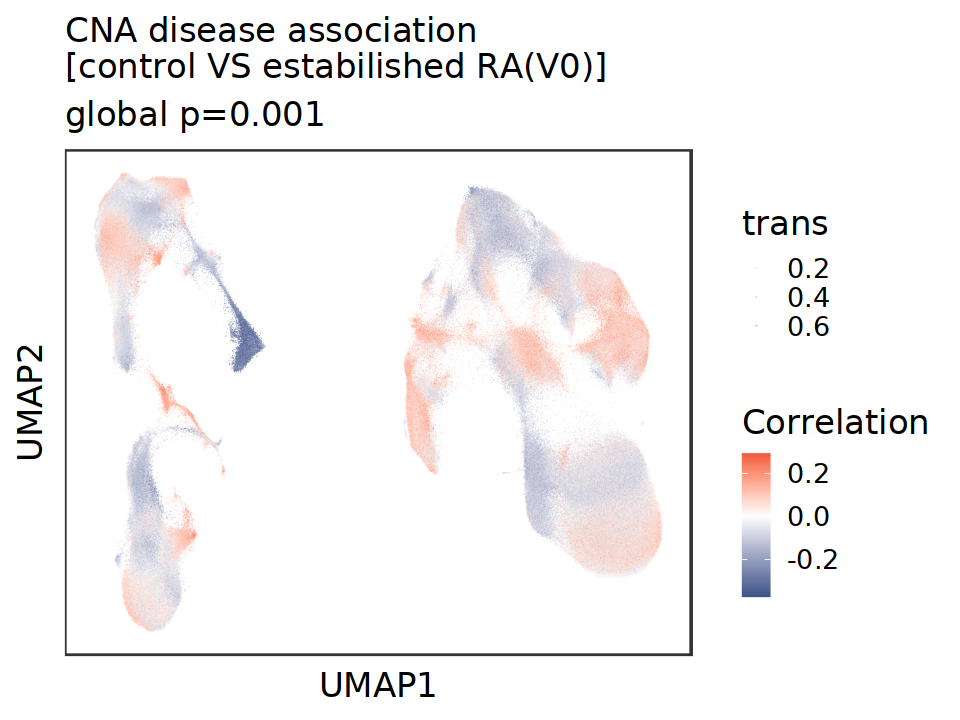

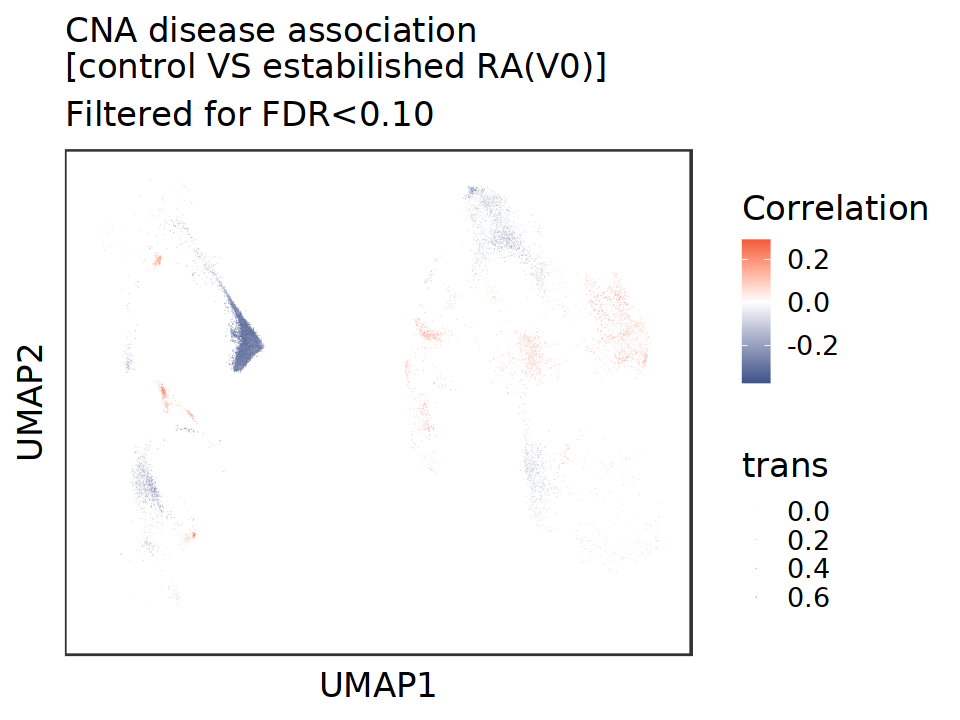

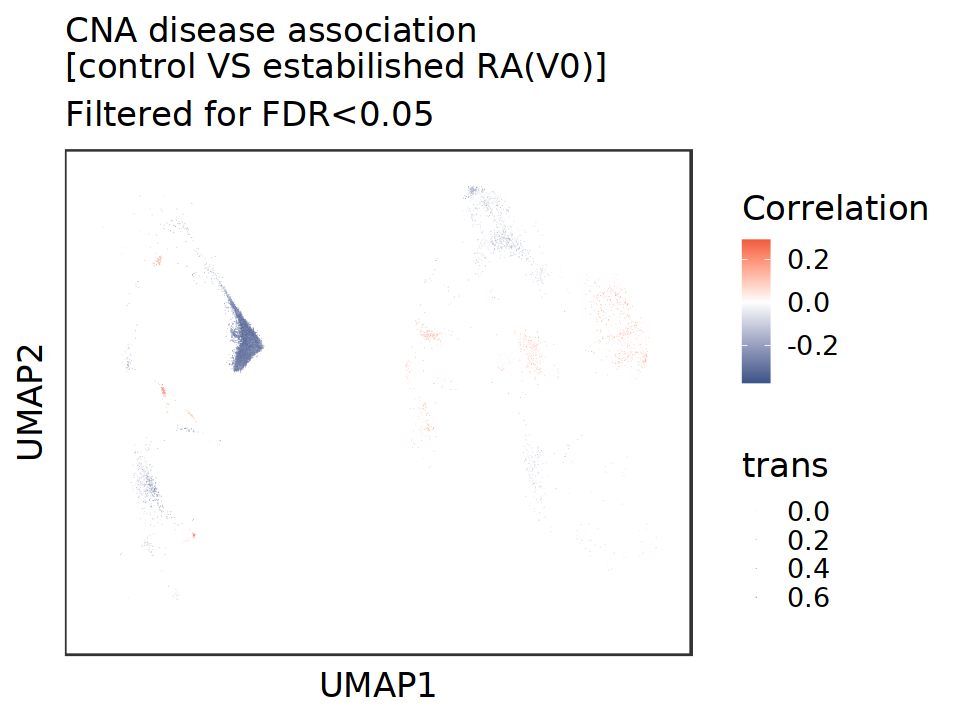

In [37]:
# Control vs RA(V0)

logi = (obj$condition %in% c("RA","Control")) & (obj$time_point == "V0")
obj_sub = readRDS(paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/SeuratObj_Control_RAV0_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
# positive correlation means association with estabilished RA
options(repr.plot.height = 6, repr.plot.width = 8)
cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs)) %>%
    dplyr::mutate(trans = abs(cna_ncorrs)*2) %>%
    ggplot(aes(x = UMAP1, y = UMAP2)) +
       geom_point(
         aes(color = cna_ncorrs, alpha = trans),
           size = 0.001, stroke = 0, shape = 16
       ) +
       scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab"  ) +
       labs(
         x = "UMAP1",
         y = "UMAP2",
         title = 'CNA disease association\n[control VS estabilished RA(V0)]', 
         color = 'Correlation',
         subtitle = sprintf('global p=%0.3f', obj_sub@reductions$cna@misc$p)
       ) +
       theme_bw(base_size = 20) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=20)
       )

options(repr.plot.height = 6, repr.plot.width = 8)
cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs_fdr10)) %>%
    dplyr::mutate(trans = abs(cna_ncorrs_fdr10)*2) %>%
    ggplot(aes(x = UMAP1, y = UMAP2)) +
       geom_point(
         aes(color = cna_ncorrs_fdr10, alpha = trans),
           size = 0.001, stroke = 0, shape = 16
       ) +
       scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab"  ) +
       labs(
         x = "UMAP1",
         y = "UMAP2",
         title = 'CNA disease association\n[control VS estabilished RA(V0)]', 
         color = 'Correlation',
         subtitle = "Filtered for FDR<0.10"
       ) +
       theme_bw(base_size = 20) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=20)
       )

options(repr.plot.height = 6, repr.plot.width = 8)
cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs_fdr05)) %>%
    dplyr::mutate(trans = abs(cna_ncorrs_fdr05)*2) %>%
    ggplot(aes(x = UMAP1, y = UMAP2)) +
       geom_point(
         aes(color = cna_ncorrs_fdr05, alpha = trans),
           size = 0.001, stroke = 0, shape = 16
       ) +
       scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab"  ) +
       labs(
         x = "UMAP1",
         y = "UMAP2",
         title = 'CNA disease association\n[control VS estabilished RA(V0)]', 
         color = 'Correlation',
         subtitle = "Filtered for FDR<0.05"
       ) +
       theme_bw(base_size = 20) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=20)
       )

,cluster,size,model.pvalue,conditionRA.OR,conditionRA.OR.95pct.ci.lower,conditionRA.OR.95pct.ci.upper
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cluster0,cluster0,158531,5.454581e-01,1.0592688,0.89496307,1.2537393
cluster1,cluster1,101179,5.529067e-01,0.9482403,0.85772939,1.0483022
cluster10,cluster10,49944,7.134643e-01,0.9597169,0.84808343,1.0860446
cluster11,cluster11,41231,5.131554e-02,1.1901114,1.06100140,1.3349324
cluster12,cluster12,38123,4.860500e-09,0.4400042,0.31814435,0.6085403
cluster13,cluster13,36031,5.819381e-01,0.8693590,0.76520752,0.9876864
cluster14,cluster14,26767,3.391974e-03,1.1986771,1.08737648,1.3213702
cluster15,cluster15,23362,1.746788e-01,0.7989280,0.65314213,0.9772543
cluster16,cluster16,18809,1.185624e-02,1.5414994,1.32034057,1.7997027


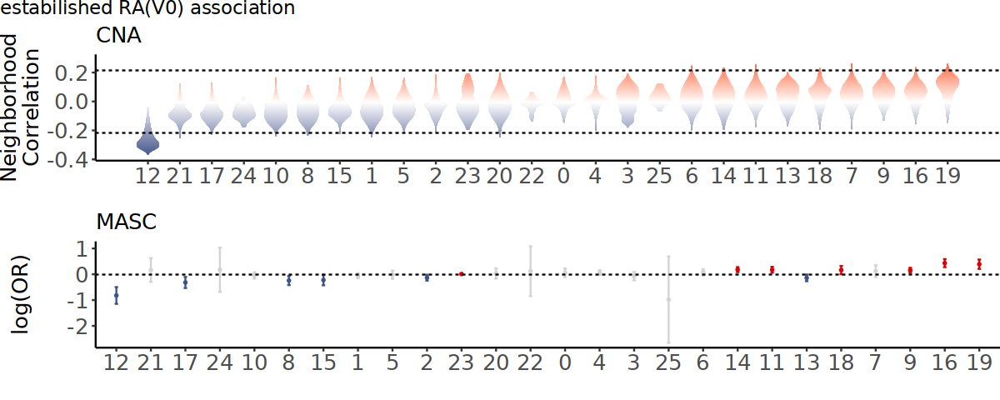

In [38]:
cor_pos = obj_sub@meta.data$cna_ncorrs_fdr05
cor_pos = cor_pos[cor_pos > 0]
# summary(cor_pos)
cor_neg = obj_sub@meta.data$cna_ncorrs_fdr05
cor_neg = cor_neg[cor_neg < 0]
# summary(cor_neg)

ord = cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::group_by(res_cell) %>%
    dplyr::summarize(med = median(cna_ncorrs)) %>%
    dplyr::arrange(med) %>%
    .$res_cell

p <- cbind(umap_res[logi,],obj_sub@meta.data) %>%
    dplyr::select(c(UMAP1,UMAP2,cna_ncorrs,res_cell)) %>%
    dplyr::mutate(res_cell = factor(res_cell,levels=ord)) %>%
    ggplot(aes(x=res_cell, y=cna_ncorrs)) + 
    geom_violin(trim=TRUE, scale = "width")

mywidth <- .35 # bit of trial and error
# This is all you need for the fill: 
vl_fill <- data.frame(ggplot_build(p)$data) %>%
  mutate(xnew = x- mywidth*violinwidth, xend = x+ mywidth*violinwidth) 

# Bit convoluted for the outline, need to be rearranged: the order matters
vl_poly <- 
  vl_fill %>% 
  select(xnew, xend, y, group) %>%
  pivot_longer(-c(y, group), names_to = "oldx", values_to = "x") %>% 
  arrange(y) %>%
  split(., .$oldx) %>%
  map(., function(x) {
    if(all(x$oldx == "xnew")) x <- arrange(x, desc(y))
    x
    }) %>%
  bind_rows()

if (length(cor_pos)!=0 & length(cor_neg)!=0) {
  g1 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
    geom_hline(yintercept=c(min(cor_pos), max(cor_neg)), linetype='dashed', color='black') +
    theme_classic() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "CNA",
         x = "",
         y = "Neighborhood\nCorrelation") 
} else if (length(cor_pos)!=0 & length(cor_neg)==0) {
  g1 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
    geom_hline(yintercept=c(min(cor_pos)), linetype='dashed', color='black') +
    theme_classic() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "CNA",
         x = "",
         y = "Neighborhood\nCorrelation") 
} else if (length(cor_pos)==0 & length(cor_neg)!=0) {
  g1 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
    geom_hline(yintercept=c(min(cor_neg)), linetype='dashed', color='black') +
    theme_classic() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "CNA",
         x = "",
         y = "Neighborhood\nCorrelation") 
} else if (length(cor_pos)==0 & length(cor_neg)==0) {
  g1 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, breaks=1:length(unique(ord)) , limits=c(min(vl_poly$x),max(vl_poly$x))) +
    theme_classic() +
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "CNA",
         x = "",
         y = "Neighborhood\nCorrelation") 
}

# MASC: Mixed-effects association testing for single cells
## Sci Transl Med. 2018 Oct 17;10(463):eaaq0305.

masc = readRDS(file = paste0("/projects/jinamo@xsede.org/cytof/data/T_cells/MASC_Control_RAV0_Prop",prop,"_Nmin",n_min,"_topVar",frac,"_nneighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,".rds"))
masc
g2 = masc %>%
  magrittr::set_colnames(c("cluster","size","model.pvalue","OR","CIlower","CIupper")) %>%
    dplyr::mutate(col = dplyr::case_when(
      CIupper < 1 ~ '#3C5488FF',
      CIlower > 1 ~ '#DC0000FF',
      TRUE ~ "lightgray"),
                 CIupper = ifelse(CIupper>100 & model.pvalue>0.05, 1, CIupper),
                 CIlower = ifelse(CIlower<0.01 & model.pvalue>0.05, 1, CIlower),
                 OR = ifelse(CIupper==1|CIlower==1,1,OR)) %>%
  dplyr::mutate(cluster = gsub("cluster","",cluster),
                cluster = factor(cluster,levels=ord)) %>%
  ggplot(., aes(y=cluster, x=log(OR), colour=col)) + 
  geom_point(position=position_dodge(width=0.3), size=0.5) +
  geom_errorbarh(aes(xmin=log(CIlower), xmax=log(CIupper)), position = position_dodge(0.3), height=0.1) +
  scale_color_manual(values = c('#3C5488FF' = '#3C5488FF', '#DC0000FF' = '#DC0000FF', "lightgray" = "lightgray")) + 
  geom_vline(xintercept=0, linetype='dashed', color='black') +
  theme_classic() +
  coord_flip() +
  theme(strip.text.x=element_text(size=15, color="black", face="bold"),
        strip.text.y=element_text(size=15, color="black", face="bold"),
        legend.position = "none",
        plot.title = element_text(size=15),
        axis.title.x = element_text(size=15),
        axis.title.y = element_text(size =15),
        axis.text.y = element_text(size = 15),
        axis.text.x = element_text(size = 15),
        legend.text =  element_text(size = 15),
        legend.key.size = grid::unit(0.5, "lines"),
        legend.title = element_text(size = 0.8, hjust = 0)) +
  labs(title = "MASC",
       y = "",
       x = "log(OR)")

options(repr.plot.height = 4, repr.plot.width = 10)
(g1/guide_area()/g2) + 
    plot_layout(heights = c(3,0,3),guides = "collect") +
    plot_annotation(title = 'estabilished RA(V0) association')& theme(plot.margin = unit(c(0,0,0,0), "cm"))